# AC 209A Final Project: Boston Crime
Author: Joslyn Fu, Katherine Hu, Chenwei Wu, Lu Yu

Date: 12/10/2021

**Introduction**

Recent tragedies at higher education institutions have called our team’s attention to crime cases. The graduate student at Columbia University, Davide Giri, was fatally stabbed in December 2021.  An 18-year-old man has been arrested and charged with the murder of a UChicago graduate student shot and killed during a robbery near the school campus in November 2021. In Boston, the chance of becoming a victim of violent crime is 1 in 151, and the chance of becoming a victim of property crime is 1 in 51. Due to our proximity to Boston, we intend to understand what factors contribute to different types of crime in the Boston area from 2020 to 2021. 

We divided all types of crimes into 3 major categories. Violence crimes include simple assault, etc., property-related crimes include larceny, vandalism, investigate property, larceny from motor vehicle, etc., and other more trivial crimes include motor vehicle accident response, investigate person, medical assistance, fraud, towed, etc. For violence crime, we specifically sift out shooting crimes to see how shooting is different from other violent crimes. We build classification models to predict the type of crime with predictors, composed of various variables extracted from weather, location, MBTA ridership, neighborhood, streetlight, economic, and property assessment data. 

Based on the above classification of crimes, our research directions are as below:
Shooting: we want to see how shooting is different from other violent crimes. We suspect that there are some factors that are more correlated with shooting crimes versus other violent crimes like robbery and assault. We are interested in exploring the major contributing factors to shooting crimes.
Violence crimes: We are interested in how violence crimes are different from property crimes and other trivial crimes in terms of when and where it occurred. We are interested in exploring the major contributing factors to violence crimes.
Property crimes: Similar to violence crimes, we are interested in the difference between property crimes and all other crimes. We are interested in exploring the major contributing factors to property-related crimes.
Other more trivial crimes: Similar to violence crimes, we are interested in the difference between other trivial crimes and all other crimes. We are interested in exploring the major contributing factors to other more trivial crimes.


**Table of Contents**


1.   Data Retrieval, preprocessing and EDA for each data source
2.   Merging all data from each data source
3.   Result Interpretation (train the best model for each target value and use SHAP, Eli 5, and LIME to interprate the trained model)
4.   Model Selection Process (this step was done before the result interpretation. But it is moved to after result interpretation section because it is too long and simply doing model training and hyperparameter tuning)
5.   Code to visualize Grid Search 3D result



# 1. Data Retrieval, Preprocess, and EDA

## Data 1. Crime Data 

### Load Crime Incident Reports
Crime incident reports are available on [Analyze Boston](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system) provided by Boston Police Department (BPD). The data ranges from 2015 to 2021, and due to time limitation and the potential impact of COVID-19, we decided to use data since 2019 and manually downloaded files [CRIME INCIDENT REPORTS - 2019](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system/resource/34e0ae6b-8c94-4998-ae9e-1b51551fe9ba), [CRIME INCIDENT REPORTS - 2020](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system/resource/be047094-85fe-4104-a480-4fa3d03f9623), and [CRIME INCIDENT REPORTS - 2021](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system/resource/f4495ee9-c42c-4019-82c1-d067f07e45d2). Since the offense code group column of crim incident data since 2019 is missing, we also used files [CRIME INCIDENT REPORTS - 2018](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system/resource/e86f8e38-a23c-4c1a-8455-c8f94210a8f1) and [CRIME INCIDENT REPORTS - 2017](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system/resource/64ad0053-842c-459b-9833-ff53d568f2e3) to generate the mapping and fill in this column.

In [ ]:
d2019=pd.read_csv("2019.csv")
d2020=pd.read_csv("2020.csv")
d2021=pd.read_csv("2021.csv")
d2018=pd.read_csv("2018.csv")
d2017=pd.read_csv("2017.csv")

In [ ]:
codemap2018=d2018[['OFFENSE_CODE', 'OFFENSE_CODE_GROUP']]
codemap2017=d2017[['OFFENSE_CODE', 'OFFENSE_CODE_GROUP']]

In [ ]:
def merge(d1,d2):
    d={}
    for key in set(list(d1.keys()) + list(d2.keys())):
        try:
            d.setdefault(key,[]+(d1[key].tolist()))      
        except KeyError:
            pass

        try:
            d.setdefault(key,[]+(d2[key].tolist()))          
        except KeyError:
            pass
    return d

In [ ]:
gp1=codemap2018.groupby(by='OFFENSE_CODE_GROUP')
mapping=gp1['OFFENSE_CODE'].agg(['unique'])
d1=mapping.to_dict()['unique']

gp2=codemap2017.groupby(by='OFFENSE_CODE_GROUP')
mapping=gp2['OFFENSE_CODE'].agg(['unique'])
d2=mapping.to_dict()['unique']

grand_dict=merge(d1,d2)

In [ ]:
grand_dict

{'Aircraft': [3122],
 'Arson': [900],
 'Commercial Burglary': [542, 540, 541],
 'Fraud': [1107, 1102, 1109, 1108],
 'Prisoner Related Incidents': [2619, 2636, 3029],
 'Service': [3402],
 'Robbery': [301, 361, 311, 351, 381, 371, 335],
 'Verbal Disputes': [3301],
 'Recovered Stolen Property': [1300, 1304],
 'Firearm Discovery': [3119, 3203],
 'Motor Vehicle Accident Response': [3802,
  3831,
  3830,
  3820,
  3807,
  3801,
  3803,
  3811,
  3821,
  3805,
  3810],
 'Criminal Harassment': [2670],
 'Gambling': [1901],
 'HUMAN TRAFFICKING': [1610],
 'Operating Under the Influence': [2101, 2102],
 'Larceny': [619, 617, 616, 613, 611, 612, 618, 637],
 'Restraining Order Violations': [2007, 2006],
 'Property Found': [3207, 3202],
 'Auto Theft Recovery': [735],
 'Phone Call Complaints': [2628],
 'Ballistics': [2662],
 'Manslaughter': [121, 123],
 'Homicide': [111],
 'Search Warrants': [3130],
 'Property Lost': [3208, 3201],
 'License Violation': [3111],
 'Harbor Related Incidents': [3116],
 'Mi

### Fill in `OFFENSE_CODE_GROUP` column



Since the `OFFENSE_CODE_GROUP` column in the crime incident data since 2019 is missing, we need to fill in this column based on the crime code to classify the incident for future expooration and investigation. The data before 2019 has this column filled, so we used data in 2017 and 2018 to build a mapping from crime code to offense code group and fill in the value based on this dictionary.

In [ ]:
d2021[d2021['OFFENSE_CODE'].isin(flatten(grand_dict.values()))].shape[0]/d2021.shape[0]

0.9253877932808481

In [ ]:
d2020[d2020['OFFENSE_CODE'].isin(flatten(grand_dict.values()))].shape[0]/d2020.shape[0]

0.9329280334019804

In [ ]:
d2019[d2019['OFFENSE_CODE'].isin(flatten(grand_dict.values()))].shape[0]/d2019.shape[0]

0.993521572571699

In [ ]:
def flatten(t):
    return [item for sublist in t for item in sublist]

In [ ]:
d2021_clean=d2021[d2021['OFFENSE_CODE'].isin(flatten(grand_dict.values()))].copy()
d2020_clean=d2020[d2020['OFFENSE_CODE'].isin(flatten(grand_dict.values()))].copy()
d2019_clean=d2019[d2019['OFFENSE_CODE'].isin(flatten(grand_dict.values()))].copy()

In [ ]:
d2020.isna().sum()

INCIDENT_NUMBER            0
OFFENSE_CODE               0
OFFENSE_CODE_GROUP     70894
OFFENSE_DESCRIPTION        0
DISTRICT                 278
REPORTING_AREA             0
SHOOTING                   0
OCCURRED_ON_DATE           0
YEAR                       0
MONTH                      0
DAY_OF_WEEK                0
HOUR                       0
UCR_PART               70894
STREET                     1
Lat                        0
Long                       0
Location                   0
dtype: int64

In [ ]:
def getter(a,d):
    keys = [k for k, v in d.items() if a in v]
    return keys[0]

def cleaner(d):
    d['OFFENSE_CODE_GROUP']=d['OFFENSE_CODE'].apply(lambda x:  getter(x,grand_dict) if x in flatten(grand_dict.values()) else None )
    return d

In [ ]:
d21=cleaner(d2021_clean)
d20=cleaner(d2020_clean)
d19=cleaner(d2019_clean)

data_all=pd.concat([d20,d21,d19])

In [ ]:
df=data_all.drop(['UCR_PART'],axis=1)
df.dropna(inplace=True)

In [ ]:
df.isna().sum()

INCIDENT_NUMBER        0
OFFENSE_CODE           0
OFFENSE_CODE_GROUP     0
OFFENSE_DESCRIPTION    0
DISTRICT               0
REPORTING_AREA         0
SHOOTING               0
OCCURRED_ON_DATE       0
YEAR                   0
MONTH                  0
DAY_OF_WEEK            0
HOUR                   0
STREET                 0
Lat                    0
Long                   0
Location               0
dtype: int64

In [ ]:
df.shape

(190584, 16)

In [ ]:
df.drop_duplicates(subset="INCIDENT_NUMBER", inplace=True)

In [ ]:
df.shape

(189942, 16)

In [ ]:
df.describe()

,OFFENSE_CODE,SHOOTING,YEAR,MONTH,HOUR,Lat,Long
count,189942.000000,189942.000000,189942.000000,189942.000000,189942.000000,189942.000000,1.899420e+05
mean,2322.987012,0.013388,2019.955892,5.964273,12.901928,26.883513,-4.515307e+01
std,1212.750402,0.114931,0.806973,3.093773,6.385099,20.372793,3.421777e+01
min,111.000000,0.000000,2019.000000,1.000000,0.000000,0.000000,-7.117867e+01
25%,802.000000,0.000000,2019.000000,3.000000,9.000000,0.000000,-7.108563e+01
50%,3006.000000,0.000000,2020.000000,6.000000,14.000000,42.292788,-7.105971e+01
75%,3205.000000,0.000000,2021.000000,8.000000,18.000000,42.336132,0.000000e+00
max,3831.000000,1.000000,2021.000000,12.000000,23.000000,42.395042,5.249691e-08


In [ ]:
df.columns=[x.upper() for x in df.columns.values]

In [ ]:
df.dtypes

INCIDENT_NUMBER         object
OFFENSE_CODE             int64
OFFENSE_CODE_GROUP      object
OFFENSE_DESCRIPTION     object
DISTRICT                object
REPORTING_AREA          object
SHOOTING                 int64
OCCURRED_ON_DATE        object
YEAR                     int64
MONTH                    int64
DAY_OF_WEEK             object
HOUR                     int64
STREET                  object
LAT                    float64
LONG                   float64
LOCATION                object
dtype: object

In [ ]:
df['OFFENSE_CODE_GROUP']=df['OFFENSE_CODE_GROUP'].apply(lambda x: x.upper())

### Crime Data - EDA

Top 10 types of crimes

In [ ]:
top_10=df['OFFENSE_CODE_GROUP'].value_counts().sort_values(ascending=False).head(10)
top_10

MOTOR VEHICLE ACCIDENT RESPONSE    25365
LARCENY                            17193
INVESTIGATE PERSON                 15527
MEDICAL ASSISTANCE                 13276
VANDALISM                           9267
SIMPLE ASSAULT                      9202
INVESTIGATE PROPERTY                9024
TOWED                               7744
OTHER                               7525
LARCENY FROM MOTOR VEHICLE          7302
Name: OFFENSE_CODE_GROUP, dtype: int64

Text(0, 0.5, 'Number of Crimes')

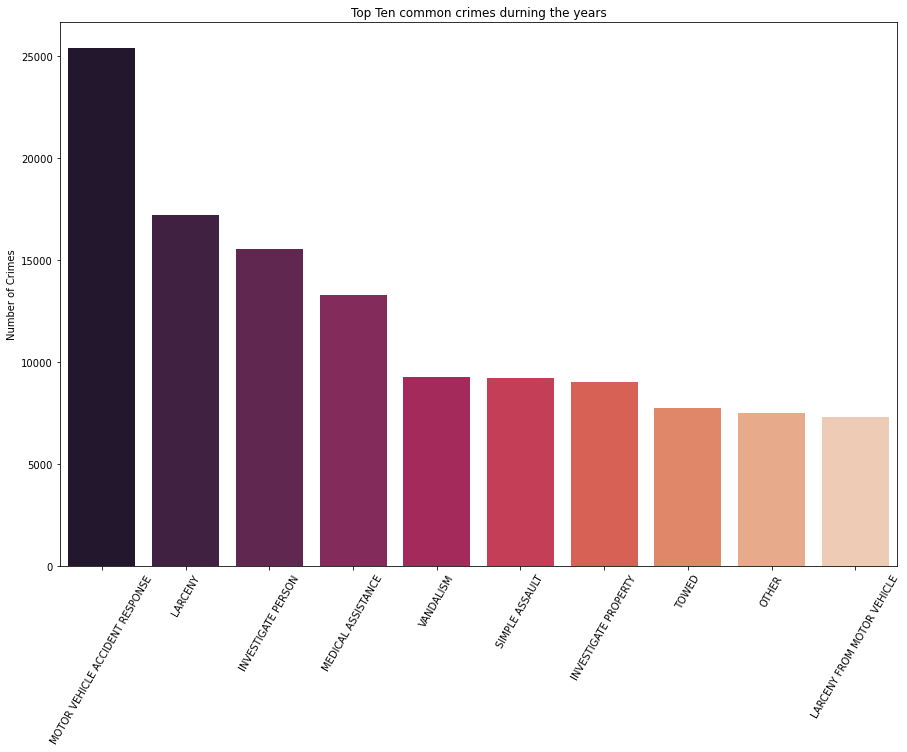

In [ ]:
plt.figure(figsize=(15,10))

plt.title("Top Ten common crimes durning the years")

sns.barplot(x=top_10.index,y=top_10,palette='rocket')

plt.xticks(rotation=60)

plt.ylabel("Number of Crimes")

Major Crimes in Boston

In [ ]:
import plotly.graph_objects as go
import plotly.express as px
def treemap(categories,title,path,values):
    fig = px.treemap(categories, path=path, values=values, height=700,
                 title=title, color_discrete_sequence = px.colors.sequential.RdBu)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()
Number_crimes = df['OFFENSE_CODE_GROUP'].value_counts()
values = Number_crimes.values
categories = pd.DataFrame(data=Number_crimes.index, columns=["OFFENSE_CODE_GROUP"])
categories['values'] = values
treemap(categories,'Major Crimes in Boston',['OFFENSE_CODE_GROUP'],categories['values'])


Number of crimes across the years

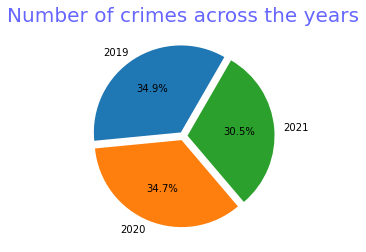

In [ ]:
plt.title('Number of crimes across the years',fontsize=20,color='b',alpha=0.6)

explode = (0.05, 0.05,0.05)
labels = ['2019','2020','2021']


plt.pie(years, explode=explode,startangle=60, labels=labels,autopct='%0.01f%%')

plt.show()

Number Of Crimes Each Month

[Text(0.5, 1.0, 'Number Of Crimes Each Month')]

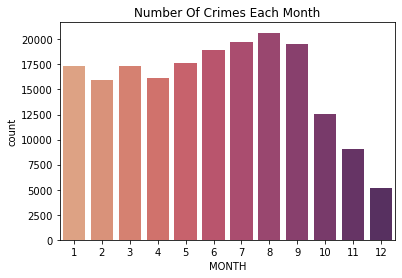

In [ ]:
sns.countplot(x ="MONTH", data = df.reset_index(), palette="flare").set(title='Number Of Crimes Each Month')

Number Of Crimes Each Day in Week

  DAY_OF_WEEK  INCIDENT_NUMBER
0      Friday            29083
1   Wednesday            27880
2    Thursday            27549
3      Monday            27193
4     Tuesday            27133
5    Saturday            27016
6      Sunday            24088


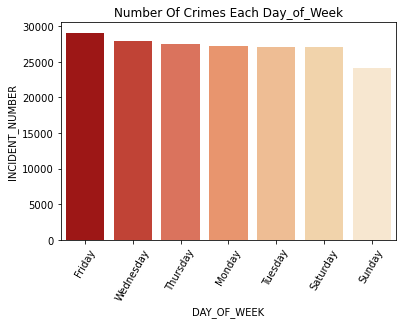

In [ ]:
day_counts = df.groupby('DAY_OF_WEEK').count()['INCIDENT_NUMBER'].sort_values(ascending=False).to_frame().reset_index()
ax = sns.barplot(x = 'DAY_OF_WEEK', y='INCIDENT_NUMBER', data = day_counts, palette='OrRd_r')
plt.xticks(rotation=60)
plt.title('Number Of Crimes Each Day_of_Week')
print(day_counts)

Number of Crimes Each Hour

In [ ]:
dayofweek = df.DAY_OF_WEEK
hour = df.HOUR

fig = go.Figure(go.Histogram2d(x=dayofweek,y=hour))
fig.update_xaxes(categoryarray=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
fig.update_layout(title_text='Number Of Crimes Each Hour', title_font_color='darkred', title_font_size=25, title_x=0.5)
fig.show()

There are 6616 crimes with time documented as 00:00:00.
The top 10 types of crimes covers 70.9039% of the crimes that happens at 00:00:00.
The top 10 types of crimes are:
FRAUD                              1159
LARCENY                             648
PROPERTY LOST                       511
INVESTIGATE PERSON                  500
MOTOR VEHICLE ACCIDENT RESPONSE     498
VANDALISM                           332
LARCENY FROM MOTOR VEHICLE          323
OTHER                               255
CONFIDENCE GAMES                    236
INVESTIGATE PROPERTY                229
Name: OFFENSE_CODE_GROUP, dtype: int64


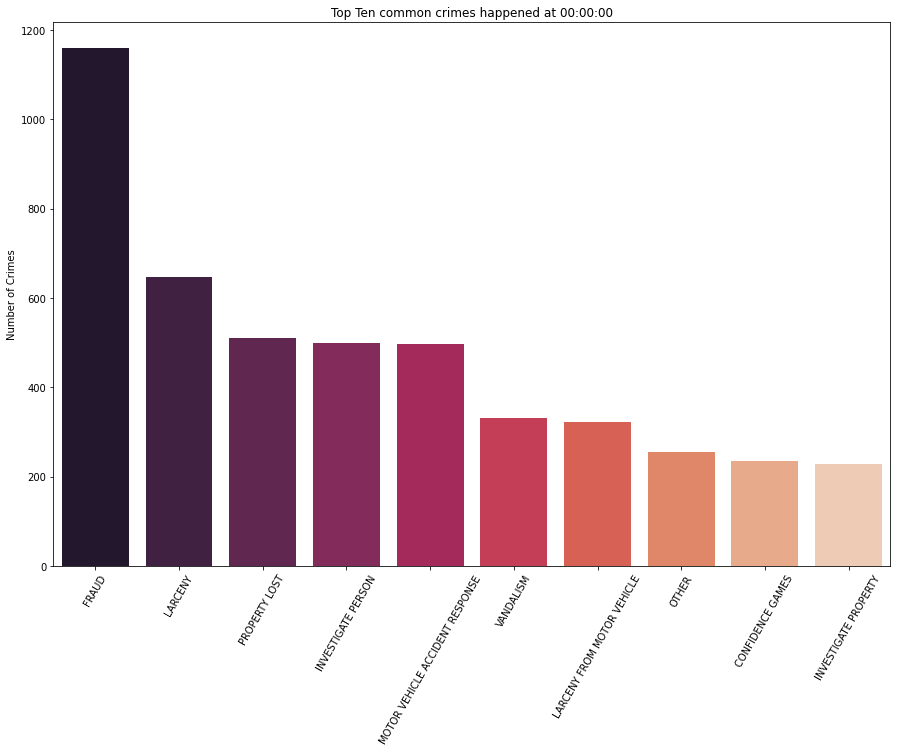

In [ ]:
top_10 = df[df.OCCURRED_ON_DATE.str.contains("00:00:00")==True].OFFENSE_CODE_GROUP.value_counts().sort_values(ascending=False).head(10)
# total_count = df[df.HOUR == 0].shape[0]
total_count = df[df.OCCURRED_ON_DATE.str.contains("00:00:00")==True].shape[0]
print(f"There are {total_count} crimes with time documented as 00:00:00.")
print(f"The top 10 types of crimes covers {(top_10.sum()/ total_count)*100:.4f}% of the crimes that happens at 00:00:00.")
print(f"The top 10 types of crimes are:")
print(top_10)

plt.figure(figsize=(15,10))
sns.barplot(x=top_10.index,y=top_10,palette='rocket')
plt.xticks(rotation=60)
plt.ylabel("Number of Crimes")
plt.title("Top Ten common crimes happened at 00:00:00")
plt.show()

In [ ]:
crime_updated = df[df.OCCURRED_ON_DATE.str.contains("00:00:00")==False]
dayofweek = crime_updated.DAY_OF_WEEK
hour = crime_updated.HOUR

fig = go.Figure(go.Histogram2d(x=dayofweek,y=hour))
fig.update_xaxes(categoryarray=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
fig.update_layout(title_text='Number Of Crimes Each Hour (00:00:00 removed)', title_font_color='darkred', title_font_size=25, title_x=0.5)
fig.show()

The most dangerous places in Boston

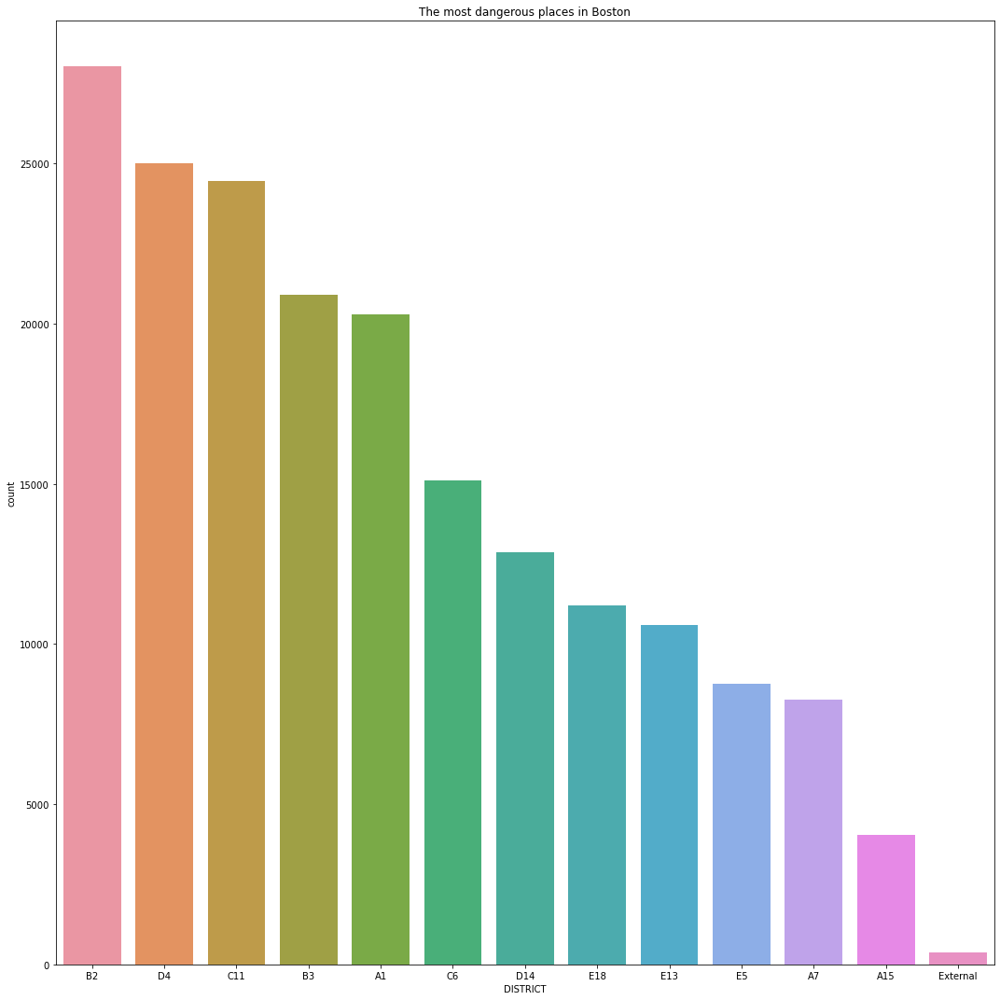

In [ ]:
plt.figure(figsize=(15,15))
order = df['DISTRICT'].value_counts(ascending=False).index
sns.countplot(x='DISTRICT', data=df, order=order)
plt.title('The most dangerous places in Boston')
plt.tight_layout()

Text(0, 0.5, 'Number of Crimes')

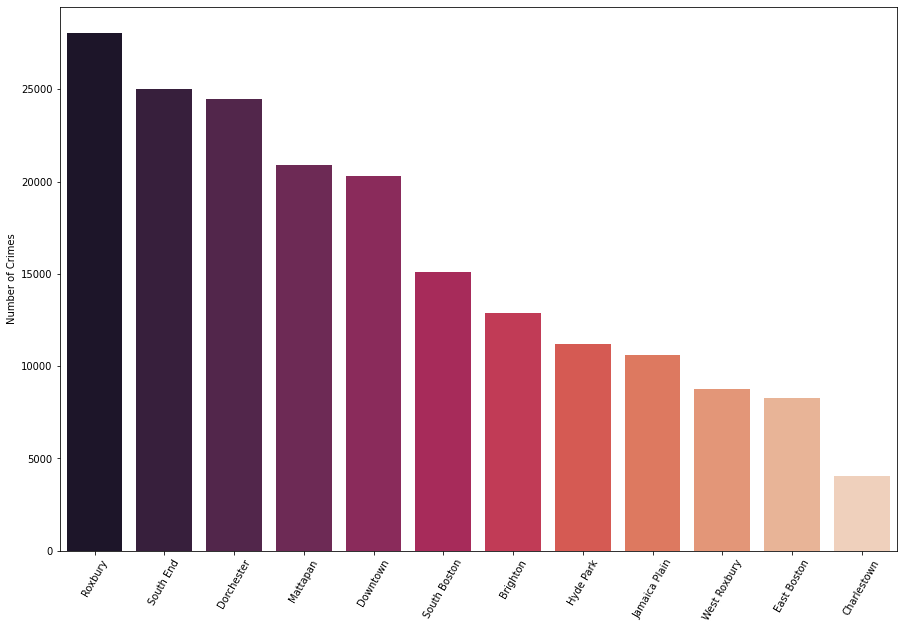

In [ ]:
top_10=df['district_map'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(15,10))
sns.barplot(x=top_10.index,y=top_10,palette='rocket')

plt.xticks(rotation=60)

plt.ylabel("Number of Crimes")

Crime incidents on a map (takes long time to run)

In [ ]:
# m = folium.Map(location=[42.3632, -71.1273], zoom_start=13)
# cluster = MarkerCluster()
# for idx, row in df.iterrows(): 
#     if not math.isnan(row['LONG']) and not math.isnan(row['LAT']):
#         cluster.add_child(Marker([row['LAT'], row['LONG']]))

# m.add_child(cluster)

Plot crime type distribution in each neighborhood 

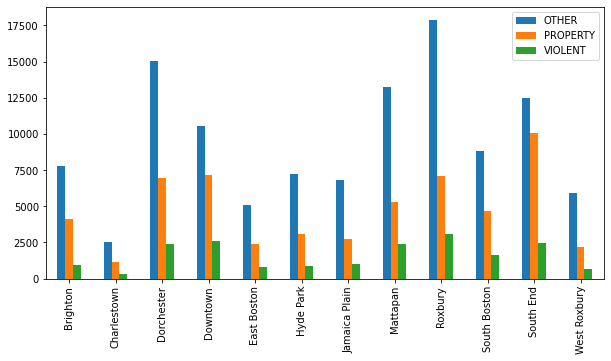

In [ ]:
crime.groupby('CRIME_TYPE').district_map.value_counts().unstack(0).plot.bar(figsize=(10,5), xlabel='') #,stacked=True)
plt.legend(loc='best')

## Data 2. Neighborhood Data
Neighborhood data is found available on [Analyze Boston](https://data.boston.gov/dataset/neighborhood-demographics). It provides demographic data for Boston’s neighborhoods from 1950 to 2019. For our project we are mainly interested in recent data from 2015 to 2019, so we downloaded the file [BOSTON NEIGHBORHOOD DEMOGRAPHICS, 2015-2019](https://data.boston.gov/dataset/neighborhood-demographics/resource/d8c23c6a-b868-4ba4-8a3b-b9615a21be07) as `neighborhood.xlsm` for next step of pre-processing.

### Manage Neighborhood Data collected manually

In [ ]:
# read every sheet in the file and give valid sheet name
xls = pd.ExcelFile('neighborhood.xlsm')
base_name = "df_"

dfs=[]
for name in xls.sheet_names:
    x=name.replace(" ","_")
    dftemp = pd.read_excel('neighborhood.xlsm', sheet_name=name)
    exec(f"{x}=dftemp")
    exec(f"dfs.append({x})")

In [ ]:
# rename column Unnamed: 0 to Location
for dftemp in dfs:
    dftemp.rename({'Unnamed: 0': 'Location'}, axis=1, inplace=True)

In [ ]:
df_neighbors=[]
for i,df in enumerate(dfs):
     df= df.copy().iloc[2:,:]
     df=df.loc[:,~df.columns.str.contains("%")] 
     exec(f"df.name=names1[i]")
     df_neighbors.append(df)

In [ ]:
use_df=['Age',
        'Household Type',
        'Race',
        'Group Quarters Population',
        'Nativity',
        'Geographic Mobility',
        'Educational Attainment',
        'Housing Tenure',
        'Poverty Rates']
        
use_df1=[n.replace(" ","_") for n in use_df]

In [ ]:
# put selected sheets into seperate csv files
for df in df_neighbors:
    if df.name in use_df1:
        df.to_csv(f"{df.name}.csv")

### Mapping between neighborhood and crime data

In [ ]:
district_map={"B2":"Roxbury",   
              "D4":"South End",          
              "C11": "Dorchester",     
              "B3":"Mattapan",          
              "A1":  "Downtown",        
              "C6":"South Boston",
              "D14":"Brighton",
              "E18":"Hyde Park",
              "E13":"Jamaica Plain",
              "E5":"West Roxbury",
              "A7":"East Boston",
              "A15":"Charlestown"}

In [ ]:
df['LOCATION']=df['DISTRICT'].apply(lambda x: district_map[x])

## Data 3. Weather Data


### Retrieve Weather Data with API
The weather data is retrieved using [WorldWeatherOnline](https://pypi.org/project/wwo-hist/) historical weather data API which is available on PyPI. An API key is needed but it can be got for free. The code below for retrieving data used for our project is commented out so that our API key would not be exhausted every time the notebook is executed.

In [ ]:
# !pip install wwo-hist
from wwo_hist import retrieve_hist_data
import os

os.getcwd()

In [ ]:
frequency=1
start_date = '1-JAN-2018'
end_date = '21-NOV-2021'
api_key = '7a447bd3eedd4c75997210839212411'
location_list = ['boston,ma']

hist_weather_data = retrieve_hist_data(api_key,
                                location_list,
                                start_date,
                                end_date,
                                frequency,
                                location_label = False,
                                export_csv = True,
                                store_df = True)

### Merge between Weather Data & Crime data

In [ ]:
hist_weather_data=pd.read_csv("boston,ma.csv")
hist_weather_data=hist_weather_data.drop('location', axis=1)
hist_weather_data['date_time']=pd.to_datetime(hist_weather_data['date_time'])

In [ ]:
 for v in hist_weather_data.columns.values:
        print(v)

date_time
maxtempC
mintempC
totalSnow_cm
sunHour
uvIndex
moon_illumination
moonrise
moonset
sunrise
sunset
DewPointC
FeelsLikeC
HeatIndexC
WindChillC
WindGustKmph
cloudcover
humidity
precipMM
pressure
tempC
visibility
winddirDegree
windspeedKmph


In [ ]:
df_weather=df.merge(hist_weather_data,left_on='DATE_BY_HOUR',right_on='date_time',how='left')

In [ ]:
df_weather

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,...,WindChillC,WindGustKmph,cloudcover,humidity,precipMM,pressure,tempC,visibility,winddirDegree,windspeedKmph
0,854652314,3115,INVESTIGATE PERSON,INVESTIGATE PERSON,B2,289,0,2020-02-20 00:00:00,2020,2,...,-10,26,1,46,0.0,1028,-4,10,298,21
1,457856954,3115,INVESTIGATE PERSON,INVESTIGATE PERSON,B2,289,0,2020-02-21 01:42:00,2020,2,...,-11,19,11,48,0.0,1031,-5,10,320,16
2,302030654,1106,CONFIDENCE GAMES,FRAUD - CREDIT CARD / ATM FRAUD,D4,167,0,2020-04-24 13:00:00,2020,4,...,3,30,100,92,0.2,1007,7,9,49,22
3,212025777,1108,FRAUD,FRAUD - WELFARE,A7,28,0,2020-05-01 00:00:00,2020,5,...,6,32,100,87,0.0,1019,7,10,131,19
4,212025557,2670,CRIMINAL HARASSMENT,HARASSMENT/ CRIMINAL HARASSMENT,A1,77,0,2020-09-07 00:00:00,2020,9,...,21,19,80,66,0.0,1022,21,10,198,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189937,192016532,3502,MISSING PERSON LOCATED,MISSING PERSON - LOCATED,B3,,0,2019-03-04 15:00:00,2019,3,...,-2,18,70,92,0.0,1006,2,7,307,19
189938,192014325,2900,OTHER,Migrated Report - Auto Law Violation,B3,466,0,2019-02-24 18:43:00,2019,2,...,3,30,100,95,0.6,992,6,9,162,20
189939,192000375,1300,RECOVERED STOLEN PROPERTY,Migrated Report - Stolen Property,B2,,0,2019-01-02 11:00:00,2019,1,...,0,10,4,22,0.0,1027,1,10,267,17
189940,192000018,3801,MOTOR VEHICLE ACCIDENT RESPONSE,M/V ACCIDENT - OTHER,D4,,0,2019-01-01 01:14:00,2019,1,...,2,31,100,95,4.2,1010,6,6,162,15


### Crime & Weather Data Preprocess
Generate new features: 'sunrise', 'sunset', 'night'

In [ ]:
df = df_weather
df['DATE_BY_HOUR']=df['OCCURRED_ON_DATE'].values.astype('<M8[h]')
df['DAY_IN_YEAR']=pd.to_datetime(df['OCCURRED_ON_DATE']).dt.strftime('%m-%d')

In [ ]:
violent_crime=['CRIMINAL HARASSMENT','SIMPLE ASSAULT', 'AGGRAVATED ASSAULT','HOMICIDE','BALLISTICS',
               'ARSON', 'EXPLOSIVES','MANSLAUGHTER', 'BIOLOGICAL THREAT' ,'ROBBERY' ]
property_crime=['LARCENY','INVESTIGATE PROPERTY', 'PROPERTY LOST','AUTO THEFT', 'LARCENY FROM MOTOR VEHICLE', 
                'VANDALISM', 'PROPERTY RELATED DAMAGE', 'COUNTERFEITING','COMMERCIAL BURGLARY',
                'RESIDENTIAL BURGLARY', 'EMBEZZLEMENT', 
                'OTHER BURGLARY',  'HOME INVASION' ]
else_crime=['INVESTIGATE PERSON', 'CONFIDENCE GAMES', 'FRAUD',
            'LICENSE PLATE RELATED INCIDENTS', 'TOWED',
            'VIOLATIONS',  'MOTOR VEHICLE ACCIDENT RESPONSE',
            'OTHER',  'MISSING PERSON REPORTED', 'POLICE SERVICE INCIDENTS',          
            'FIRE RELATED REPORTS', 'PROPERTY FOUND',
            'FIREARM DISCOVERY', 'MISSING PERSON LOCATED',
            'RESTRAINING ORDER VIOLATIONS', 'VERBAL DISPUTES', 
            'MEDICAL ASSISTANCE', 'DRUG VIOLATION', 'LIQUOR VIOLATION',
            'LICENSE VIOLATION', 'LANDLORD/TENANT DISPUTES',
            'FIREARM VIOLATIONS', 'SERVICE',
            'ASSEMBLY OR GATHERING VIOLATIONS', 'AUTO THEFT RECOVERY',
            'RECOVERED STOLEN PROPERTY', 'WARRANT ARRESTS', 'EVADING FARE',
            'OPERATING UNDER THE INFLUENCE', 'BOMB HOAX',
              'PRISONER RELATED INCIDENTS', 'SEARCH WARRANTS',
            'DISORDERLY CONDUCT', 'OFFENSES AGAINST CHILD / FAMILY',
            'HARBOR RELATED INCIDENTS', 'PHONE CALL COMPLAINTS',
            'PROSTITUTION', 'AIRCRAFT', 'HARASSMENT']

df['CRIME_TYPE']=df['OFFENSE_CODE_GROUP'].apply(lambda x : 'VIOLENT' if x in violent_crime else ('PROPERTY' if x in property_crime else 'OTHER'))

In [ ]:
df.columns

Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'STREET',
       'LAT', 'LONG', 'LOCATION', 'DATE_BY_HOUR', 'DAY_IN_YEAR', 'date_time',
       'maxtempC', 'mintempC', 'totalSnow_cm', 'sunHour', 'uvIndex',
       'moon_illumination', 'moonrise', 'moonset', 'sunrise', 'sunset',
       'DewPointC', 'FeelsLikeC', 'HeatIndexC', 'WindChillC', 'WindGustKmph',
       'cloudcover', 'humidity', 'precipMM', 'pressure', 'tempC', 'visibility',
       'winddirDegree', 'windspeedKmph', 'CRIME_TYPE'],
      dtype='object')

In [ ]:
df1=df[df['DISTRICT']!='External']

In [ ]:
# convert timestamp to datetime data type for ease of use
df['OCCURRED_ON_DATE'] = pd.to_datetime(df['OCCURRED_ON_DATE'])

# create time values for each record in minutes
df['time'] = (df['OCCURRED_ON_DATE'].dt.hour * 60) + df['OCCURRED_ON_DATE'].dt.minute

In [ ]:
from datetime import *

sunrise=df['sunrise'].apply(lambda m2:datetime.strptime(m2, '%I:%M %p'))
sunset=df['sunset'].apply(lambda m2:datetime.strptime(m2, '%I:%M %p'))
df['sunrisetime']=(sunrise.dt.hour * 60) + sunrise.dt.minute
df['sunsettime']=(sunset.dt.hour * 60) + sunset.dt.minute

In [ ]:
# create night time indicator feature
df['night'] = (    (df['time'] < df['sunrisetime']) | (df['time'] > df['sunsettime'])
).astype(int)
# check results


In [ ]:
df[['OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'HOUR', 'time', 'sunrise', 'sunset', 'night']].head()

,OCCURRED_ON_DATE,YEAR,MONTH,HOUR,time,sunrise,sunset,night
0,2020-02-20 00:00:00,2020,2,0,0,06:34 AM,05:23 PM,1
1,2020-02-21 01:42:00,2020,2,1,102,06:33 AM,05:24 PM,1
2,2020-04-24 13:00:00,2020,4,13,780,04:49 AM,06:36 PM,0
3,2020-05-01 00:00:00,2020,5,0,0,04:39 AM,06:44 PM,1
4,2020-09-07 00:00:00,2020,9,0,0,05:16 AM,06:07 PM,1


In [ ]:
df.drop(['sunrisetime','sunsettime','time','sunrise','sunset'],axis=1,inplace=True)

### Weather data - EDA : Weather v.s. Shooting

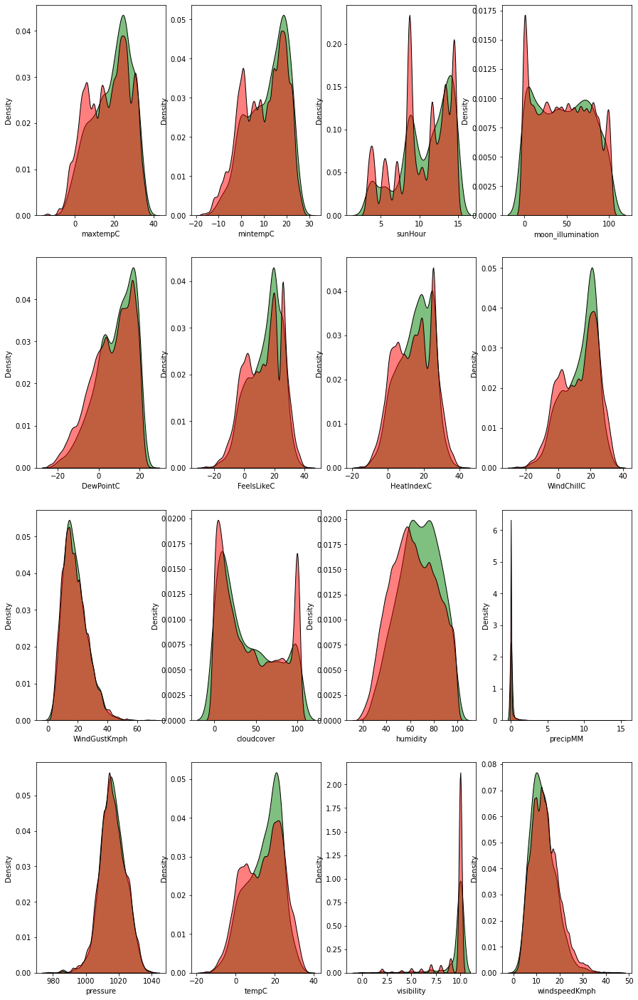

In [ ]:
col_names=[ 'maxtempC', 'mintempC', 'sunHour',
        'moon_illumination', 'DewPointC', 'FeelsLikeC', 'HeatIndexC', 'WindChillC',
       'WindGustKmph', 'cloudcover', 'humidity', 'precipMM', 'pressure',
       'tempC', 'visibility', 'windspeedKmph']
fig, axes = plt.subplots(4,4 , figsize=(15,25))

for axi,col in zip(axes.ravel(),col_names):
    sns.kdeplot(data=df_weather[df_weather['SHOOTING']==1], x=col,ax=axi,label='Shooting',color='g',alpha=0.5,multiple='stack')
    sns.kdeplot(data=df_weather[df_weather['SHOOTING']==0], x=col,ax=axi,label='No Shooting',color='r',alpha=0.5,multiple='stack')

## Data 4. Economic Data

### Manage Econ data manually downloaded from BLS
source: https://www.bls.gov/eag/eag.ma_boston_mn.htm#eag_ma_boston_mn.f.4

We manually downloaded the econonmic data from BLS fot the different wages in the Greate Boston area. Because all the data are in wide format, we use melt to convert all the wide format to long format so that the output data will have each row storing the economic indicators for a specific month in one year.

In [ ]:
def change_wage_name(col):
  if 'nonfarm' in col:
    return 'total_nonfarm_wage'
  elif 'mining' in col:
    return "mining_logging_construction_wage"
  elif 'trade' in col:
    return "trade_transportation_utilities_wage"
  elif 'business' in col:
    return "professional_business_wage"
  elif 'leisure' in col:
    return 'leisure_hospitality_wage'
  elif 'wage' not in col:
    return col+"_wage"
  return col

In [ ]:
import glob
all_bls_econ = []
for f in glob.glob("data/*11_21*"):
  print(f)
  if f == 'data/labor_11_21.xlsx':
    temp = pd.read_excel(f,skiprows = list(range(10)))
  else:
    temp = pd.read_excel(f,skiprows = list(range(11)))
    if 'Year' not in temp.columns:
      temp = pd.read_excel(f,skiprows = list(range(12)))

  # Change column name
  new_col = '_'.join(f.split("_")[:-2])
  if new_col not in ['cpiu','cpiw','labor'] :
    new_col = change_wage_name(new_col)
  temp = pd.melt(temp,id_vars=['Year'], value_vars=temp.columns[1:])
  temp.rename(columns = {'variable':"month",'value':new_col},inplace = True)
  all_bls_econ.append(temp)

all_bls_econ_df = all_bls_econ[0]
for k in all_bls_econ[1:]:
  all_bls_econ_df = pd.merge(all_bls_econ_df,k, on = ['Year','month'],
                             how = 'outer')
all_bls_econ_df.to_csv("data/econ_bls.csv")

labor_11_21.xlsx
nonfarm_wage_11_21.xlsx
mining_11_21.xlsx
manufacture_11_21..xlsx
trade_11_21.xlsx
info_11_21..xlsx
finance_11_21..xlsx
business_11_21..xlsx
edu_health_11_21..xlsx
leisure_11_21..xlsx
other_11_21..xlsx
govern_11_21..xlsx
cpiu_11_21..xlsx
cpiw_11_21..xlsx


In [ ]:
econ_bls = pd.read_csv("data/econ_bls.csv")
econ_bls.drop(columns = ['Unnamed: 0'],inplace = True)

In [ ]:
labor = pd.read_excel("data/labor_force_complete.xlsx")
labor.rename(columns = {"Period":"month"},inplace = True)

In [ ]:
econ_bls


,Year,month,labor,total_nonfarm_wage,mining_logging_construction_wage,manufacture_wage,trade_transportation_utilities_wage,info_wage,finance_wage,professional_business_wage,edu_health_wage,leisure_hospitality_wage,other_wage,govern_wage,cpiu,cpiw
0,2011,Jan,2532080.0,2403.1,71.2,191.2,395.6,72.1,175.5,399.8,493.9,210.4,91.8,301.6,239.814,240.540
1,2012,Jan,2546703.0,2444.1,75.1,188.8,400.4,75.0,174.6,409.6,505.1,219.5,93.8,302.2,245.891,247.006
2,2013,Jan,2571229.0,2484.4,80.2,188.7,403.4,74.6,175.4,423.5,515.5,226.5,95.7,300.9,249.957,251.024
3,2014,Jan,2579208.0,2520.9,84.7,188.4,408.5,74.9,175.0,435.4,517.5,233.0,96.2,307.3,253.123,254.168
4,2015,Jan,2635726.0,2577.5,92.8,187.5,415.3,77.4,177.2,448.2,533.5,240.0,98.0,307.6,254.556,254.407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,2017,HALF2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,268.472,267.170
161,2018,HALF2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,277.483,276.629
162,2019,HALF2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,282.057,280.597
163,2020,HALF2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,283.778,282.130


In [ ]:
pd.merge(labor,econ_bls,on = ['Year','month']).to_csv("econ_bls.csv",index = False)

### Data Preprocessing for Econ - EDA

In [ ]:
crime_loc= pd.read_csv("data/crime_cloest_n.csv")
econ_data = pd.read_csv("data/econ_bls.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
def month_to_num(x):
  if x == 'Jan':
    return 1
  elif x == 'Feb':
    return 2
  elif x == 'Mar':
    return 3
  elif x == 'Apr':
    return 4
  elif x == 'May':
    return 5
  elif x == 'Jun':
    return 6
  elif x == 'Jul':
    return 7
  elif x == 'Aug':
    return 8
  elif x == 'Sep':
    return 9
  elif x == 'Oct':
    return 10
  elif x == 'Nov':
    return 11
  elif x == 'Dec':
    return 12

In [ ]:
econ_data['MONTH'] = econ_data.month.apply(month_to_num)
econ_data = econ_data[econ_data.MONTH<=12].copy()
econ_data.sort_values(by = ['Year','MONTH'],inplace = True)
econ_data = econ_data.iloc[:-2]
cleaned_econ_data = econ_data.interpolate()

Heatmap helper function

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
def heatmap(df,title,annot = True):
  # Defining figure size  
  # for the output plot 
  fig, ax = plt.subplots(figsize = (12, 7))
    
  # Defining index for the dataframe
  idx = ['1', '2', '3', '4']
    
  # Defining columns for the dataframe
  cols = list('ABCD')
  g = sns.heatmap(df, cmap ='RdYlGn', linewidths = 0.30, 
              vmin=-1, vmax=1,annot = annot)
  g.set_xticklabels(g.get_xticklabels(), rotation=25, horizontalalignment='right')
  plt.title(title)
  plt.show()

### Economic - EDA : Correlation in Economic Indicators
Because 'professional_business_wage', 'other_wage','mining_logging_construction_wage', 'total_nonfarm_wage', and 'cpiw' have correlation to be greater than 0.9, we will drop them to prevent multicollinearity problem.

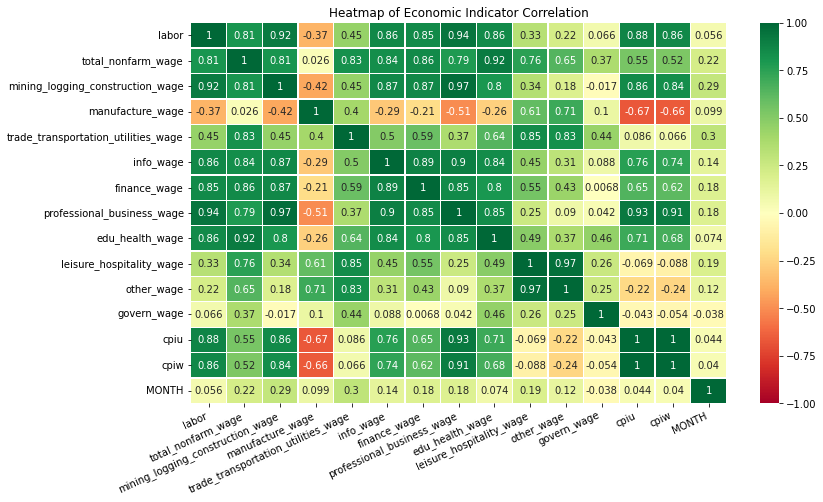

In [ ]:
df = cleaned_econ_data[cleaned_econ_data.columns[3:]].corr()
heatmap(df, 'Heatmap of Economic Indicator Correlation')

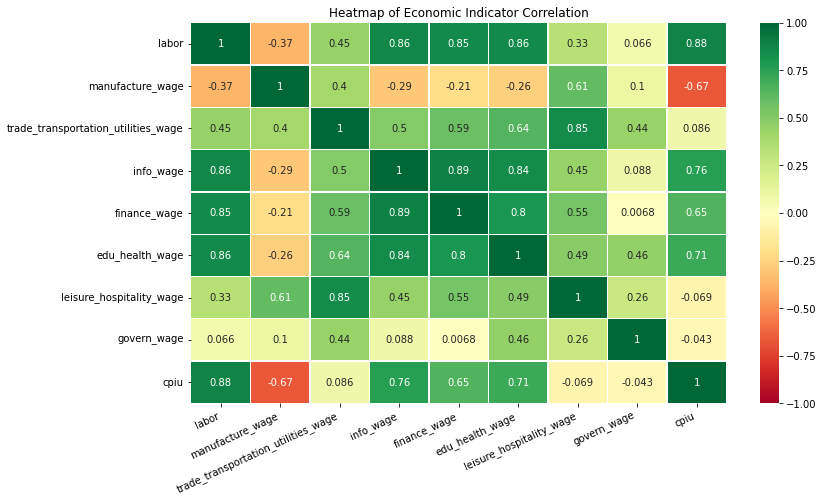

In [ ]:
df = cleaned_econ_data[cleaned_econ_data.columns[3:]].drop(columns = ['professional_business_wage',
                                                      'other_wage',
                                                      'mining_logging_construction_wage',
                                                      'total_nonfarm_wage',
                                                      'MONTH',
                                                      'cpiw']).corr()
heatmap(df, 'Heatmap of Economic Indicator Correlation')

## Data 5&6. MBTA + Streetlight Data


### MBTA Data Retrieval
MBTA provides API available for us to retrieve data from the website directly. Below are the codes to retrieve the station/stops data and ridership data from the MBTA website. We believe ridership data can help us know when and where will have large volume of passengers which might relate to the crimes.

#### Station/Stops Data
We need the longitude and latitude data of the stations/stops so that we can match the ridership data to the exact location in a map

1.  Bus Stop source: https://mbta-massdot.opendata.arcgis.com/datasets/bus-stops/explore?location=42.186700%2C-71.042550%2C9.17&showTable=true


In [ ]:
import requests
r = requests.get("https://opendata.arcgis.com/datasets/a5a1e75b2f194465890151ee9c3a1d97_4.geojson")
r = r.json()
bus_stops = []
for i,m in enumerate(r['features']):
  # print(i,m)
  m = m['properties']
  temp = dict()
  temp['stop_id'] = m['stop_id']
  temp['stop_code'] = m['stop_code']
  temp['Routes'] = m['Routes']
  temp['Neighborhood'] = m['Neighborhood']
  temp['stop_lat'] = m['stop_lat']
  temp['stop_lon'] = m['stop_lon']
  temp['stop_name'] = m['stop_name']
  temp['stop_desc'] = m['stop_desc']
  temp['on_street'] = m['on_street']
  temp['wheelchair_boarding'] = m['wheelchair_boarding']
  temp['vehicle_type'] = m['vehicle_type']
  temp['wheelchair_boarding'] = m['wheelchair_boarding']
  temp['zone_id'] = m['zone_id']
  temp['Accessibility_Score'] = m['Accessibility_Score']
  temp['municipality'] = m['municipality']
  temp['level_id'] = m['level_id']
  bus_stops.append(temp)
bus_stops = pd.DataFrame(bus_stops)
bus_stops.to_csv("bus_stop.csv")

2. Commuter Rail Stops 
source: https://mbta-massdot.opendata.arcgis.com/datasets/commuter-rail-stations/explore?location=42.186700%2C-71.042550%2C9.17


In [ ]:
r = requests.get("https://opendata.arcgis.com/datasets/a5a1e75b2f194465890151ee9c3a1d97_2.geojson")
r = r.json()
rail_stops = []
for i,m in enumerate(r['features']):
  # print(i,m)
  m = m['properties']
  temp = dict()
  temp['stop_id'] = m['stop_id']
  temp['stop_code'] = m['stop_code']
  temp['Routes'] = m['Routes']
  temp['Neighborhood'] = m['Neighborhood']
  temp['stop_lat'] = m['stop_lat']
  temp['stop_lon'] = m['stop_lon']
  temp['stop_name'] = m['stop_name']
  temp['stop_desc'] = m['stop_desc']
  temp['on_street'] = m['on_street']
  temp['wheelchair_boarding'] = m['wheelchair_boarding']
  temp['vehicle_type'] = m['vehicle_type']
  temp['wheelchair_boarding'] = m['wheelchair_boarding']
  temp['zone_id'] = m['zone_id']
  temp['Accessibility_Score'] = m['Accessibility_Score']
  temp['municipality'] = m['municipality']
  temp['level_id'] = m['level_id']
  rail_stops.append(temp)
rail_stops = pd.DataFrame(rail_stops)
rail_stops.to_csv("commuter_rail_stops.csv")

3. Rapid transit Station
source: https://mbta-massdot.opendata.arcgis.com/datasets/rapid-transit-stops/explore?location=42.186700%2C-71.042550%2C9.17

In [ ]:
r = requests.get("https://opendata.arcgis.com/datasets/a5a1e75b2f194465890151ee9c3a1d97_0.geojson")
r = r.json()
rapid = []
for i,m in enumerate(r['features']):
  # print(i,m)
  m = m['properties']
  temp = dict()
  temp['stop_id'] = m['stop_id']
  temp['stop_code'] = m['stop_code']
  temp['Routes'] = m['Routes']
  temp['Neighborhood'] = m['Neighborhood']
  temp['stop_lat'] = m['stop_lat']
  temp['stop_lon'] = m['stop_lon']
  temp['stop_name'] = m['stop_name']
  temp['stop_desc'] = m['stop_desc']
  temp['on_street'] = m['on_street']
  temp['wheelchair_boarding'] = m['wheelchair_boarding']
  temp['vehicle_type'] = m['vehicle_type']
  temp['wheelchair_boarding'] = m['wheelchair_boarding']
  temp['zone_id'] = m['zone_id']
  temp['Accessibility_Score'] = m['Accessibility_Score']
  temp['municipality'] = m['municipality']
  temp['level_id'] = m['level_id']
  rapid.append(temp)
rapid = pd.DataFrame(rapid)
rapid.to_csv("rapid_transit_stops.csv")

#### Ridership Data
Ridership data include average loading, average ons, average offs features at a certain stop/station that we are interested in. 
The detailed data guide can be found here https://mbta-massdot.opendata.arcgis.com/documents/mbta-ridership-guide/explore.

1. Commuter rail ridership
source link: https://mbta-massdot.opendata.arcgis.com/datasets/mbta-commuter-rail-ridership-by-trip-season-route-line-and-stop/explore

In [ ]:
r = requests.get("https://opendata.arcgis.com/datasets/4c21d998a2a140ceaf98029c35df0c16_0.geojson")
r = r.json()
rail_ridership = []
for i,m in enumerate(r['features']):
  # print(i,m)
  m = m['properties']
  temp = dict()
  temp['route_id'] = m['route_id']
  temp['route_name'] = m['route_name']
  temp['season'] = m['season']
  temp['stop_id'] = m['stop_id']
  temp['stop_name'] = m['stop_name']
  temp['stopsequence'] = m['stopsequence']
  temp['stop_time'] = m['stop_time']
  temp['mode'] = m['mode']
  temp['average_load'] = m['average_load']
  temp['average_offs'] = m['average_offs']
  temp['average_ons'] = m['average_ons']
  temp['day_type_name'] = m['day_type_name']
  temp['direction_id'] = m['direction_id']
  rail_ridership.append(temp)
rail_ridership = pd.DataFrame(rail_ridership)
rail_ridership.to_csv("data/commuter_rail_ridership.csv")

2. Rapid Transit Ridership
source link: https://mbta-massdot.opendata.arcgis.com/datasets/mbta-rail-ridership-by-time-period-season-route-line-and-stop/explore

In [ ]:
r = requests.get("https://opendata.arcgis.com/datasets/9fea7862501f4c59ab2c001ad6ae19b0_0.geojson")
r = r.json()
rail_ridership = []
for i,m in enumerate(r['features']):
  # print(i,m)
  m = m['properties']
  temp = dict()
  temp['route_id'] = m['route_id']
  temp['route_name'] = m['route_name']
  temp['season'] = m['season']
  temp['stop_id'] = m['stop_id']
  temp['stop_name'] = m['stop_name']
  temp['FID'] = m['FID']
  temp['time_period_id'] = m['time_period_id']
  temp['time_period_name'] = m['time_period_name']
  temp['day_type_id'] = m['day_type_id']
  temp['day_type_name'] = m['day_type_name']
  temp['mode'] = m['mode']
  temp['average_flow'] = m['average_flow']
  temp['average_offs'] = m['average_offs']
  temp['average_ons'] = m['average_ons']
  temp['average_offs'] = m['average_offs']
  temp['average_ons'] = m['average_ons']
  temp['day_type_name'] = m['day_type_name']
  temp['direction_id'] = m['direction_id']
  
  rail_ridership.append(temp)
rail_ridership = pd.DataFrame(rail_ridership)
rail_ridership.to_csv("data/rapid_transit_ridership.csv")

3. Bus Time Ridership
source link: https://mbta-massdot.opendata.arcgis.com/datasets/mbta-bus-ridership-by-time-period-season-route-line-and-stop/explore

In [ ]:
import requests
r=requests.get("https://opendata.arcgis.com/datasets/2b0bb23be5e5469596723e13a9f9debe_0.geojson")
r=r.json()

In [ ]:
bus_trip_ridership = []
for i,m in enumerate(r['features']):
  # print(i,m)
  m = m['properties']
  temp = dict()
  temp['route_id'] = m['route_id']
  temp['direction_id'] = m['direction_id']
  temp['route_name'] = m['route_name']
  temp['season'] = m['season']
  temp['stop_id'] = m['stop_id']
  temp['stop_name'] = m['stop_name']
  temp['average_ons'] = m['average_ons']
  temp['average_offs'] = m['average_offs']
  temp['average_load'] = m['average_load']
  temp['stop_sequence'] = m['stop_sequence']
  temp['time_period_id'] = m['time_period_id']
  temp['time_period_name'] = m['time_period_name']
  temp['mode'] = m['mode']
  temp['num_trips'] = m['num_trips']
  temp['day_type_id'] = m['day_type_id']
  temp['day_type_name'] = m['day_type_name']
  
  
  
  bus_trip_ridership.append(temp)
bus_trip_ridership = pd.DataFrame(bus_trip_ridership)
bus_trip_ridership.to_csv("data/bus_time_ridership.csv")

### Load District Data
We need the police district data to know the district of the stops/stations and streetlights. 
District data is downloaded from https://bostonopendata-boston.opendata.arcgis.com/datasets/police-districts/explore?showTable=true

In [ ]:
!pip install geopandas
!pip install geojson
import geopandas as gpd
from shapely.geometry import Point, Polygon

In [ ]:
def coord_district(x):
  for district in districts.index.tolist():
    if districts[districts.index==district].geometry.iloc[0].contains(x):
      return district
  return None
  
districts_full = gpd.read_file('data/Police_Districts/Police_Districts.geojson')
districts = districts_full[["DISTRICT", "geometry"]].set_index("DISTRICT")
districts

,geometry
DISTRICT,
A15,"MULTIPOLYGON (((-71.07416 42.39051, -71.07416 ..."
A7,"MULTIPOLYGON (((-70.99644 42.39557, -70.99645 ..."
A1,"POLYGON ((-71.05200 42.36884, -71.05219 42.368..."
C6,"POLYGON ((-71.04406 42.35403, -71.04400 42.354..."
D4,"POLYGON ((-71.07416 42.35724, -71.07436 42.357..."
D14,"POLYGON ((-71.12573 42.36998, -71.12580 42.370..."
E13,"POLYGON ((-71.11275 42.33181, -71.11279 42.331..."
E5,"POLYGON ((-71.14093 42.27488, -71.14089 42.274..."
B3,"POLYGON ((-71.08022 42.30466, -71.08026 42.304..."


### Load Crime Data 

Because crime data only have exact occurred time but ridership data only have the ridership regarding each time period, we need to add one more column in crime to match the data between crime and ridership  

In [ ]:
crime = pd.read_excel("data/crime_data_merged.xlsx")
crime.head()

In [ ]:
def isNight(x):
  return x.hour<=6 or x.hour > 18 or (x.hour == 18 and x.minute>=30)

def time_period(x):
  if x.hour in [3,4,5]:
    return 'VERY_EARLY_MORNING'
  elif x.hour in [6]:
    return 'EARLY_AM'
  elif x.hour in [7,8]:
    return 'AM_PEAK'
  elif x.hour in [9,10,11,12] or (x.hour == 13 and x.minute<30):
    return 'MIDDAY_BASE'
  elif x.hour in [14,15] or (x.hour == 13 and x.minute>=30):
    return 'MIDDAY_SCHOOL'
  elif x.hour in [16,17] or (x.hour == 18 and x.minute<30):
    return 'PM_PEAK'
  elif x.hour in [19,20,21] or (x.hour == 18 and x.minute>=30):
    return 'EVENING'
  elif x.hour in [22,23] :
    return 'LATE_EVENING'
  elif x.hour in [0,1,2]:
    return 'NIGHT'
  return None


In [ ]:
crime.OCCURRED_ON_DATE = pd.to_datetime(crime.OCCURRED_ON_DATE)
# crime['night'] = crime.OCCURRED_ON_DATE.apply(isNight)
crime['time_period'] = crime.OCCURRED_ON_DATE.apply(time_period)

### Load Streetlight Data
This step is to generate the district feature of the streetlight data. It takes a long time to generate the feature, so we already stored the preprocessed data to 'street_light_district.csv'. We commented out the code to preproces the data to save time

In [ ]:
street_light = pd.read_csv("data/street_light.csv")
street_light['geometry'] = street_light.apply(lambda x: Point(x.Long,x.Lat),axis = 1)
street_light['district'] = street_light.geometry.apply(coord_district)
street_light.dropna(inplace = True)
street_light.to_csv("data/street_light_district.csv")

### Load MBTA Data

#### Station/Stops
It takes a long time to generate the feature, so we already stored the preprocessed data to 'street_light_district.csv'. We commented out the code to preproces the data to save time

We only need the longitude, latitude of the stop_id to match with the ridership data.
We also generate a new column 'geometry' so that the longitude and latitude is in a format of Point which can be used to determine whether the location is within an area/district which is in the format of Polygon.

1. Commuter Rail stops loading & preprocessing
We found that there would be no matching result between commuter rail station data and commuter rail ridership data. We found the main difference here is the string format of the stop_id. After adding the 'place-' prefix and exclude the fourth suffix. There would be a fairly good amount of matching data.

In [ ]:
rail_stops = pd.read_csv("data/commuter_rail_stops.csv")[['stop_id','stop_lat','stop_lon']]
rail_stops['stop_id'] = 'place-'+rail_stops['stop_id']
rail_stops.drop_duplicates(subset = ['stop_id'])
rail_stops['stop_id'] = rail_stops.stop_id.apply(lambda x: '-'.join(x.split("-")[:3]))

# Add the district column
rail_stops['geometry'] = rail_stops.apply(lambda x: Point(x.stop_lon,x.stop_lat),axis = 1)
rail_stops['district'] = rail_stops.geometry.apply(coord_district)

2. Rapid Transit & Bus Stops loading & preprocessing

In [ ]:
# Rapid Transit
rapid_stops = pd.read_csv("data/rapid_transit_stops.csv")[['stop_id','stop_lat','stop_lon']]  
rapid_stops['geometry'] = rapid_stops.apply(lambda x: Point(x.stop_lon,x.stop_lat),axis = 1)
rapid_stops['district'] = rapid_stops.geometry.apply(coord_district)

# Bus Stops
bus_stops = pd.read_csv("data/bus_stop.csv")[['stop_id','stop_lat','stop_lon']]
bus_stops['geometry'] = bus_stops.apply(lambda x: Point(x.stop_lon,x.stop_lat),axis = 1)
bus_stops['district'] = bus_stops.geometry.apply(coord_district)

#### Ridership Data Merging with Stations Data

1. Commuter Rail Ridership : There are 54/140 = 0.614 ridership data do not have location data. There are 1-13/24 station data in Boston could not have relevant ridership data. 

In [ ]:
commuter_rail_ridership = pd.read_csv("data/commuter_rail_ridership.csv")
commuter_rail_ridership = commuter_rail_ridership[["season","stop_id",'direction_id','stop_time',
                                                   "average_load",'average_ons','average_offs']].copy()
commuter_rail_ridership.stop_time = pd.to_datetime(commuter_rail_ridership.stop_time)           
commuter_rail_ridership['Year'] = commuter_rail_ridership.season.apply(lambda x: int(x[-4:]))     
commuter_rail_ridership['mode'] = 'commuter_rail'
commuter_rail_ridership['time_period_name'] = commuter_rail_ridership.stop_time.apply(time_period)
commuter_rail_ridership.drop(columns = ['stop_time'],inplace = True)                                       

In [ ]:
# Merge Commuter Rail Ridership and Commuter Rail Stations data
commuter_temp = pd.merge(commuter_rail_ridership,rail_stops,right_on = 'stop_id',left_on = 'stop_id',
                         how = 'left')
print("Number of rail stops in boston districts:",
      rail_stops[~rail_stops.district.isna()].stop_id.unique().shape[0])
print("Number of stops in both rail station data and rail ridership data in Boston district:",
      commuter_temp[~commuter_temp.district.isna()].stop_id.unique().shape[0])

Number of rail stops in boston districts: 24
Number of stops in both rail station data and rail ridership data in Boston district: 13


2. Rapid_Transit ridership : There are (75-69)/75 rapid transit station data in Boston could not have relevant ridership data. 

In [ ]:
rapid_transit_ridership = pd.read_csv("data/rapid_transit_ridership.csv")
rapid_transit_ridership = rapid_transit_ridership[["season","stop_id",'direction_id',
                                                   'time_period_name',
                                                   "average_flow",'average_ons',
                                                   'average_offs']]
rapid_transit_ridership['Year'] = rapid_transit_ridership.season.apply(lambda x: int(x[-4:]))
rapid_transit_ridership['mode'] = 'rapid_transit'
rapid_transit_ridership.rename(columns= {'average_flow':"average_load"},inplace = True)

In [ ]:
# Merge Commuter Rail Ridership and Commuter Rail Stations data
rapid_temp = pd.merge(rapid_transit_ridership,rapid_stops,on = ['stop_id'],how = 'left')
print("rapid stops number in boston districts",
      rapid_stops[~rapid_stops.district.isna()].stop_id.unique().shape[0])
print("matched rapid stops number in district",
      rapid_temp[~rapid_temp.district.isna()].stop_id.unique().shape[0])

rapid stops number in boston districts 75
matched rapid stops number in district 69


3.  Bus ridership : There are 25/1896 bus stop data in Boston could not have relevant ridership data. 

In [ ]:
bus_time_ridership = pd.read_csv("data/bus_time_ridership.csv")
bus_time_ridership = bus_time_ridership[["season","stop_id",'average_load',
                                         'average_ons','average_offs',
                                         "time_period_name",'direction_id']].copy()
bus_time_ridership.stop_id = bus_time_ridership.stop_id.astype(str)
bus_time_ridership['Year'] = bus_time_ridership.season.apply(lambda x: int(x[-4:]))
bus_time_ridership['mode'] = 'bus'

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (1,3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
# Merge Bus Ridership and Bus Stops data
b_temp = pd.merge(bus_time_ridership,bus_stops,on = ['stop_id'],how = 'left')
print("rapid stops number in boston districts",
      bus_stops[~bus_stops.district.isna()].stop_id.unique().shape[0])
print("matched rapid stops number in district",
      b_temp[~b_temp.district.isna()].stop_id.unique().shape[0])

rapid stops number in boston districts 1896
matched rapid stops number in district 1871


4.  Concat Ridership&Stop Data
After merging all the ridership data with the station data, there are 558,244 rows of data. And it includes the ridership data for 1953 stations/stops. Save the data to ridership_stops.csv

In [ ]:
ridership_district = pd.concat([commuter_temp,rapid_temp,b_temp],axis = 0)
ridership_district[["average_offs","average_ons","average_offs"]] = ridership_district[["average_offs",
                                                                                        "average_ons",
                                                                                        "average_offs"]].fillna(0)
print('total number of ridership data:',len(ridership_district))
ridership_district.dropna(inplace = True)
# stops.stop_id = stops.stop_id.astype(str)
print('total number of unique stops in the final data:', 
      len(ridership_district.dropna().drop_duplicates(subset = ['stop_id']).stop_id.tolist()))
ridership_district.to_csv("data/ridership_stops.csv",index = False)

total number of ridership data: 558244
total number of unique stops in the final data: 1953


In [ ]:
t = pd.read_csv("data/ridership_stops.csv")
len(t.dropna().drop_duplicates(subset = ['stop_id']).stop_id.tolist())

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


3801

### Feature Engineering - Geographical Distance
We want to add some features related to how close the crime location is to the streetlight and the MBTA stations/stops.

Step 1. we will project the longitude and latitude data to x,y coordinates using Universal Transverse Mercator (UTM) which is a map projection system.

Step 2. we will find calculate the distance between the crime location and a streetlight/station location using the Euclidean distance. Then store the closest n streetlight/stations to each crime location.

Step 3. for station data, we also find the averated ridership data across several years of the closest n stations. 

Step 4. explore the data and set different thresholds of distance to find the number of stations/stops or streetlights that are within different distance to the crime location.

Step 5. Save result

Import needed modules

In [ ]:
from geopy.distance import vincenty, geodesic
import numpy as np
import math
from collections import defaultdict

Preprocess Crime Data.

Preprocess the crime data by first filtering out the ones without longitude and latitude data. Then only retain the minimum needed information regarding the time, location, and the id to match back to the shole data and to match with the geographic data. 

In [ ]:
crime_loc = crime.dropna(axis = 0, subset =['LAT','LONG']).copy()
crime_loc = crime_loc[crime_loc.LOCATION != '(0, 0)'][['INCIDENT_NUMBER',
                                                       'time_period',
                                                       'YEAR','LAT','LONG',
                                                       'DISTRICT']].copy()
crime_loc = crime_loc[crime_loc.DISTRICT!='External'].copy()

In [ ]:
street_light = pd.read_csv("data/street_light_district.csv")
ridership_district = pd.read_csv("data/ridership_stops.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


#### Step 1. Project crime, streetlight, and stations/stops longitude and latitude onto x,y coordinates with utm

In [ ]:
pip install pyproj

In [ ]:
from pyproj import Proj
pp = Proj(proj='utm',zone=10,ellps='WGS84', preserve_units=False)

xx, yy = pp(crime_loc["LONG"].values, crime_loc["LAT"].values)
crime_loc["X"] = xx
crime_loc["Y"] = yy 
xx, yy = pp(street_light["Long"].values, street_light["Lat"].values)
street_light["X"] = xx
street_light["Y"] = yy 
xx, yy = pp(ridership_district["stop_lon"].values, ridership_district["stop_lat"].values)
ridership_district["X"] = xx
ridership_district["Y"] = yy 

Stores a separate unique stations/stops location data to avoid long time of searching for the closest stations/stops  

In [ ]:
boston_valid_stops = ridership_district[['stop_id','X','Y']].drop_duplicates()

#### Step 2: Find the Closet n stations/stops or streetlights to each crime documented occured location

In [ ]:
stop_dict = defaultdict(list)
def cloest_n_distance_stop(x, min_n = 30):
  """return a list of stop_ids that are the closest n stations/stops 
  to the crime location"""
  lat = round(x.Y,3)
  lon = round(x.X,3)
  location = (lat,lon)
  if location in stop_dict.keys():
    return stop_dict[location]
  
  temp = boston_valid_stops#[stops.district == district]
  
  max_min_dist = -math.inf
  temp['dis'] = (temp.Y - lat)**2 + (temp.X - lon)**2
  nsmallest = temp.nsmallest(min_n, 'dis')
  stop_dict[location] = nsmallest.stop_id.tolist()
  return stop_dict[location]  

In [ ]:
stop_dist_dict = defaultdict(list)
def cloest_n_stop_distance(x, min_n = 30):
  """return a list of float that are the closest n stations/stops' 
  distance to the crime location"""
  lat = round(x.Y,3)
  lon = round(x.X,3)
  location = (lat,lon)
  if location in stop_dist_dict.keys():
    return stop_dist_dict[location]
  
  temp = boston_valid_stops
  
  max_min_dist = -math.inf
  temp['dis'] = (temp.Y - lat)**2 + (temp.X - lon)**2
  nsmallest = temp.nsmallest(min_n, 'dis')
  stop_dist_dict[location] = nsmallest.dis.tolist()
  return stop_dist_dict[location]  

streetlight_dist_dict = defaultdict(list)
def cloest_n_distance_streetlight(x, min_n = 30):
  """return a list of float that are the closest n streetlights' 
  distance to the crime location"""
  lat = round(x.Y,3)
  lon = round(x.X,3)
  location = (lat,lon)
  if location in streetlight_dist_dict.keys():
    return streetlight_dist_dict[location]
  
  temp = street_light[street_light.district == x.DISTRICT]#[stops.district == district]
  
  max_min_dist = -math.inf
  temp['dis'] = (temp.Y - lat)**2 + (temp.X - lon)**2
  nsmallest = temp.nsmallest(min_n, 'dis')
  streetlight_dist_dict[location] = nsmallest.dis.tolist()
  return streetlight_dist_dict[location]  

Store the cloest 30 streetlights' distance , stations/stops distance and ids as 30*3 = 90 columns in the dataset

In [ ]:
crime_loc['cloest_n_streetlight'] = crime_loc.apply(cloest_n_distance_streetlight,axis = 1)
for i in range(30):
  crime_loc[f'streetlight_dist_{i}']= crime_loc.cloest_n_streetlight.apply(lambda x: x[i])
crime_loc['cloest_n_stop'] = crime_loc.apply(cloest_n_distance_stop, axis = 1)
for i in range(30):
  crime_loc[f'stop_{i}']= crime_loc.cloest_n_stop.apply(lambda x: x[i])
crime_loc['cloest_n_stop_dist'] = crime_loc.apply(cloest_n_stop_distance, axis = 1)
for i in range(30):
  crime_loc[f'stop_dist_{i}']= crime_loc.cloest_n_stop_dist.apply(lambda x: x[i])

#### Step 3. Add Ridership info.
1. we average the average loading, average ons, and average offs of each station/stop across many years so that for each station in each time period, there are average loading, average ons, and average offs. 

2. we store such ridership data for the corresponding closet n stations/stops. 

In [ ]:
ridership_district.rename(columns = {'time_period_name':'time_period'},inplace = True)
ridership_district_grp = ridership_district[['stop_id','time_period',
                                             'average_load','average_ons',
                                             'average_offs']].groupby(['stop_id',
                                                                       'time_period']).mean().reset_index()

In [ ]:
for id in range(30):
  crime_loc = pd.merge(crime_loc,
          ridership_district_grp,
          left_on = ['time_period',f'stop_{id}'], 
          right_on = ['time_period','stop_id'],
          suffixes=('',f'_{id}'))
  crime_loc.rename(columns = {"average_load":f"average_load_{id}",
                              "average_ons":f"average_ons_{id}",
                              "average_offs":f"average_offs_{id}"},inplace = True)

#### Step 4. Exploratory Data Analysis for the new distance features

1.  Explore the distance of the stops to the crime
> Below shows the statistics of the distance of the closest n stations/stops to the crime location

In [ ]:
crime_loc[[c for c in crime_loc.columns if 'stop_dist_' in c]].describe()

,stop_dist_0,stop_dist_1,stop_dist_2,stop_dist_3,stop_dist_4,stop_dist_5,stop_dist_6,stop_dist_7,stop_dist_8,stop_dist_9,stop_dist_10,stop_dist_11,stop_dist_12,stop_dist_13,stop_dist_14,stop_dist_15,stop_dist_16,stop_dist_17,stop_dist_18,stop_dist_19,stop_dist_20,stop_dist_21,stop_dist_22,stop_dist_23,stop_dist_24,stop_dist_25,stop_dist_26,stop_dist_27,stop_dist_28,stop_dist_29
count,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04,6.898600e+04
mean,2.934448e+09,2.934573e+09,2.934601e+09,2.934618e+09,2.934702e+09,2.934753e+09,2.934819e+09,2.934851e+09,2.934899e+09,2.934930e+09,2.934967e+09,2.934996e+09,2.935052e+09,2.935085e+09,2.935135e+09,2.935186e+09,2.935220e+09,2.935246e+09,2.935281e+09,2.935309e+09,2.935345e+09,2.935395e+09,2.935505e+09,2.935553e+09,2.935585e+09,2.935618e+09,2.935653e+09,2.935776e+09,2.935813e+09,2.935938e+09
std,7.707302e+11,7.707593e+11,7.707616e+11,7.707622e+11,7.707778e+11,7.707860e+11,7.707959e+11,7.707987e+11,7.708038e+11,7.708062e+11,7.708066e+11,7.708073e+11,7.708149e+11,7.708166e+11,7.708218e+11,7.708273e+11,7.708293e+11,7.708295e+11,7.708300e+11,7.708308e+11,7.708327e+11,7.708370e+11,7.708573e+11,7.708626e+11,7.708632e+11,7.708639e+11,7.708659e+11,7.708907e+11,7.708921e+11,7.709169e+11
min,6.405747e+00,5.653061e+01,2.195077e+02,4.432280e+02,1.525150e+03,7.554243e+03,1.253609e+04,1.322052e+04,1.514873e+04,1.691081e+04,1.870730e+04,1.913166e+04,2.089513e+04,2.259047e+04,2.969728e+04,5.323250e+04,6.184213e+04,6.749407e+04,7.280512e+04,7.734594e+04,8.206760e+04,8.912476e+04,9.494991e+04,1.124693e+05,1.562814e+05,1.605805e+05,1.616066e+05,1.953990e+05,2.319573e+05,2.458191e+05
25%,2.863239e+03,9.209324e+03,2.012140e+04,2.814294e+04,4.042655e+04,6.122581e+04,7.361156e+04,8.600083e+04,1.013820e+05,1.090531e+05,1.353195e+05,1.523430e+05,1.779552e+05,1.817537e+05,1.982822e+05,2.229729e+05,2.391048e+05,2.445973e+05,2.645675e+05,2.777628e+05,3.147085e+05,3.687406e+05,3.926764e+05,3.995940e+05,4.014317e+05,4.276734e+05,4.487638e+05,4.677946e+05,4.877148e+05,5.060284e+05
50%,1.132728e+04,2.003639e+04,3.745074e+04,5.380833e+04,7.049815e+04,8.857660e+04,1.143577e+05,1.312021e+05,1.519610e+05,1.714615e+05,1.944335e+05,2.136380e+05,2.391862e+05,2.585849e+05,2.930765e+05,3.153682e+05,3.388631e+05,3.668508e+05,3.989553e+05,4.332311e+05,4.597200e+05,4.864092e+05,5.075871e+05,5.330305e+05,5.621720e+05,5.925459e+05,6.168175e+05,6.439551e+05,6.712733e+05,6.976728e+05
75%,2.774000e+04,4.612150e+04,7.058251e+04,9.128988e+04,1.263485e+05,1.499949e+05,1.812867e+05,2.084230e+05,2.578630e+05,2.888786e+05,3.231921e+05,3.501684e+05,3.798314e+05,4.094310e+05,4.436816e+05,4.705300e+05,4.989856e+05,5.343643e+05,5.607581e+05,5.946329e+05,6.293419e+05,6.576546e+05,6.891306e+05,7.210727e+05,7.513575e+05,7.895995e+05,8.227578e+05,9.143225e+05,9.592573e+05,9.852479e+05
max,2.024337e+14,2.024414e+14,2.024420e+14,2.024421e+14,2.024462e+14,2.024484e+14,2.024510e+14,2.024517e+14,2.024530e+14,2.024537e+14,2.024538e+14,2.024540e+14,2.024560e+14,2.024564e+14,2.024578e+14,2.024592e+14,2.024598e+14,2.024598e+14,2.024599e+14,2.024601e+14,2.024607e+14,2.024618e+14,2.024671e+14,2.024685e+14,2.024687e+14,2.024688e+14,2.024694e+14,2.024759e+14,2.024762e+14,2.024828e+14


In [ ]:
crime_loc[[c for c in crime_loc.columns if 'streetlight_dist_' in c]].describe()

,streetlight_dist_0,streetlight_dist_1,streetlight_dist_2,streetlight_dist_3,streetlight_dist_4,streetlight_dist_5,streetlight_dist_6,streetlight_dist_7,streetlight_dist_8,streetlight_dist_9,streetlight_dist_10,streetlight_dist_11,streetlight_dist_12,streetlight_dist_13,streetlight_dist_14,streetlight_dist_15,streetlight_dist_16,streetlight_dist_17,streetlight_dist_18,streetlight_dist_19,streetlight_dist_20,streetlight_dist_21,streetlight_dist_22,streetlight_dist_23,streetlight_dist_24,streetlight_dist_25,streetlight_dist_26,streetlight_dist_27,streetlight_dist_28,streetlight_dist_29
count,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04,8.081800e+04
mean,5.017459e+09,5.017461e+09,5.017467e+09,5.017472e+09,5.017476e+09,5.017486e+09,5.017489e+09,5.017491e+09,5.017495e+09,5.017499e+09,5.017500e+09,5.017502e+09,5.017504e+09,5.017505e+09,5.017509e+09,5.017513e+09,5.017516e+09,5.017517e+09,5.017521e+09,5.017523e+09,5.017525e+09,5.017527e+09,5.017529e+09,5.017530e+09,5.017531e+09,5.017532e+09,5.017536e+09,5.017537e+09,5.017538e+09,5.017540e+09
std,1.008550e+12,1.008550e+12,1.008551e+12,1.008552e+12,1.008552e+12,1.008554e+12,1.008554e+12,1.008554e+12,1.008555e+12,1.008555e+12,1.008555e+12,1.008555e+12,1.008555e+12,1.008555e+12,1.008556e+12,1.008556e+12,1.008557e+12,1.008557e+12,1.008557e+12,1.008557e+12,1.008558e+12,1.008558e+12,1.008558e+12,1.008558e+12,1.008558e+12,1.008558e+12,1.008558e+12,1.008558e+12,1.008558e+12,1.008559e+12
min,4.279980e-01,1.611473e+01,4.564448e+01,6.769469e+01,1.225385e+02,1.350062e+02,1.639480e+02,1.697557e+02,1.737600e+02,2.905386e+02,3.431610e+02,3.500806e+02,4.107562e+02,4.684463e+02,5.574093e+02,6.294471e+02,7.204063e+02,7.304880e+02,8.168735e+02,9.300034e+02,1.017432e+03,1.146054e+03,1.149583e+03,1.173222e+03,1.178073e+03,1.185834e+03,1.218321e+03,1.228877e+03,1.238654e+03,1.258541e+03
25%,8.041386e+01,1.709526e+02,4.192408e+02,6.210186e+02,8.669308e+02,1.248171e+03,1.329243e+03,1.579048e+03,1.891416e+03,2.173703e+03,2.470442e+03,2.782196e+03,2.999150e+03,3.363786e+03,3.445684e+03,3.763395e+03,4.089419e+03,4.429044e+03,4.767413e+03,5.036312e+03,5.270184e+03,5.418117e+03,5.744063e+03,5.992042e+03,6.266817e+03,6.555461e+03,6.865239e+03,7.305276e+03,7.489514e+03,7.728979e+03
50%,1.382051e+02,3.213249e+02,7.275317e+02,1.177441e+03,1.447441e+03,1.699425e+03,2.145842e+03,2.547798e+03,3.058967e+03,3.397816e+03,3.825229e+03,4.279078e+03,4.765911e+03,5.245533e+03,5.665466e+03,6.229875e+03,6.720234e+03,7.098443e+03,7.533160e+03,8.100774e+03,8.930702e+03,9.002490e+03,9.406553e+03,9.885757e+03,1.034205e+04,1.081856e+04,1.135373e+04,1.184071e+04,1.228260e+04,1.283028e+04
75%,3.101988e+02,9.600094e+02,1.911297e+03,2.889923e+03,4.019005e+03,5.134737e+03,5.969108e+03,6.779735e+03,7.685494e+03,8.367341e+03,9.166314e+03,9.997148e+03,1.077045e+04,1.151462e+04,1.220162e+04,1.301737e+04,1.382292e+04,1.451663e+04,1.553847e+04,1.623114e+04,1.714215e+04,1.791226e+04,1.847361e+04,1.941766e+04,2.017428e+04,2.044664e+04,2.202554e+04,2.219618e+04,2.231555e+04,2.290952e+04
max,2.027399e+14,2.027399e+14,2.027400e+14,2.027402e+14,2.027403e+14,2.027406e+14,2.027407e+14,2.027407e+14,2.027408e+14,2.027409e+14,2.027409e+14,2.027409e+14,2.027409e+14,2.027409e+14,2.027410e+14,2.027412e+14,2.027412e+14,2.027412e+14,2.027413e+14,2.027413e+14,2.027414e+14,2.027414e+14,2.027414e+14,2.027414e+14,2.027414e+14,2.027415e+14,2.027416e+14,2.027416e+14,2.027416e+14,2.027416e+14


2. Log transform distance data
> The crime location as we can see above ranges greatly that most of the closet stop/stations are about 2.863239e+03	and 2.774000e+04	but the maximum can reach 2.024337e+14. It means the distribution of distance is heavily right skewed. Similar situation happens in other closest n stops/stations.Therefore, we take the log of the distance data twice so that the data is more normally distributed so that we can more easily select the best thresholds for the streetlight and stop/stations distance.





In [ ]:
for i in range(30):
  crime_loc[f'streetlight_dist_{i}'] = np.log(crime_loc[f'streetlight_dist_{i}'])
  crime_loc[f'stop_dist_{i}'] = np.log(crime_loc[f'stop_dist_{i}'])
  crime_loc[f'streetlight_dist_{i}'] = np.log(crime_loc[f'streetlight_dist_{i}'])
  crime_loc[f'stop_dist_{i}'] = np.log(crime_loc[f'stop_dist_{i}'])
temp = crime_loc

3.  Histogram of the Distance from the  Closest 5 streetlights to the crime location.
> This is the histogram shows how many crimes are certain units of distance from the closest 5 streetlight. We can see that very few crime is within 3 unit distance to the closest street lights. when the distance is below 3, fewer than 1000 cases on that. Starting from 4, the number of crimes increases sharply as the distance increases. Therefore, we choose the distance thresholds to be 4,5,6,7,8 and 9 as these thresholds all have different porportions of the distance layers.


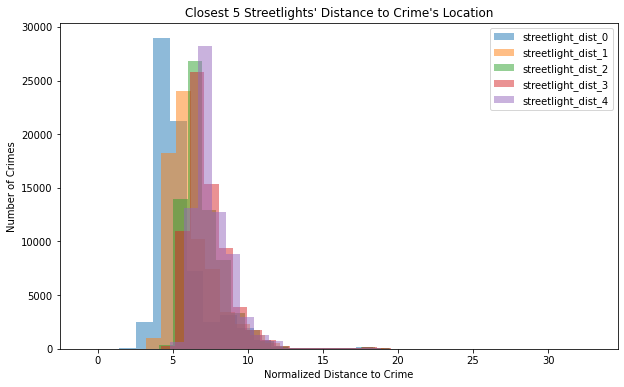

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10,6))
for i in range(5):
  plt.hist(temp[f'streetlight_dist_{i}'], 
           label = f'streetlight_dist_{i}',
           alpha = 0.5,
           bins = 30)
plt.legend()
plt.title("Closest 5 Streetlights' Distance to Crime's Location")
plt.ylabel("Number of Crimes")
plt.xlabel("Normalized Distance to Crime")
plt.show()

4. Histogram of Distance from the closest 5 Stations to the Crime.
> We can see that very few crime is within 5 unit distance to the closest stations/stops. when the distance is below 5, fewer than 3000 cases on that. Starting from about 7, the number of crimes changes sharply as the distance increases by every 2 unit of distance. Based on this information, we choose the threshold of 7,9,11, and 13.


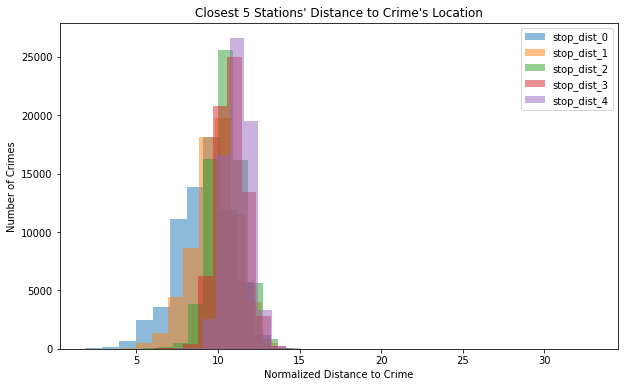

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10,6))
for i in range(5):
  plt.hist(temp[f'stop_dist_{i}'], label = f'stop_dist_{i}',alpha = 0.5,
           bins = 30)
plt.legend()
plt.title("Closest 5 Stations' Distance to Crime's Location")
plt.ylabel("Number of Crimes")
plt.xlabel("Normalized Distance to Crime")
plt.show()

5.  Number of stations/stops within a certain distance
> We choose the distance based on the previous section on exploring the first 5 closest stations. Then we count the number of stations that are within the chosen distance to the crime location.
By looking at the statistics result of each threshold, we can see from distance 7 to distance 9 threshold, the 75% percentile increased from 0 to 1. And as the threshold increases, the 25% and 50% also increases. Therefore, we know the chosen threshold is capturing some information that shows the difference between crime location in terms of distance to stations/stops.

In [ ]:
def within_dist_stops(x, min_dist ):
  num = 0
  stop_dist_cols = [c for c in crime_loc.columns if 'stop_dist_' in c]
  for s in stop_dist_cols:
    if x[s]<min_dist: 
      num+=1
    else:
      return num
  return num

for dist in range(7,14,2):
  crime_loc[f'within_dist_stops_{dist}'] = crime_loc.apply(within_dist_stops, 
                                                args = (dist,),
                                                axis = 1)

In [ ]:
within_stops_dist_cols = [f'within_dist_stops_{dist}' for dist in range(7,14,2)]
crime_loc[within_stops_dist_cols].describe()

,within_dist_stops_7,within_dist_stops_9,within_dist_stops_11,within_dist_stops_13
count,80818.000000,80818.000000,80818.000000,80818.000000
mean,0.262070,1.390371,7.585018,27.400616
std,0.883219,1.944092,4.658729,5.231496
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,4.000000,28.000000
50%,0.000000,0.000000,8.000000,30.000000
75%,0.000000,2.000000,10.000000,30.000000
max,8.000000,12.000000,25.000000,30.000000


6.  Average loading, ons, and offs within distance
> We use the same distance threshold and above. Then we average the loading, ons, and offs of the stations that are within certain distance to the crime loaction

In [ ]:
import numpy as np
def within_stops_ridership(x, ridership_col, min_dist ):
  num = []
  stop_dist_cols = [c for c in crime_loc.columns if 'stop_dist_' in c]
  for s in sorted(stop_dist_cols):
    if x[s]<min_dist: 
      index = s.split('_')[-1]
      col = ridership_col+ "_" + index
      num.append(x[col])
    else:
      if len(num)==0:
        return 0
      return np.mean(num)
  if len(num)==0:
    return 0
  else:
    return np.mean(num)
    
for i in range(7,14,2):
  crime_loc[f'within_avgload_{i}'] = crime_loc.apply(within_stops_ridership, 
                                                     args=('average_load',i,),
                                                     axis = 1)
for i in range(7,14,2):
  crime_loc[f'within_avgons_{i}'] = crime_loc.apply(within_stops_ridership, 
                                                     args=('average_ons',i,),
                                                     axis = 1)
for i in range(7,14,2):
  crime_loc[f'within_avgoffs_{i}'] = crime_loc.apply(within_stops_ridership, 
                                                     args=('average_offs',i,),
                                                     axis = 1)

7.  number of streetlights within distance
>We choose the distance based on the previous section on exploring the first 5 closest streetlights. Then we count the number of streetlights that are within the chosen distance to the crime location. By looking at the statistics result of each threshold, we can see the percentile of each distance threshold is different which means such method is capturing some difference between the crime location.

In [ ]:
def within_streetlight_stops(x, min_dist ):
  num = 0
  streetlight_dist_cols = [c for c in crime_loc.columns if 'streetlight_dist_' in c]
  for s in streetlight_dist_cols:
    if x[s]<min_dist: 
      num+=1
    else:
      return num
  return num

for dist in range(4,10):
  crime_loc[f'within_dist_streetlight_{dist}'] = crime_loc.apply(within_streetlight_stops, 
                                                args = (dist,),
                                                axis = 1)
  
within_streetlight_dist_cols = [f'within_dist_streetlight_{dist}' for dist in range(4,10)]
crime_loc[within_streetlight_dist_cols].describe()

,within_dist_streetlight_4,within_dist_streetlight_5,within_dist_streetlight_6,within_dist_streetlight_7,within_dist_streetlight_8,within_dist_streetlight_9
count,68986.000000,68986.000000,68986.000000,68986.000000,68986.000000,68986.000000
mean,0.090627,0.787131,1.704302,3.576581,8.020077,17.947018
std,0.304336,0.826370,1.298943,2.499048,5.289597,10.255616
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,2.000000,4.000000,9.000000
50%,0.000000,1.000000,2.000000,3.000000,8.000000,19.000000
75%,0.000000,1.000000,2.000000,5.000000,12.000000,30.000000
max,2.000000,5.000000,12.000000,21.000000,30.000000,30.000000


#### Step 5. Save the partial results to crime_cloest_n.csv 
drop the column that stores the not formatted list information

In [ ]:
crime_loc.drop(columns = ['cloest_n_stop_dist','cloest_n_stop',
                          'cloest_n_streetlight']).to_csv("data/crime_cloest_n.csv",
                                                          index = False)

### Streetlight & Ridership EDA - Correlation Heatmap
The heatmap shows the correlation between the average loadings, ons, offs of the stations that are within certain distance to the crime location. The second plots also include the streetlight location. Because there does not exist correlation greater than 0.9, we do not drop any columns

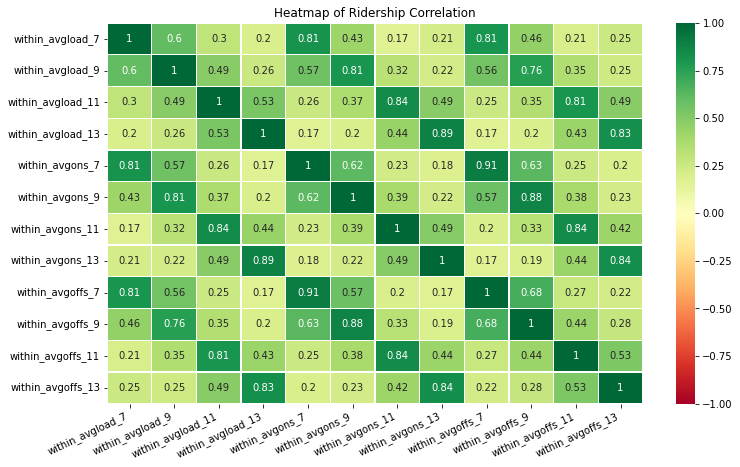

In [ ]:
within_cols_ridership = [c for c in crime_loc.columns if "within_avg" in c  ]
heatmap(crime_loc[within_cols_ridership].corr(), 'Heatmap of Ridership Correlation')

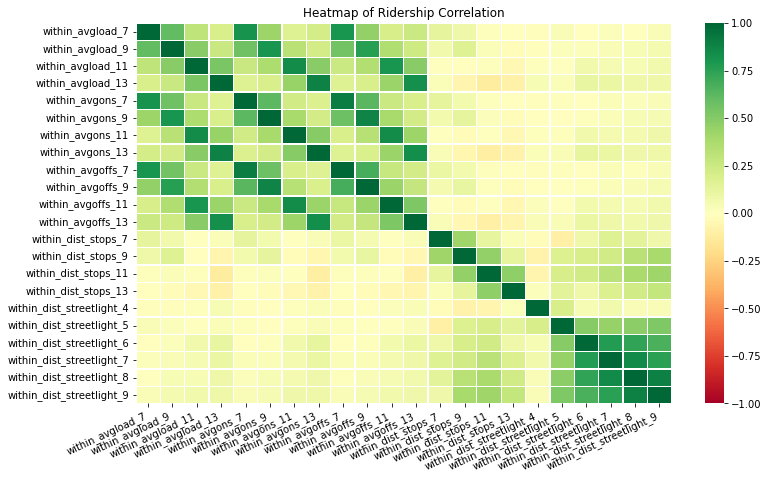

In [ ]:
heatmap(crime_loc[within_cols_ridership+within_cols].corr(), 'Heatmap of Ridership Correlation',annot =False)

## Data 7. Property Assessment Data
The property assessment data is retrieved from the [Boston government page](https://data.boston.gov/dataset/property-assessment). From this dataset, we can retrieve property-related information, such as the assessed value for property and the age of the property. Since the value of the property does not change much from 2020 to 2021 and for higher efficiency, we used data from 2021 to proceed.

### Load and Manage Property Data

In [ ]:
property_2021 = pd.read_csv('data2021-full.csv')

In [ ]:
property_2021.head()

,PID,CM_ID,GIS_ID,ST_NUM,ST_NAME,UNIT_NUM,CITY,ZIPCODE,BLDG_SEQ,NUM_BLDGS,...,KITCHEN_STYLE2,KITCHEN_STYLE3,HEAT_TYPE,HEAT_FUEL,AC_TYPE,FIRE_PLACE,PlUMBING,NUM_PARKING,PROP_VIEW,CORNER_UNIT
0,100001000,NaN,100001000.0,104 A 104,PUTNAM ST,NaN,EAST BOSTON,2128,1.0,1.0,...,S - Semi-Modern,S - Semi-Modern,W - Ht Water/Steam,NaN,N - None,NaN,NaN,3.0,A - Average,NaN
1,100002000,NaN,100002000.0,197,LEXINGTON ST,NaN,EAST BOSTON,2128,1.0,1.0,...,M - Modern,M - Modern,F - Forced Hot Air,NaN,C - Central AC,NaN,NaN,NaN,A - Average,NaN
2,100003000,NaN,100003000.0,199,LEXINGTON ST,NaN,EAST BOSTON,2128,1.0,1.0,...,S - Semi-Modern,S - Semi-Modern,S - Space Heat,NaN,N - None,NaN,NaN,NaN,A - Average,NaN
3,100004000,NaN,100004000.0,201,LEXINGTON ST,NaN,EAST BOSTON,2128,1.0,1.0,...,S - Semi-Modern,S - Semi-Modern,W - Ht Water/Steam,NaN,N - None,NaN,NaN,NaN,A - Average,NaN
4,100005000,NaN,100005000.0,203,LEXINGTON ST,NaN,EAST BOSTON,2128,1.0,1.0,...,S - Semi-Modern,NaN,W - Ht Water/Steam,NaN,N - None,NaN,NaN,NaN,A - Average,NaN


There are 63 columns in this dataset. Since in the original website there is no data dictionary for the 2021 data, I will hand-pick the understandable quantitiative variables as below.

In [ ]:
columns = ['ZIPCODE', 'LIVING_AREA', 'LAND_VALUE', 'BLDG_VALUE', 'TOTAL_VALUE', 'GROSS_TAX', 'YR_BUILT', 'YR_REMODEL']
df21 = pd.DataFrame(property_2021, columns=columns)

In [ ]:
df21.head()

,ZIPCODE,LIVING_AREA,LAND_VALUE,BLDG_VALUE,TOTAL_VALUE,GROSS_TAX,YR_BUILT,YR_REMODEL
0,2128,2202.0,"$179,500.00","$539,900.00","$719,400.00","$7,676.00",1900.0,NaN
1,2128,2307.0,"$180,300.00","$564,500.00","$744,800.00","$7,947.02",1920.0,2000.0
2,2128,2268.0,"$180,800.00","$549,700.00","$730,500.00","$7,794.44",1905.0,1985.0
3,2128,2028.0,"$181,400.00","$486,500.00","$667,900.00","$7,126.49",1900.0,1991.0
4,2128,2546.0,"$202,800.00","$511,400.00","$714,200.00","$7,620.52",1900.0,1978.0


### Property Data EDA

In [ ]:
df21['LAND_VALUE'] = df21['LAND_VALUE'].str.replace(',', '').str.replace('$', '')
df21['LAND_VALUE'] = pd.to_numeric(df21['LAND_VALUE'],errors='coerce')
df21['BLDG_VALUE'] = df21['BLDG_VALUE'].str.replace(',', '').str.replace('$', '')
df21['BLDG_VALUE'] = pd.to_numeric(df21['BLDG_VALUE'],errors='coerce')
df21['TOTAL_VALUE'] = df21['TOTAL_VALUE'].str.replace(',', '').str.replace('$', '')
df21['TOTAL_VALUE'] = pd.to_numeric(df21['TOTAL_VALUE'],errors='coerce')
df21['GROSS_TAX'] = df21['GROSS_TAX'].str.replace(',', '').str.replace('$', '')
df21['GROSS_TAX'] = pd.to_numeric(df21['GROSS_TAX'],errors='coerce')

df21.head()

<ipython-input-58-8ccde8ac5e0b>:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df21['LAND_VALUE'] = df21['LAND_VALUE'].str.replace(',', '').str.replace('$', '')
<ipython-input-58-8ccde8ac5e0b>:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df21['BLDG_VALUE'] = df21['BLDG_VALUE'].str.replace(',', '').str.replace('$', '')
<ipython-input-58-8ccde8ac5e0b>:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df21['TOTAL_VALUE'] = df21['TOTAL_VALUE'].str.replace(',', '').str.replace('$', '')
<ipython-input-58-8ccde8ac5e0b>:7: Fut

,ZIPCODE,LIVING_AREA,LAND_VALUE,BLDG_VALUE,TOTAL_VALUE,GROSS_TAX,YR_BUILT,YR_REMODEL
0,2128,2202.0,179500.0,539900.0,719400.0,7676.00,1900.0,NaN
1,2128,2307.0,180300.0,564500.0,744800.0,7947.02,1920.0,2000.0
2,2128,2268.0,180800.0,549700.0,730500.0,7794.44,1905.0,1985.0
3,2128,2028.0,181400.0,486500.0,667900.0,7126.49,1900.0,1991.0
4,2128,2546.0,202800.0,511400.0,714200.0,7620.52,1900.0,1978.0


Now, we will update the model time to the year built, and rename the column name as YEAR_MODELED.

In [ ]:
df21['YR_REMODEL'] = df21['YR_REMODEL'].fillna(df21['YR_BUILT'])
df21 = df21.drop('YR_BUILT', 1)
df21.rename(columns = {'YR_REMODEL':'YEAR_MODELED'}, inplace = True)
df21.head()

,ZIPCODE,LIVING_AREA,LAND_VALUE,BLDG_VALUE,TOTAL_VALUE,GROSS_TAX,YEAR_MODELED
0,2128,2202.0,179500.0,539900.0,719400.0,7676.00,1900.0
1,2128,2307.0,180300.0,564500.0,744800.0,7947.02,2000.0
2,2128,2268.0,180800.0,549700.0,730500.0,7794.44,1985.0
3,2128,2028.0,181400.0,486500.0,667900.0,7126.49,1991.0
4,2128,2546.0,202800.0,511400.0,714200.0,7620.52,1978.0


Now, we will check the correlation between variables.

In [ ]:
print(df21.corr())

               ZIPCODE  LIVING_AREA  LAND_VALUE  BLDG_VALUE  TOTAL_VALUE  \
ZIPCODE       1.000000    -0.001314    0.016468   -0.001615    -0.000094   
LIVING_AREA  -0.001314     1.000000    0.740510    0.717148     0.784830   
LAND_VALUE    0.016468     0.740510    1.000000    0.650384     0.802387   
BLDG_VALUE   -0.001615     0.717148    0.650384    1.000000     0.972380   
TOTAL_VALUE  -0.000094     0.784830    0.802387    0.972380     1.000000   
GROSS_TAX    -0.000624     0.497524    0.517603    0.689519     0.692328   
YEAR_MODELED -0.007367     0.033196    0.067094    0.045874     0.041783   

              GROSS_TAX  YEAR_MODELED  
ZIPCODE       -0.000624     -0.007367  
LIVING_AREA    0.497524      0.033196  
LAND_VALUE     0.517603      0.067094  
BLDG_VALUE     0.689519      0.045874  
TOTAL_VALUE    0.692328      0.041783  
GROSS_TAX      1.000000      0.030401  
YEAR_MODELED   0.030401      1.000000  


We can see that total value, building value, living area, and gross tax all have very high correlations. Therefore, we will only keep one of those. Since gross_tax is most correlated with total value of the property, we will keep the total value.

In [ ]:
columns_new = ['ZIPCODE', 'YEAR_MODELED', 'TOTAL_VALUE']
df21_final = pd.DataFrame(df21, columns=columns_new)

In [ ]:
df21_final.head()

,ZIPCODE,YEAR_MODELED,TOTAL_VALUE
0,2128,1900.0,719400.0
1,2128,2000.0,744800.0
2,2128,1985.0,730500.0
3,2128,1991.0,667900.0
4,2128,1978.0,714200.0


In [ ]:
df21_final['ZIPCODE'].unique()

array([2128, 2115, 2130, 2129, 2119, 2114, 2113, 2109, 2108, 2110, 2201,
       2210, 2116, 2111, 2127, 2118, 2199, 2215, 2120, 2133, 2125, 2122,
       2124, 2131, 2121, 2126, 2136, 2132, 2137, 2135, 2467, 2026, 2134,
       2446, 2445])

In [ ]:
df21_final['YEAR_MODELED'].unique()

array([1900., 2000., 1985., 1991., 1978., 2018., 2009., 1998., 2014.,
       1993., 1965., 1910., 2004., 1980., 2015., 1920., 1880., 1899.,
       1994., 2001., 2011., 2017., 1969., 1995., 2013., 2002., 1992.,
       1997., 2016., 1999., 1914., 1970., 1990., 1982., 1981., 1905.,
       1930.,   nan, 1996., 1925., 1988., 2019., 1984., 2007., 1987.,
       2012., 2005., 1890., 1940., 2003., 1989., 1967., 1986., 2006.,
       1954., 1911., 1983., 1979., 1915., 1876., 1968., 2010., 1916.,
       1960., 1964., 1950., 2008., 1975., 1927., 1918., 1870., 1906.,
       1903., 1894., 1945., 1875., 1922., 1912., 1966., 1938., 1895.,
       1923., 1924., 1972., 1902., 1962., 1937., 1958., 1919., 1932.,
       1926., 1963., 1928., 1935., 1907., 1977., 1889., 1959., 1947.,
       1943., 1886., 1952., 1956., 1957., 1885., 1934., 1948., 1955.,
       1936., 1893., 1909., 1933., 1961., 1976., 1917., 1951., 1944.,
       1939., 1942., 1901., 1898., 1850., 1873., 1860., 1973., 1835.,
       1865., 1851.,

In [ ]:
df21_final['OLDER_THAN_1800'] = np.where(df21_final['YEAR_MODELED'] < 1800, 1, 0)
df21_final['1800-1850'] = np.where((1800 <= df21_final['YEAR_MODELED']) & (df21_final['YEAR_MODELED'] < 1850), 1, 0)
df21_final['1850-1900'] = np.where((1850 <= df21_final['YEAR_MODELED']) & (df21_final['YEAR_MODELED'] < 1900), 1, 0)
df21_final['1900-1950'] = np.where((1900 <= df21_final['YEAR_MODELED']) & (df21_final['YEAR_MODELED'] < 1950), 1, 0)
df21_final['1950-2000'] = np.where((1950 <= df21_final['YEAR_MODELED']) & (df21_final['YEAR_MODELED'] <= 2000), 1, 0)
df21_final['NEWER_THAN_2000'] = np.where(df21_final['YEAR_MODELED'] > 2000, 1, 0)
df21_final.head()

,ZIPCODE,YEAR_MODELED,TOTAL_VALUE,OLDER_THAN_1800,1800-1850,1850-1900,1900-1950,1950-2000,NEWER_THAN_2000
0,2128,1900.0,719400.0,0,0,0,1,0,0
1,2128,2000.0,744800.0,0,0,0,0,1,0
2,2128,1985.0,730500.0,0,0,0,0,1,0
3,2128,1991.0,667900.0,0,0,0,0,1,0
4,2128,1978.0,714200.0,0,0,0,0,1,0


In [ ]:
df = (df21_final.groupby('ZIPCODE', as_index=False)
       .agg({'OLDER_THAN_1800':'sum', 
            '1800-1850':'sum',
             '1850-1900': 'sum', 
             '1900-1950' : 'sum', 
             '1950-2000' :'sum', 
             'NEWER_THAN_2000': 'sum',
             'TOTAL_VALUE':'std'}))

print(df)

    ZIPCODE  OLDER_THAN_1800  1800-1850  1850-1900  1900-1950  1950-2000  \
0      2026                0          0          0          3          0   
1      2108                0          5         30         48        640   
2      2109                0          0         18         98        985   
3      2110                0          0          3          6        722   
4      2111                0          0         25         25        976   
5      2113                0          0         52         46       1094   
6      2114                1          4        140         59       2341   
7      2115                0          0         82        152       2321   
8      2116                0          2        131        119       4127   
9      2118                0          2        224        140       2878   
10     2119                0          6        514        693       1285   
11     2120                0          1         77        251        566   
12     2121 

We generate a headmap to learn about the correlations.

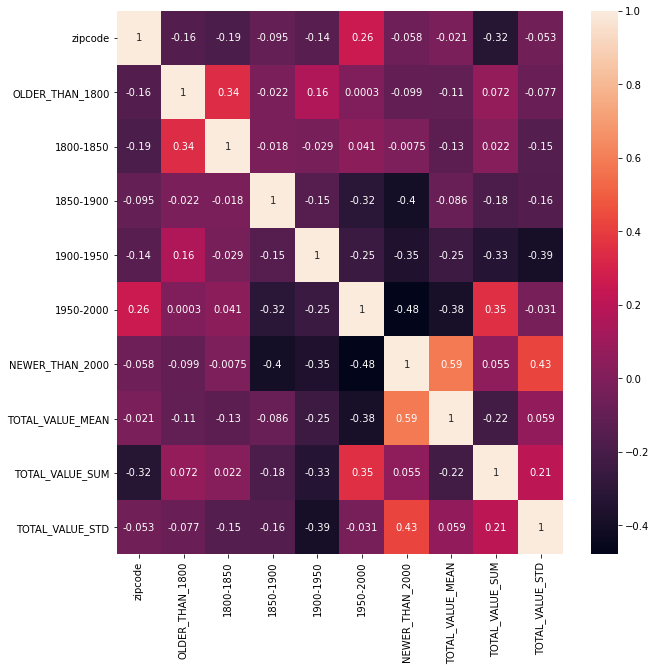

In [ ]:
import seaborn as sns

  
#ploting the heatmap for correlation
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10,10))
ax = sns.heatmap(property.corr(), annot=True)

The correlation map looks great. We then merge the dataset with the crime data based on zipcode

In [ ]:
property.to_csv("data/property.csv")


# 2. Merge ALL Data (generate our final cleaned data for training and testing)

### Load in original crime data

In [ ]:
crime = pd.read_excel("data/crime_data_merged.xlsx")
crime.INCIDENT_NUMBER = crime.INCIDENT_NUMBER.astype(str)
crime_loc.INCIDENT_NUMBER = crime_loc.INCIDENT_NUMBER.astype(str)
df = pd.merge(crime[['MONTH','INCIDENT_NUMBER']] , crime_loc, on = 'INCIDENT_NUMBER',how = 'outer')

### Merge economic data with crime data
1. reformat the month column of economic data to merge it with crime data.
2. Interpolate the data linearly because there are some economic indicators that are recorded every two months

In [ ]:
def month_to_num(x):
  if x == 'Jan':
    return 1
  elif x == 'Feb':
    return 2
  elif x == 'Mar':
    return 3
  elif x == 'Apr':
    return 4
  elif x == 'May':
    return 5
  elif x == 'Jun':
    return 6
  elif x == 'Jul':
    return 7
  elif x == 'Aug':
    return 8
  elif x == 'Sep':
    return 9
  elif x == 'Oct':
    return 10
  elif x == 'Nov':
    return 11
  elif x == 'Dec':
    return 12

In [ ]:
econ_data['MONTH'] = econ_data.month.apply(month_to_num)
econ_data = econ_data[econ_data.MONTH<=12].copy()
econ_data.sort_values(by = ['Year','MONTH'],inplace = True)
econ_data = econ_data.iloc[:-2]
cleaned_econ_data = econ_data.interpolate()

In [ ]:
df2 = pd.merge(df, cleaned_econ_data.drop(columns = ['Unnamed: 0']), 
                                  left_on = ['YEAR','MONTH'], 
                                  right_on = ['Year','MONTH'])
df2.drop(columns = ['Year','month'],inplace = True)

In [ ]:
df = df2.copy()

### Merge ZIPcode data with crime data so that property data can be merged as well

In [ ]:
!pip install geopandas
!pip install geojson
import geopandas as gpd
from shapely.geometry import Point, Polygon

In [ ]:
districts_full = gpd.read_file('data/ZIP_Codes.geojson')
districts = districts_full[["ZIP5", "geometry"]].set_index("ZIP5")
districts.head()


,geometry
ZIP5,
02134,"POLYGON ((-71.12340 42.36421, -71.12345 42.364..."
02125,"POLYGON ((-71.04541 42.32381, -71.04579 42.323..."
02110,"POLYGON ((-71.05109 42.36418, -71.05109 42.364..."
02118,"POLYGON ((-71.06315 42.34689, -71.06433 42.347..."
02126,"POLYGON ((-71.09670 42.29095, -71.09692 42.290..."


In [ ]:
def coord_district(x):
  for district in districts.index.tolist():
    if districts[districts.index==district].geometry.iloc[0].contains(x):
      return district
  return None

In [ ]:
df['geometry'] = df.apply(lambda x: Point(x.LONG,x.LAT),axis = 1)
df['zipcode'] = df.geometry.apply(coord_district)

### Merge with weather and neighborhood data

In [ ]:
cwn = pd.read_csv("data/crime_weather_neighborhood.csv")
cwn.INCIDENT_NUMBER = cwn.INCIDENT_NUMBER.astype(str)
cwn = pd.get_dummies(cwn,columns = ['MONTH','DAY_OF_WEEK','HOUR'],drop_first = True)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
# We only keep the columns that shows the ridership, number of stations and number of streetlights within certain distance 
kept_columns = [c for c in df.columns if 'within_' in c ]+econ_data.columns[3:-1].tolist()
# Save data
final = pd.merge(cwn,df[['INCIDENT_NUMBER','MONTH','time_period','YEAR','zipcode','streetlight_dist_0','stop_dist_0']+kept_columns].drop(columns = ['professional_business_wage',
                                                      'other_wage',
                                                      'mining_logging_construction_wage',
                                                      'total_nonfarm_wage',
                                                      'MONTH',
                                                      'cpiw']),
         on = 'INCIDENT_NUMBER').drop(columns = ['Unnamed: 0','Unnamed:_0'])

In [ ]:
final.to_csv("data/crime_weather_neighborhood_econ_lgt_mbta.csv",index = False)

### Merge with Property Data

In [ ]:
property = pd.read_csv("data/property.csv")
pd.merge(property,final, on  = 'zipcodes').to_csv("cleaned_data.csv")

# 3. Result Interpretation
We put the training process of each model which is before the result interpretation to the very end because it is too long. Feel free to skip that part if not interested in how we select the best hyperparameter for each model. Here, we already know the best models to predict shooting, violence, property, and other crimes, so we are trying to interpretate the model result.

In [ ]:
!pip install shap
!pip install eli5
!pip install lime

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_validate
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
import sklearn.metrics as metrics
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score, confusion_matrix, recall_score
import statsmodels.api as sm
from sklearn.inspection import permutation_importance
import shap

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
crime = pd.read_csv('cleaned_data.csv')

## Random Forest Feature Importance (Shooting & Other Crimes)

### Model 1: Predicting Shooting vs other violence

1. Data Loading and Preprocess

In [ ]:
crime_violence = crime.loc[crime['CRIME_TYPE_VIOLENT'] == 1]
crime_violence.head()

,SHOOTING,LAT,LONG,totalSnow_cm,FeelsLikeC,humidity,precipMM,windspeedKmph,CRIME_TYPE_OTHER,CRIME_TYPE_PROPERTY,CRIME_TYPE_VIOLENT,TOTAL_POPULATION_x,MEDIAN_AGE,MARRIED-COUPLE_FAMILY,"MALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT","FEMALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT",HOUSEHOLDER_LIVING_ALONE,POPULATION_IN_GROUP_QUARTERS,LESS_THAN_HIGH_SCHOOL_,HIGH_SCHOOL_GRADUATE,GED_OR_ALTERNATIVE_CREDENTIAL,SOME_COLLEGE_,ASSOCIATE'S_DEGREE,BACHELOR'S_DEGREE,_MASTER'S_DEGREE_OR_MORE,OWNER_OCCUPIED,RENTER_OCCUPIED,POVERTY_RATE,night,MONTH_2,MONTH_3,MONTH_4,MONTH_5,MONTH_6,MONTH_7,MONTH_8,MONTH_9,MONTH_10,MONTH_11,MONTH_12,...,within_dist_stops_7,within_dist_stops_9,within_dist_stops_11,within_dist_stops_13,within_dist_streetlight_4,within_dist_streetlight_5,within_dist_streetlight_6,within_dist_streetlight_7,within_dist_streetlight_8,within_dist_streetlight_9,within_avgload_7,within_avgload_9,within_avgload_11,within_avgload_13,within_avgons_7,within_avgons_9,within_avgons_11,within_avgons_13,within_avgoffs_7,within_avgoffs_9,within_avgoffs_11,within_avgoffs_13,labor,manufacture_wage,trade_transportation_utilities_wage,info_wage,finance_wage,edu_health_wage,leisure_hospitality_wage,govern_wage,cpiu,OLDER_THAN_1800,1800-1850,1850-1900,1900-1950,1950-2000,NEWER_THAN_2000,TOTAL_VALUE_MEAN,TOTAL_VALUE_SUM,TOTAL_VALUE_STD
1,1,42.281486,-71.077565,0.0,-7,32,0.0,25,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,18,0,0,1,1,2,4,0.0,0.000000,0.000000,13.954083,0.0,0.000,0.000000,0.253542,0.0,0.0000,0.000000,1.183583,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000205,0.000307,0.065554,0.327154,0.257913,0.348868,7.090155e+05,7516272884,4565481.536
3,1,42.297466,-71.082743,0.0,-3,52,0.0,12,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,11,0,0,1,1,2,4,0.0,0.000000,0.000000,15.773931,0.0,0.000,0.000000,0.611889,0.0,0.0000,0.000000,0.589639,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000000,0.055129,0.346405,0.217960,0.380506,6.305542e+05,2613646962,1592332.950
5,1,42.333970,-71.086395,0.5,-4,48,0.0,20,0,0,1,54161,32.5,3536,1232,6159,7380,4084,7733,8227,1675,6363,1910,5048,2632,4326,15573,0.316872,1,0,0,0,0,0,0,0,0,0,0,1,...,0,1,4,30,0,2,4,5,13,30,0.0,17.445833,17.353333,242.576565,0.0,0.090,0.067917,53.539207,0.0,0.0775,0.159167,33.478411,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000653,0.050261,0.163838,0.369452,0.415796,1.748675e+06,3098652127,6603268.052
6,1,42.285658,-71.139780,0.0,-2,84,0.0,14,0,0,1,33526,42.8,6436,525,1566,4433,539,1650,4187,700,3344,1669,6592,7134,8905,5028,0.063143,1,0,0,0,0,0,0,0,0,0,0,1,...,0,2,3,17,0,0,0,0,0,4,0.0,11.800250,11.800250,14.478512,0.0,0.079,0.079000,0.109253,0.0,0.4720,0.472000,1.722296,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000240,0.000120,0.036006,0.313490,0.269563,0.380581,6.016591e+05,5105679078,1642721.262
14,1,42.294236,-71.079025,0.0,0,71,0.0,9,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,1,9,0,0,2,2,3,4,0.0,0.000000,23.540000,23.172500,0.0,0.000,0.767500,0.877500,0.0,0.0000,1.655000,1.461250,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000205,0.000307,0.065554,0.327154,0.257913,0.348868,7.090155e+05,7516272884,4565481.536


In [ ]:
remove_cols = ['SHOOTING', 'CRIME_TYPE_VIOLENT', 'CRIME_TYPE_OTHER', 'CRIME_TYPE_PROPERTY']
X = crime_violence.columns.tolist()
X = [c for c in X if c not in remove_cols]

X_violent = crime_violence[X]
y_violent = crime_violence['SHOOTING'].values
X_train, X_test, y_train, y_test = train_test_split(X_violent, y_violent, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train_scaled = pd.DataFrame(X_train_scaled)
X_test_scaled = pd.DataFrame(X_test_scaled)

2. Train the Random Forest to predict SHOOTING with the best hyperparameters 

In [ ]:

best_rf = RandomForestClassifier(n_jobs=-1,max_features = 'sqrt',
                                 random_state=2021, 
                                 class_weight = "balanced",bootstrap=True,
                                 max_depth=6,min_samples_leaf= 7,
                                 min_samples_split= 2,n_estimators=300)
best_rf.fit(X_train_scaled, y_train)
y_proba = best_rf.predict_proba(X_test_scaled)[:, 1]
y_pred = best_rf.predict(X_test_scaled)
auc = np.round(roc_auc_score(y_test, y_proba),2)
print(f'GridSearchCV RF AUC on test set:{auc}')
print('F1 Weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 Raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

GridSearchCV RF AUC on test set:0.8
F1 Weighted Score: 0.853
F1 Raw Score: 0.284
Accuracy: 0.807
Confusion Matrix: [[926 206]
 [ 26  46]]
Recall Score: 0.6388888888888888


3. Plot Feature Importance Plot

Text(0.5, 1.0, 'Feature Importance of Shooting versus all other crimes in random forest model')

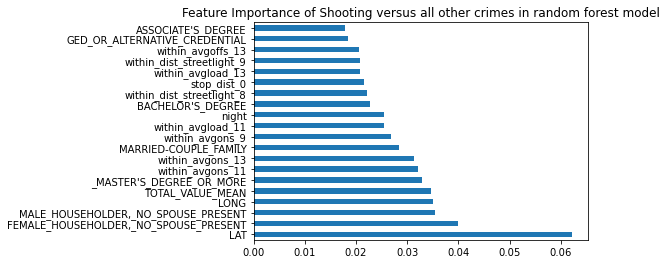

In [ ]:
importances = pd.Series(best_rf.feature_importances_, index = X_violent.columns)
importances.nlargest(20).plot(kind = 'barh')
plt.title("Feature Importance of Shooting versus all other crimes in random forest model")

#### SHAP Value



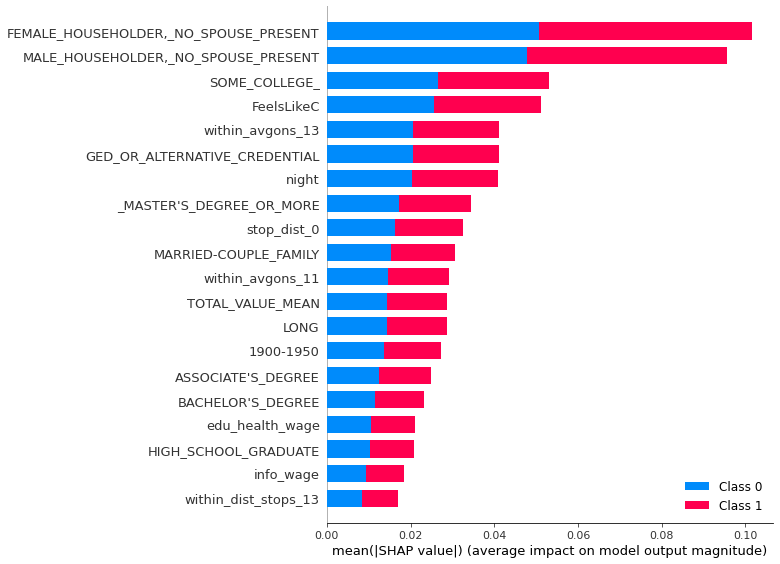

In [ ]:
import shap

feature_names = X_violent.columns.tolist()
shoot_x=pd.DataFrame(X_test_scaled,columns=feature_names)

shoot_orig_x=pd.DataFrame(X_test,columns=feature_names)
shap_values = shap.TreeExplainer(best_rf).shap_values(shoot_x,approximate=True, check_additivity=False)

shap.summary_plot(shap_values, shoot_x, max_display=20,feature_names =feature_names )

#### RF Feature Importance

In [ ]:
from eli5 import show_weights

show_weights(best_rf, feature_names=shoot_orig_x.columns.values)

Weight,Feature
0.0624 ± 0.1866,LAT
0.0419 ± 0.1804,"FEMALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT"
0.0361 ± 0.1744,"MALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT"
0.0348 ± 0.0923,LONG
0.0344 ± 0.1631,TOTAL_VALUE_MEAN
0.0320 ± 0.0761,within_avgons_13
0.0319 ± 0.1520,_MASTER'S_DEGREE_OR_MORE
0.0316 ± 0.0904,within_avgons_11
0.0284 ± 0.1293,MARRIED-COUPLE_FAMILY
0.0270 ± 0.0840,within_avgons_9


#### LIME

In [ ]:
import lime
import lime.lime_tabular
cat_feature=['night', 'MONTH_2', 'MONTH_3', 'MONTH_4',
       'MONTH_5', 'MONTH_6', 'MONTH_7', 'MONTH_8', 'MONTH_9', 'MONTH_10',
       'MONTH_11', 'MONTH_12', 'DAY_OF_WEEK_Monday',
       'DAY_OF_WEEK_Saturday', 'DAY_OF_WEEK_Sunday',
       'DAY_OF_WEEK_Thursday', 'DAY_OF_WEEK_Tuesday',
       'DAY_OF_WEEK_Wednesday', 'HOUR_1', 'HOUR_2', 'HOUR_3', 'HOUR_4',
       'HOUR_5', 'HOUR_6', 'HOUR_7', 'HOUR_8', 'HOUR_9', 'HOUR_10',
       'HOUR_11', 'HOUR_12', 'HOUR_13', 'HOUR_14', 'HOUR_15', 'HOUR_16',
       'HOUR_17', 'HOUR_18', 'HOUR_19', 'HOUR_20', 'HOUR_21', 'HOUR_22',
       'HOUR_23', 'YEAR_y']
explainer = lime.lime_tabular.LimeTabularExplainer( X_test.values,feature_names = X_violent.columns.values,class_names=['non-shooting','shooting'],kernel_width=10,categorical_features=cat_feature)

predict_fn = lambda x: best_rf.predict_proba(scaler.transform(x)).astype(float)
exp = explainer.explain_instance(X_test.values[206,:], predict_fn, num_features=10)
exp.show_in_notebook(show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


### Model 4: Predicting other trivial crime vs all other crimes

1. Data Preprocess

In [ ]:
remove_cols = ['CRIME_TYPE_OTHER', 'CRIME_TYPE_PROPERTY', 'CRIME_TYPE_VIOLENT', 'SHOOTING']
X = crime.columns.tolist()
X = [c for c in X if c not in remove_cols]

X = crime[X]
y_4 = crime['CRIME_TYPE_OTHER'].values

X_train, X_test, y_train, y_test = train_test_split(X, y_4, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

2. Train Model with Best Hyperparameter

In [ ]:
param_grid = {
    
    'min_samples_split': [6, 8,10,12],
    'min_samples_leaf': [30, 40, 50, 60,],
    'n_estimators': [50,100, 200,500,1000]
}
# Create a based model
rf = RandomForestClassifier(n_jobs=-1,max_features = 'sqrt',random_state=2021, class_weight = "balanced")
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, scoring='roc_auc', verbose=10,
                          cv = 3, n_jobs = -1)

results = grid_search.fit(X_train, y_train)
print(results.best_estimator_.get_params())
res=results.cv_results_

In [ ]:
best_rf = RandomForestClassifier(n_jobs=-1,max_features = 'sqrt',random_state=2021, class_weight = "balanced",n_estimators=1000,min_samples_leaf=40,min_samples_split=6)
best_rf.fit(X_train, y_train)
y_proba = best_rf.predict_proba(X_test)[:, 1]
y_pred = best_rf.predict(X_test)
auc = np.round(roc_auc_score(y_test, y_proba),2)
print(f'GridSearchCV RF AUC on test set:{auc}')
print('F1 Weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 Raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

GridSearchCV RF AUC on test set:0.63
F1 Weighted Score: 0.608
F1 Raw Score: 0.685
Accuracy: 0.612
Confusion Matrix: [[2545 2864]
 [2321 5635]]
Recall Score: 0.7082704876822524


3. Feature Importance

Text(0.5, 1.0, 'Feature Importance of Other crimes in Random Forest Model')

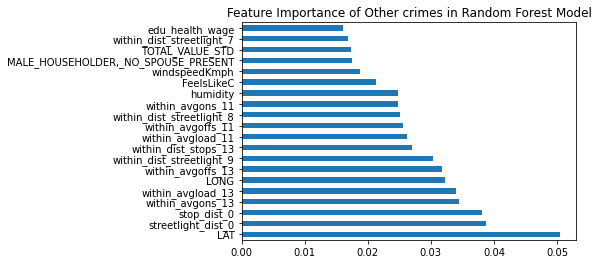

In [ ]:
importances = pd.Series(best_rf.feature_importances_, index = X.columns)
importances.nlargest(20).plot(kind = 'barh')
plt.title("Feature Importance of Other crimes in Random Forest Model")

#### SHAP Values

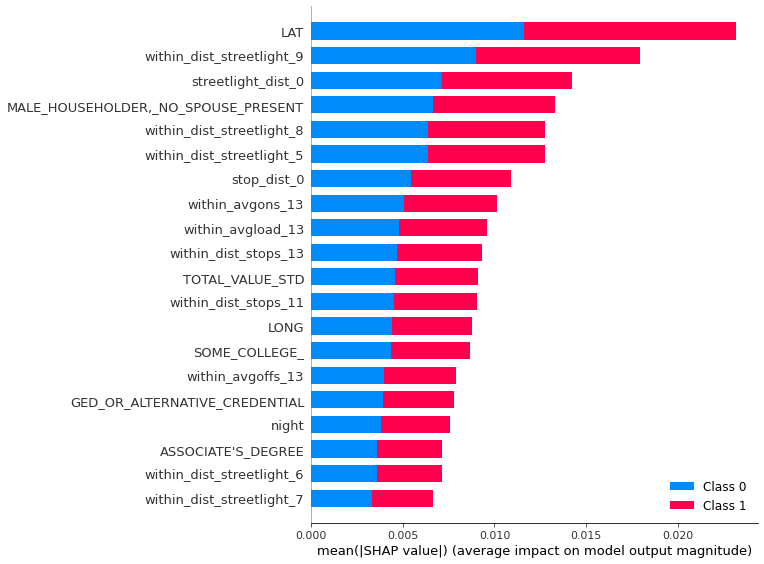

In [ ]:
import shap

feature_names = X.columns.tolist()
other_x=pd.DataFrame(X_test_scaled,columns=feature_names)

other_orig_x=pd.DataFrame(X_test,columns=feature_names)
shap_values = shap.TreeExplainer(best_rf).shap_values(other_x,approximate=True, check_additivity=False)

shap.summary_plot(shap_values, other_x, max_display=20,feature_names =feature_names )

#### RF Feature Importance

In [ ]:
from eli5 import show_weights

show_weights(best_rf, feature_names=other_orig_x.columns.values)

Weight,Feature
0.0505 ± 0.0683,LAT
0.0387 ± 0.0277,streetlight_dist_0
0.0382 ± 0.0271,stop_dist_0
0.0344 ± 0.0249,within_avgons_13
0.0340 ± 0.0237,within_avgload_13
0.0322 ± 0.0236,LONG
0.0318 ± 0.0224,within_avgoffs_13
0.0303 ± 0.0373,within_dist_streetlight_9
0.0270 ± 0.0245,within_dist_stops_13
0.0262 ± 0.0164,within_avgload_11


#### LIME

In [ ]:
import lime
import lime.lime_tabular
cat_feature=['night', 'MONTH_2', 'MONTH_3', 'MONTH_4',
       'MONTH_5', 'MONTH_6', 'MONTH_7', 'MONTH_8', 'MONTH_9', 'MONTH_10',
       'MONTH_11', 'MONTH_12', 'DAY_OF_WEEK_Monday',
       'DAY_OF_WEEK_Saturday', 'DAY_OF_WEEK_Sunday',
       'DAY_OF_WEEK_Thursday', 'DAY_OF_WEEK_Tuesday',
       'DAY_OF_WEEK_Wednesday', 'HOUR_1', 'HOUR_2', 'HOUR_3', 'HOUR_4',
       'HOUR_5', 'HOUR_6', 'HOUR_7', 'HOUR_8', 'HOUR_9', 'HOUR_10',
       'HOUR_11', 'HOUR_12', 'HOUR_13', 'HOUR_14', 'HOUR_15', 'HOUR_16',
       'HOUR_17', 'HOUR_18', 'HOUR_19', 'HOUR_20', 'HOUR_21', 'HOUR_22',
       'HOUR_23', 'YEAR_y']
explainer = lime.lime_tabular.LimeTabularExplainer( X_test.values,feature_names = X.columns.values,class_names=['non-other','other'],kernel_width=10,categorical_features=cat_feature)

predict_fn = lambda x: best_rf.predict_proba(scaler.transform(x)).astype(float)
exp = explainer.explain_instance(X_test.values[255,:], predict_fn, num_features=10)
exp.show_in_notebook(show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


## XGBOOST Feature Importance (Violent & Property Crimes)

In [ ]:
df = pd.read_csv("cleaned_data.csv")
target_values = ['SHOOTING','CRIME_TYPE_VIOLENT',
                 'CRIME_TYPE_PROPERTY',
                 'CRIME_TYPE_OTHER']

### Model 2: Predicting Violence vs all other crimes

1. Data Preprocess

In [ ]:
vio_x_tr, vio_x_test, vio_y_tr, vio_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_VIOLENT,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)
vio_scale_pos_weight = np.sum(vio_y_tr==0)/np.sum(vio_y_tr==1)
vio_scaler = StandardScaler()
vio_scaler.fit(vio_x_tr)
vio_x_tr_scaled = vio_scaler.transform(vio_x_tr)
vio_x_test_scaled = vio_scaler.transform(vio_x_test)

2. Train Model with Best Hyperparameter

In [ ]:
violence_final = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = vio_scale_pos_weight,
                                    n_estimators = 900,
                                    learning_rate = 0.5,
                                    random_state = 2021)

violence_final.fit(vio_x_tr_scaled,vio_y_tr)
vio_y_pred = violence_final.predict(vio_x_test_scaled)
print("roc_auc_score:",roc_auc_score(vio_y_test,violence_final.predict_proba(vio_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(vio_y_test,vio_y_pred))
print("f1_score weighted:",f1_score(vio_y_test,vio_y_pred,average='weighted'))
print("f1_score raw:",f1_score(vio_y_test,vio_y_pred))
print("recall_score:",recall_score(vio_y_test,vio_y_pred))
print("confusion_matrix:",confusion_matrix(vio_y_test,vio_y_pred))

roc_auc_score: 0.5984562153144961
accuracy_score: 0.6074074074074074
f1_score weighted: 0.6917293731975813
f1_score raw: 0.19264502231112476
recall_score: 0.5247275775356245
confusion_matrix: [[7492 4680]
 [ 567  626]]


#### SHAP

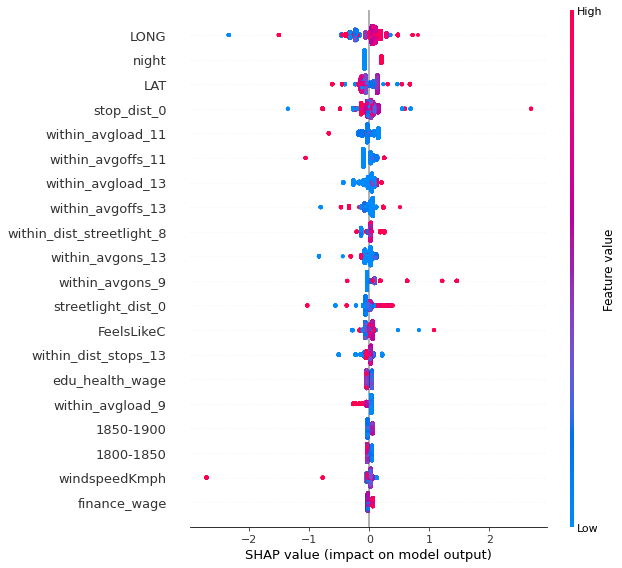

In [ ]:
import shap

feature_names = vio_x_tr.columns.tolist()
vio_x=pd.DataFrame(vio_x_test_scaled,columns=feature_names)

vio_orig_x=pd.DataFrame(vio_x_test,columns=feature_names)
shap_values = shap.TreeExplainer(violence_final).shap_values(vio_x)
shap.summary_plot(shap_values, vio_x, max_display=20,feature_names =feature_names )

invalid value encountered in true_divide
invalid value encountered in true_divide


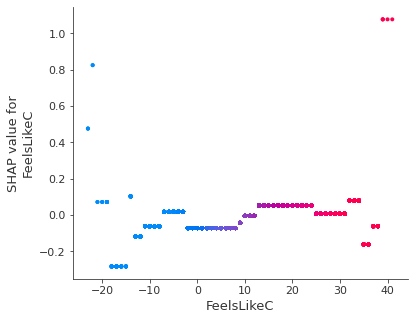

In [ ]:
shap.dependence_plot("FeelsLikeC", shap_values, vio_orig_x)

#### Eli 5 Importance

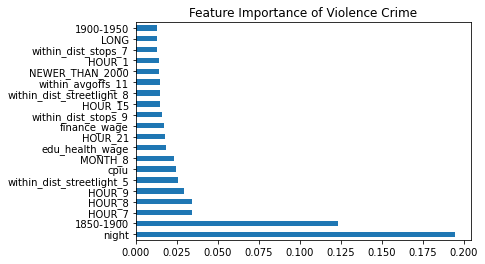

In [ ]:
vio_feat_importances = pd.Series(violence_final.feature_importances_, index=vio_x_tr.columns)
vio_feat_importances.nlargest(20).plot(kind='barh')
plt.title("Feature Importance of Violence Crime")
plt.show()

In [ ]:
from eli5 import show_weights
# Importance type: Gain
show_weights(violence_final, importance_type = 'gain',feature_names=vio_x_tr.columns.values)

Weight,Feature
0.1944,night
0.1234,1850-1900
0.0344,HOUR_7
0.0341,HOUR_8
0.0292,HOUR_9
0.0256,within_dist_streetlight_5
0.0245,cpiu
0.0233,MONTH_8
0.0184,edu_health_wage
0.0174,HOUR_21


In [ ]:
from eli5 import show_weights
# Importance type: Cover
show_weights(violence_final, importance_type = 'cover',feature_names=vio_x_tr.columns.values)

Weight,Feature
0.0145,1850-1900
0.0144,night
0.0143,MONTH_8
0.0142,HOUR_8
0.0142,edu_health_wage
0.0142,HOUR_9
0.0142,HOUR_7
0.0142,cpiu
0.0142,within_dist_stops_9
0.0142,within_dist_stops_7


In [ ]:
from eli5 import show_weights
# Importance type: Weight
show_weights(violence_final, importance_type = 'weight',feature_names=vio_x_tr.columns.values)

Weight,Feature
0.1067,stop_dist_0
0.1022,LAT
0.0922,streetlight_dist_0
0.0878,LONG
0.0544,within_avgoffs_13
0.0478,within_avgons_13
0.0444,within_avgload_13
0.0389,FeelsLikeC
0.0344,within_avgons_11
0.0289,within_avgload_11


#### LIME importance

In [ ]:
cat_feature=['night', 'MONTH_2', 'MONTH_3', 'MONTH_4',
       'MONTH_5', 'MONTH_6', 'MONTH_7', 'MONTH_8', 'MONTH_9', 'MONTH_10',
       'MONTH_11', 'MONTH_12', 'DAY_OF_WEEK_Monday',
       'DAY_OF_WEEK_Saturday', 'DAY_OF_WEEK_Sunday',
       'DAY_OF_WEEK_Thursday', 'DAY_OF_WEEK_Tuesday',
       'DAY_OF_WEEK_Wednesday', 'HOUR_1', 'HOUR_2', 'HOUR_3', 'HOUR_4',
       'HOUR_5', 'HOUR_6', 'HOUR_7', 'HOUR_8', 'HOUR_9', 'HOUR_10',
       'HOUR_11', 'HOUR_12', 'HOUR_13', 'HOUR_14', 'HOUR_15', 'HOUR_16',
       'HOUR_17', 'HOUR_18', 'HOUR_19', 'HOUR_20', 'HOUR_21', 'HOUR_22',
       'HOUR_23', 'YEAR_y']

In [ ]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer( vio_x_test.values,feature_names = vio_x_tr.columns.values,class_names=['non-violence','violence'],kernel_width=10,categorical_features=cat_feature)

predict_fn = lambda x: violence_final.predict_proba(vio_scaler.transform(x)).astype(float)
exp = explainer.explain_instance(vio_x_test.values[277,:], predict_fn, num_features=10)
exp.show_in_notebook(show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


### Model 3: Predicting Property vs all other crimes

1. Data Preprocess

In [ ]:
pro_x_tr, pro_x_test, pro_y_tr, pro_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_PROPERTY,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)
pro_scale_pos_weight = np.sum(pro_y_tr==0)/np.sum(pro_y_tr==1)
pro_scaler = StandardScaler()
pro_scaler.fit(pro_x_tr)
pro_x_tr_scaled = pro_scaler.transform(pro_x_tr)
pro_x_test_scaled = pro_scaler.transform(pro_x_test)

2. Train model with best hyperparameter

In [ ]:
pro_final = xgboost.XGBClassifier( max_depth = 1, 
                                  scale_pos_weight = pro_scale_pos_weight,
                                  n_estimators = 2000, 
                                  learning_rate = 1,
                                  random_state = 2021)
pro_final.fit(pro_x_tr_scaled,pro_y_tr)

XGBClassifier(learning_rate=1, max_depth=1, n_estimators=2000,
              random_state=2021, scale_pos_weight=2.167446821117497)

#### SHAP

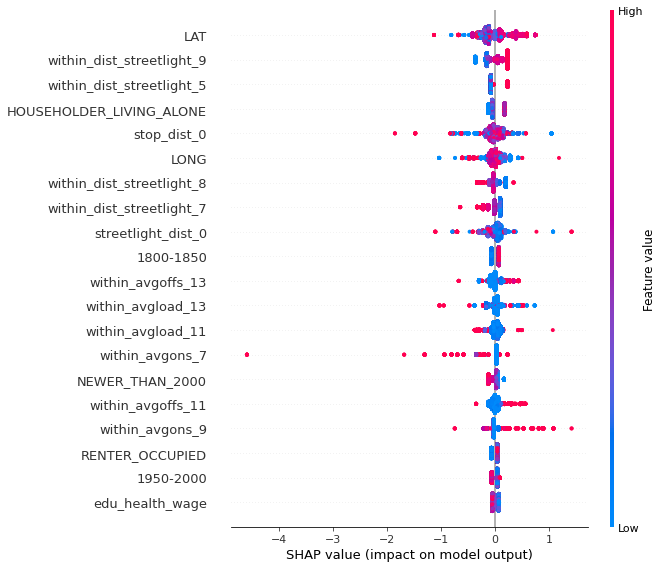

In [ ]:
import shap

feature_names = pro_x_tr.columns.tolist()
pro_x=pd.DataFrame(pro_x_test_scaled,columns=feature_names)

pro_orig_x=pd.DataFrame(pro_x_test,columns=feature_names)
shap_values = shap.TreeExplainer(pro_final).shap_values(pro_x)
shap.summary_plot(shap_values, pro_x, max_display=20,feature_names =feature_names )

invalid value encountered in true_divide
invalid value encountered in true_divide


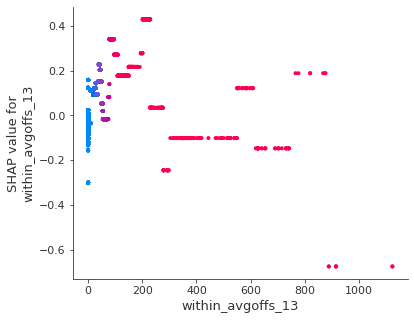

In [ ]:
 
 shap.dependence_plot("within_avgoffs_13", shap_values, pro_orig_x)

invalid value encountered in true_divide
invalid value encountered in true_divide


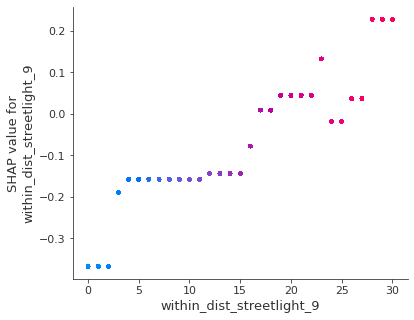

In [ ]:
 
 shap.dependence_plot("within_dist_streetlight_9", shap_values, pro_orig_x)

invalid value encountered in true_divide
invalid value encountered in true_divide


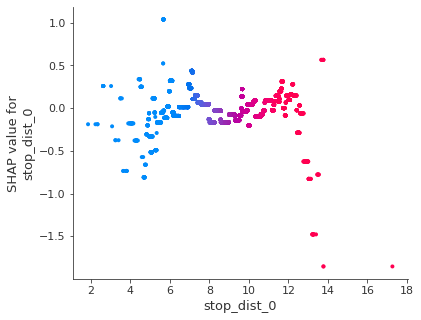

In [ ]:
 
 shap.dependence_plot("stop_dist_0", shap_values, pro_orig_x)

invalid value encountered in true_divide
invalid value encountered in true_divide


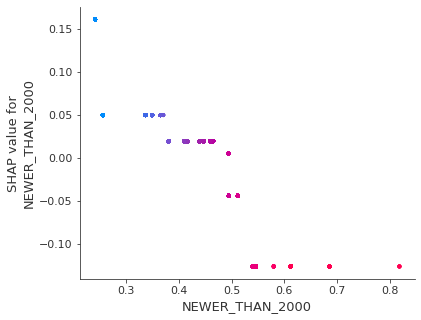

In [ ]:
 
 shap.dependence_plot("NEWER_THAN_2000", shap_values, pro_orig_x)

invalid value encountered in true_divide
invalid value encountered in true_divide


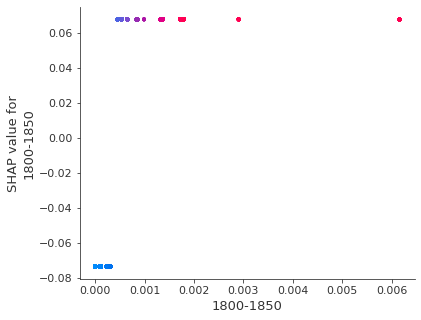

In [ ]:
 
 shap.dependence_plot("1800-1850", shap_values, pro_orig_x)

invalid value encountered in true_divide
invalid value encountered in true_divide


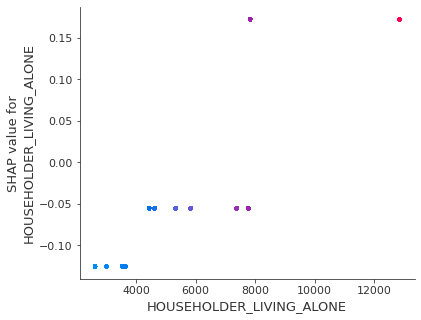

In [ ]:
 
 shap.dependence_plot("HOUSEHOLDER_LIVING_ALONE", shap_values, pro_orig_x)

In [ ]:
shap_values.shape

(13365, 108)

#### Eli 5 Importance

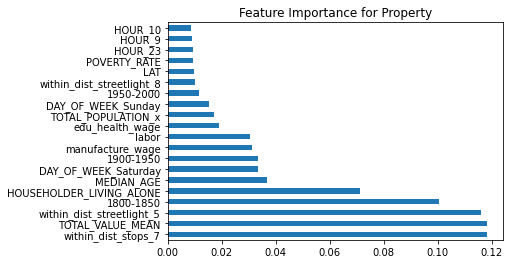

In [ ]:
pro_feat_importances = pd.Series(pro_final.feature_importances_, index=pro_x_tr.columns)
pro_feat_importances.nlargest(20).plot(kind='barh')
plt.title("Feature Importance for Property")
plt.show()

In [ ]:

show_weights(pro_final, importance_type = 'gain',feature_names=pro_x_tr.columns.values)

Weight,Feature
0.1181,within_dist_stops_7
0.1181,TOTAL_VALUE_MEAN
0.1162,within_dist_streetlight_5
0.1004,1800-1850
0.0712,HOUSEHOLDER_LIVING_ALONE
0.0366,MEDIAN_AGE
0.0334,DAY_OF_WEEK_Saturday
0.0333,1900-1950
0.0312,manufacture_wage
0.0305,labor


In [ ]:

show_weights(pro_final, importance_type = 'cover',feature_names=pro_x_tr.columns.values)

Weight,Feature
0.0134,TOTAL_VALUE_MEAN
0.0133,1800-1850
0.0132,MEDIAN_AGE
0.0132,DAY_OF_WEEK_Saturday
0.0132,manufacture_wage
0.0132,1900-1950
0.0132,HOUSEHOLDER_LIVING_ALONE
0.0132,within_dist_stops_7
0.0131,edu_health_wage
0.0131,TOTAL_POPULATION_x


In [ ]:

show_weights(pro_final, importance_type = 'weight',feature_names=pro_x_tr.columns.values)

Weight,Feature
0.1580,LAT
0.1450,stop_dist_0
0.1095,streetlight_dist_0
0.0885,LONG
0.0570,within_avgload_13
0.0490,within_avgoffs_13
0.0400,within_avgons_13
0.0305,within_avgoffs_11
0.0290,within_avgload_11
0.0255,within_avgons_9


#### LIME importance

In [ ]:
cat_feature=['night', 'MONTH_2', 'MONTH_3', 'MONTH_4',
       'MONTH_5', 'MONTH_6', 'MONTH_7', 'MONTH_8', 'MONTH_9', 'MONTH_10',
       'MONTH_11', 'MONTH_12', 'DAY_OF_WEEK_Monday',
       'DAY_OF_WEEK_Saturday', 'DAY_OF_WEEK_Sunday',
       'DAY_OF_WEEK_Thursday', 'DAY_OF_WEEK_Tuesday',
       'DAY_OF_WEEK_Wednesday', 'HOUR_1', 'HOUR_2', 'HOUR_3', 'HOUR_4',
       'HOUR_5', 'HOUR_6', 'HOUR_7', 'HOUR_8', 'HOUR_9', 'HOUR_10',
       'HOUR_11', 'HOUR_12', 'HOUR_13', 'HOUR_14', 'HOUR_15', 'HOUR_16',
       'HOUR_17', 'HOUR_18', 'HOUR_19', 'HOUR_20', 'HOUR_21', 'HOUR_22',
       'HOUR_23', 'YEAR_y']

In [ ]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer( pro_x_test.values,feature_names = pro_x_tr.columns.values,class_names=['non-property','property'],kernel_width=10,categorical_features=cat_feature)

predict_fn = lambda x: pro_final.predict_proba(pro_scaler.transform(x)).astype(float)
exp = explainer.explain_instance(pro_x_test.values[206,:], predict_fn, num_features=10)
exp.show_in_notebook(show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


# 4. Modeling Selection Process (Hyperparameter Tuning: finished before the result interpretation but it is too long so we put it to the very end of the notebook)


## Logistic Regression

### Pre-requisites - load data and required modules

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_validate
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
import sklearn.metrics as metrics
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score, confusion_matrix, recall_score
import statsmodels.api as sm
from matplotlib import pyplot

In [ ]:
crime = pd.read_csv('cleaned_data.csv')

In [ ]:
crime.head()

,SHOOTING,LAT,LONG,totalSnow_cm,FeelsLikeC,humidity,precipMM,windspeedKmph,CRIME_TYPE_OTHER,CRIME_TYPE_PROPERTY,CRIME_TYPE_VIOLENT,TOTAL_POPULATION_x,MEDIAN_AGE,MARRIED-COUPLE_FAMILY,"MALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT","FEMALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT",HOUSEHOLDER_LIVING_ALONE,POPULATION_IN_GROUP_QUARTERS,LESS_THAN_HIGH_SCHOOL_,HIGH_SCHOOL_GRADUATE,GED_OR_ALTERNATIVE_CREDENTIAL,SOME_COLLEGE_,ASSOCIATE'S_DEGREE,BACHELOR'S_DEGREE,_MASTER'S_DEGREE_OR_MORE,OWNER_OCCUPIED,RENTER_OCCUPIED,POVERTY_RATE,night,MONTH_2,MONTH_3,MONTH_4,MONTH_5,MONTH_6,MONTH_7,MONTH_8,MONTH_9,MONTH_10,MONTH_11,MONTH_12,...,within_dist_stops_7,within_dist_stops_9,within_dist_stops_11,within_dist_stops_13,within_dist_streetlight_4,within_dist_streetlight_5,within_dist_streetlight_6,within_dist_streetlight_7,within_dist_streetlight_8,within_dist_streetlight_9,within_avgload_7,within_avgload_9,within_avgload_11,within_avgload_13,within_avgons_7,within_avgons_9,within_avgons_11,within_avgons_13,within_avgoffs_7,within_avgoffs_9,within_avgoffs_11,within_avgoffs_13,labor,manufacture_wage,trade_transportation_utilities_wage,info_wage,finance_wage,edu_health_wage,leisure_hospitality_wage,govern_wage,cpiu,OLDER_THAN_1800,1800-1850,1850-1900,1900-1950,1950-2000,NEWER_THAN_2000,TOTAL_VALUE_MEAN,TOTAL_VALUE_SUM,TOTAL_VALUE_STD
0,1,42.292673,-71.123293,0.0,12,69,0.0,11,0,1,0,33526,42.8,6436,525,1566,4433,539,1650,4187,700,3344,1669,6592,7134,8905,5028,0.063143,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,4,13,0,0,0,0,0,0,0.0,0.000,21.245632,23.094517,0.0,0.00000,0.19205,0.337823,0.0,0.00000,0.219231,0.473464,2734632,175.7,392.9,77.1,179.5,551.8,191.3,301.6,284.0065,0.000240,0.000120,0.036006,0.313490,0.269563,0.380581,6.016591e+05,5105679078,1642721.262
1,1,42.281486,-71.077565,0.0,-7,32,0.0,25,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,18,0,0,1,1,2,4,0.0,0.000,0.000000,13.954083,0.0,0.00000,0.00000,0.253542,0.0,0.00000,0.000000,1.183583,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000205,0.000307,0.065554,0.327154,0.257913,0.348868,7.090155e+05,7516272884,4565481.536
2,1,42.337508,-71.054976,0.0,3,73,0.0,18,0,1,0,36772,31.9,4131,475,1882,5837,369,2350,3681,558,2499,1102,12856,6685,6911,9819,0.140839,1,0,0,0,0,0,0,0,0,0,0,1,...,0,2,8,23,0,1,1,2,5,16,0.0,18.665,18.665000,22.117552,0.0,0.23875,0.23875,0.546328,0.0,0.50125,0.501250,0.803646,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000538,0.071774,0.072850,0.242834,0.612003,1.072293e+06,14251842484,5320726.672
3,1,42.297466,-71.082743,0.0,-3,52,0.0,12,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,11,0,0,1,1,2,4,0.0,0.000,0.000000,15.773931,0.0,0.00000,0.00000,0.611889,0.0,0.00000,0.000000,0.589639,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000000,0.055129,0.346405,0.217960,0.380506,6.305542e+05,2613646962,1592332.950
4,1,42.286120,-71.095740,0.5,-5,50,0.0,20,0,1,0,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,12,0,0,0,0,0,3,0.0,0.000,0.000000,19.854688,0.0,0.00000,0.00000,0.542448,0.0,0.00000,0.000000,1.608021,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.001718,0.014973,0.377025,0.350761,0.255523,5.616257e+05,2667722106,1450250.365


### Predict Shooting

In [ ]:
crime_violence = crime.loc[crime['CRIME_TYPE_VIOLENT'] == 1]
crime_violence.head()

,SHOOTING,LAT,LONG,totalSnow_cm,FeelsLikeC,humidity,precipMM,windspeedKmph,CRIME_TYPE_OTHER,CRIME_TYPE_PROPERTY,CRIME_TYPE_VIOLENT,TOTAL_POPULATION_x,MEDIAN_AGE,MARRIED-COUPLE_FAMILY,"MALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT","FEMALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT",HOUSEHOLDER_LIVING_ALONE,POPULATION_IN_GROUP_QUARTERS,LESS_THAN_HIGH_SCHOOL_,HIGH_SCHOOL_GRADUATE,GED_OR_ALTERNATIVE_CREDENTIAL,SOME_COLLEGE_,ASSOCIATE'S_DEGREE,BACHELOR'S_DEGREE,_MASTER'S_DEGREE_OR_MORE,OWNER_OCCUPIED,RENTER_OCCUPIED,POVERTY_RATE,night,MONTH_2,MONTH_3,MONTH_4,MONTH_5,MONTH_6,MONTH_7,MONTH_8,MONTH_9,MONTH_10,MONTH_11,MONTH_12,...,within_dist_stops_7,within_dist_stops_9,within_dist_stops_11,within_dist_stops_13,within_dist_streetlight_4,within_dist_streetlight_5,within_dist_streetlight_6,within_dist_streetlight_7,within_dist_streetlight_8,within_dist_streetlight_9,within_avgload_7,within_avgload_9,within_avgload_11,within_avgload_13,within_avgons_7,within_avgons_9,within_avgons_11,within_avgons_13,within_avgoffs_7,within_avgoffs_9,within_avgoffs_11,within_avgoffs_13,labor,manufacture_wage,trade_transportation_utilities_wage,info_wage,finance_wage,edu_health_wage,leisure_hospitality_wage,govern_wage,cpiu,OLDER_THAN_1800,1800-1850,1850-1900,1900-1950,1950-2000,NEWER_THAN_2000,TOTAL_VALUE_MEAN,TOTAL_VALUE_SUM,TOTAL_VALUE_STD
1,1,42.281486,-71.077565,0.0,-7,32,0.0,25,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,18,0,0,1,1,2,4,0.0,0.000000,0.000000,13.954083,0.0,0.000,0.000000,0.253542,0.0,0.0000,0.000000,1.183583,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000205,0.000307,0.065554,0.327154,0.257913,0.348868,7.090155e+05,7516272884,4565481.536
3,1,42.297466,-71.082743,0.0,-3,52,0.0,12,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,11,0,0,1,1,2,4,0.0,0.000000,0.000000,15.773931,0.0,0.000,0.000000,0.611889,0.0,0.0000,0.000000,0.589639,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000000,0.055129,0.346405,0.217960,0.380506,6.305542e+05,2613646962,1592332.950
5,1,42.333970,-71.086395,0.5,-4,48,0.0,20,0,0,1,54161,32.5,3536,1232,6159,7380,4084,7733,8227,1675,6363,1910,5048,2632,4326,15573,0.316872,1,0,0,0,0,0,0,0,0,0,0,1,...,0,1,4,30,0,2,4,5,13,30,0.0,17.445833,17.353333,242.576565,0.0,0.090,0.067917,53.539207,0.0,0.0775,0.159167,33.478411,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000653,0.050261,0.163838,0.369452,0.415796,1.748675e+06,3098652127,6603268.052
6,1,42.285658,-71.139780,0.0,-2,84,0.0,14,0,0,1,33526,42.8,6436,525,1566,4433,539,1650,4187,700,3344,1669,6592,7134,8905,5028,0.063143,1,0,0,0,0,0,0,0,0,0,0,1,...,0,2,3,17,0,0,0,0,0,4,0.0,11.800250,11.800250,14.478512,0.0,0.079,0.079000,0.109253,0.0,0.4720,0.472000,1.722296,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000240,0.000120,0.036006,0.313490,0.269563,0.380581,6.016591e+05,5105679078,1642721.262
14,1,42.294236,-71.079025,0.0,0,71,0.0,9,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,1,9,0,0,2,2,3,4,0.0,0.000000,23.540000,23.172500,0.0,0.000,0.767500,0.877500,0.0,0.0000,1.655000,1.461250,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000205,0.000307,0.065554,0.327154,0.257913,0.348868,7.090155e+05,7516272884,4565481.536


In [ ]:
remove_cols = ['SHOOTING', 'CRIME_TYPE_VIOLENT']
X = crime_violence.columns.tolist()
X = [c for c in X if c not in remove_cols]

X_violent = crime_violence[X]
y_violent = crime_violence['SHOOTING'].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_violent, y_violent, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

In [ ]:
model = LogisticRegression(class_weight = 'balanced')
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=2021)
# define search space

#### Hyperparameter Tuning

In [ ]:
space = dict()
space['penalty'] = ['l2']
space['C'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]
search = GridSearchCV(model, space, scoring='roc_auc', n_jobs=-1, cv=cv)
result = search.fit(X_train, y_train)
print('Best ROC_AUC: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best ROC_AUC: 0.7863461853688266
Best Hyperparameters: {'C': 0.001, 'penalty': 'l2'}


In [ ]:
logreg = LogisticRegression(C = 0.001, penalty = 'l2',max_iter = 10000, class_weight = 'balanced')
logreg.fit(X_train,y_train)
print(logreg.score(X_test,y_test))

0.7350498338870431


In [ ]:
print("Training set score: {:.3f}".format(logreg.score(X_train,y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_test,y_test)))
y_pred = logreg.predict(X_test)
print('F1 weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
y_test_pred = logreg.predict_proba(X_test)
roc_auc_score_test = roc_auc_score(y_test,y_test_pred[:,1])
print('ROC_AUC_SCORE: %.3f' % roc_auc_score_test)
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

Training set score: 0.738
Test set score: 0.735
F1 weighted Score: 0.804
F1 raw Score: 0.242
Accuracy: 0.735
ROC_AUC_SCORE: 0.788
Confusion Matrix: [[834 298]
 [ 21  51]]
Recall Score: 0.7083333333333334


Feature: 0, Score: -0.11759
Feature: 1, Score: -0.00925
Feature: 2, Score: -0.02637
Feature: 3, Score: 0.01743
Feature: 4, Score: 0.00192
Feature: 5, Score: 0.02329
Feature: 6, Score: -0.07441
Feature: 7, Score: 0.00000
Feature: 8, Score: 0.00000
Feature: 9, Score: -0.00811
Feature: 10, Score: 0.02595
Feature: 11, Score: -0.06455
Feature: 12, Score: 0.01734
Feature: 13, Score: 0.07081
Feature: 14, Score: -0.06374
Feature: 15, Score: 0.02557
Feature: 16, Score: 0.00790
Feature: 17, Score: 0.02237
Feature: 18, Score: 0.04598
Feature: 19, Score: 0.05181
Feature: 20, Score: 0.00889
Feature: 21, Score: -0.13718
Feature: 22, Score: -0.08847
Feature: 23, Score: -0.03375
Feature: 24, Score: -0.03648
Feature: 25, Score: 0.10310
Feature: 26, Score: 0.17206
Feature: 27, Score: -0.01154
Feature: 28, Score: 0.00011
Feature: 29, Score: -0.00604
Feature: 30, Score: 0.02241
Feature: 31, Score: 0.04335
Feature: 32, Score: 0.01511
Feature: 33, Score: -0.00163
Feature: 34, Score: 0.01146
Feature: 35, Sco

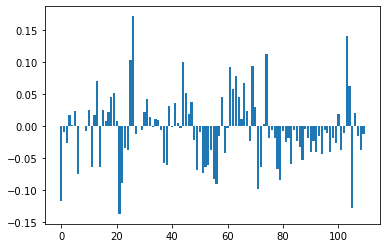

In [ ]:
importance = logreg.coef_[0]
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [ ]:
print(logreg.coef_)

[[-1.17590776e-01 -9.25042565e-03 -2.63725390e-02  1.74340141e-02
   1.91934742e-03  2.32901208e-02 -7.44122423e-02  0.00000000e+00
   0.00000000e+00 -8.11048333e-03  2.59495810e-02 -6.45542975e-02
   1.73420212e-02  7.08098088e-02 -6.37395701e-02  2.55666401e-02
   7.90486402e-03  2.23667601e-02  4.59836383e-02  5.18067838e-02
   8.88852233e-03 -1.37184353e-01 -8.84715723e-02 -3.37490878e-02
  -3.64779015e-02  1.03095736e-01  1.72062169e-01 -1.15350486e-02
   1.11008746e-04 -6.03913243e-03  2.24100555e-02  4.33472423e-02
   1.51134817e-02 -1.62996766e-03  1.14584170e-02  9.64167655e-03
  -5.23169365e-03 -5.77846013e-02 -6.13839301e-02  3.18296296e-02
  -7.73014954e-04  3.64958395e-02  4.85655901e-03 -3.23188072e-03
   1.00629563e-01  5.20875164e-02  1.98904775e-02  3.86176176e-02
  -2.09442843e-02 -6.89284207e-02 -8.66724595e-03 -7.24575429e-02
  -6.36717579e-02 -6.07226148e-02 -3.75137971e-02 -8.18596979e-02
  -9.07193455e-02 -1.60493648e-02  4.53690160e-02 -4.26297931e-02
  -3.51933

### Predict Violence

In [ ]:
remove_cols = ['CRIME_TYPE_OTHER', 'CRIME_TYPE_PROPERTY', 'CRIME_TYPE_VIOLENT']
X = crime.columns.tolist()
X = [c for c in X if c not in remove_cols]

X = crime[X]
y_2 = crime['CRIME_TYPE_VIOLENT'].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y_2, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

#### Hyperparameter Tuning

In [ ]:
model = LogisticRegression(class_weight = 'balanced')
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=2021)
space = dict()
space['penalty'] = ['l2']
space['C'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]
search = GridSearchCV(model, space, scoring='roc_auc', n_jobs=-1, cv=cv)
result = search.fit(X_train, y_train)
print('Best ROC_AUC: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best ROC_AUC: 0.5803126399516897
Best Hyperparameters: {'C': 0.0001, 'penalty': 'l2'}


In [ ]:
logreg_2 = LogisticRegression(C = 0.0001, penalty = 'l2',max_iter = 10000, class_weight = 'balanced')
logreg_2.fit(X_train,y_train)
print(logreg_2.score(X_test,y_test))

0.6278338945005612


In [ ]:
print("Training set score: {:.3f}".format(logreg_2.score(X_train,y_train)))
print("Test set score: {:.3f}".format(logreg_2.score(X_test,y_test)))
y_pred = logreg_2.predict(X_test)
print('F1 weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
y_test_pred = logreg_2.predict_proba(X_test)
roc_auc_score_test = roc_auc_score(y_test,y_test_pred[:,1])
print('ROC_AUC_SCORE: %.3f' % roc_auc_score_test)
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

Training set score: 0.631
Test set score: 0.628
F1 weighted Score: 0.708
F1 raw Score: 0.178
Accuracy: 0.628
ROC_AUC_SCORE: 0.573
Confusion Matrix: [[7853 4319]
 [ 655  538]]
Recall Score: 0.4509639564124057


In [ ]:
X_train_with_constant = sm.add_constant(X_train)
X_val_with_constant = sm.add_constant(X_test)

logreg = sm.Logit(y_train, X_train_with_constant).fit()
print(logreg.summary())

         Current function value: 0.294324
         Iterations: 35


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                53457
Model:                          Logit   Df Residuals:                    53353
Method:                           MLE   Df Model:                          103
Date:                Wed, 08 Dec 2021   Pseudo R-squ.:                 0.02880
Time:                        01:00:14   Log-Likelihood:                -15734.
converged:                      False   LL-Null:                       -16200.
Covariance Type:            nonrobust   LLR p-value:                7.562e-134
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.3756      0.016   -149.481      0.000      -2.407      -2.344
0              0.2050      0.009     22.376      0.000       0.187       0.223
1              0.1026      0.061      1.673      0.0

### Predict Property

In [ ]:
remove_cols = ['CRIME_TYPE_OTHER', 'CRIME_TYPE_PROPERTY', 'CRIME_TYPE_VIOLENT']
X = crime.columns.tolist()
X = [c for c in X if c not in remove_cols]

X = crime[X]
y_3 = crime['CRIME_TYPE_PROPERTY'].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y_3, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

#### Hyperparameter Tuning

In [ ]:
model = LogisticRegression(class_weight = 'balanced', max_iter = 10000)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=2021)
space = dict()
space['penalty'] = ['l2']
space['C'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]
search = GridSearchCV(model, space, scoring='roc_auc', n_jobs=-1, cv=cv)
result = search.fit(X_train, y_train)
print('Best ROC_AUC: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best ROC_AUC: 0.6210655697167982
Best Hyperparameters: {'C': 100, 'penalty': 'l2'}


In [ ]:
logreg_3 = LogisticRegression(C = 100, penalty = 'l2',max_iter = 10000, class_weight = 'balanced', random_state = 2021)
logreg_3.fit(X_train,y_train)
print(logreg_2.score(X_test,y_test))

0.5508417508417508


In [ ]:
print("Training set score: {:.3f}".format(logreg_3.score(X_train,y_train)))
print("Test set score: {:.3f}".format(logreg_3.score(X_test,y_test)))
y_pred = logreg_3.predict(X_test)
print('F1 weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
y_test_pred = logreg_3.predict_proba(X_test)
roc_auc_score_test = roc_auc_score(y_test,y_test_pred[:,1])
print('ROC_AUC_SCORE: %.3f' % roc_auc_score_test)
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

Training set score: 0.599
Test set score: 0.596
F1 weighted Score: 0.608
F1 raw Score: 0.459
Accuracy: 0.596
ROC_AUC_SCORE: 0.620
Confusion Matrix: [[5663 3486]
 [1920 2296]]
Recall Score: 0.5445920303605313


In [ ]:
X_train_with_constant = sm.add_constant(X_train)
X_val_with_constant = sm.add_constant(X_test)

logreg = sm.Logit(y_train, X_train_with_constant).fit()
print(logreg.summary())

         Current function value: 0.599766
         Iterations: 35


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                53457
Model:                          Logit   Df Residuals:                    53353
Method:                           MLE   Df Model:                          103
Date:                Wed, 08 Dec 2021   Pseudo R-squ.:                 0.03821
Time:                        01:20:27   Log-Likelihood:                -32062.
converged:                      False   LL-Null:                       -33336.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.8123      0.010    -84.043      0.000      -0.831      -0.793
0              0.1014      0.009     11.328      0.000       0.084       0.119
1              0.0473      0.039      1.209      0.2

###  Predict Other

In [ ]:
remove_cols = ['CRIME_TYPE_OTHER', 'CRIME_TYPE_PROPERTY', 'CRIME_TYPE_VIOLENT']
X = crime.columns.tolist()
X = [c for c in X if c not in remove_cols]

X = crime[X]
y_4 = crime['CRIME_TYPE_OTHER'].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y_4, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

#### Hyperparameter Tuning

In [ ]:
model = LogisticRegression(class_weight = 'balanced', max_iter = 10000, random_state = 2021)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=2021)
space = dict()
space['penalty'] = ['l2']
space['C'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]
search = GridSearchCV(model, space, scoring='roc_auc', n_jobs=-1, cv=cv)
result = search.fit(X_train, y_train)
print('Best ROC_AUC: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best ROC_AUC: 0.6159871729231206
Best Hyperparameters: {'C': 100, 'penalty': 'l2'}


In [ ]:
logreg_4 = LogisticRegression(C = 100, penalty = 'l2',max_iter = 10000, class_weight = 'balanced', random_state = 2021)
logreg_4.fit(X_train,y_train)
print(logreg_2.score(X_test,y_test))

0.45791245791245794


In [ ]:
print("Training set score: {:.3f}".format(logreg_4.score(X_train,y_train)))
print("Test set score: {:.3f}".format(logreg_4.score(X_test,y_test)))
y_pred = logreg_4.predict(X_test)
print('F1 weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
y_test_pred = logreg_4.predict_proba(X_test)
roc_auc_score_test = roc_auc_score(y_test,y_test_pred[:,1])
print('ROC_AUC_SCORE: %.3f' % roc_auc_score_test)
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

Training set score: 0.594
Test set score: 0.589
F1 weighted Score: 0.590
F1 raw Score: 0.650
Accuracy: 0.589
ROC_AUC_SCORE: 0.614
Confusion Matrix: [[2771 2638]
 [2855 5101]]
Recall Score: 0.641151332327803


In [ ]:
X_train_with_constant = sm.add_constant(X_train)
X_val_with_constant = sm.add_constant(X_test)

logreg = sm.Logit(y_train, X_train_with_constant).fit()
print(logreg.summary())

         Current function value: 0.647576
         Iterations: 35


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                53457
Model:                          Logit   Df Residuals:                    53353
Method:                           MLE   Df Model:                          103
Date:                Wed, 08 Dec 2021   Pseudo R-squ.:                 0.04112
Time:                        02:13:59   Log-Likelihood:                -34617.
converged:                      False   LL-Null:                       -36102.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3880      0.009     42.439      0.000       0.370       0.406
0             -0.3109      0.015    -20.365      0.000      -0.341      -0.281
1             -0.0792      0.036     -2.172      0.0

## Random Forest

### Pre-requisites - load data and required modules

In [ ]:
!pip install shap

     |████████████████████████████████| 564 kB 34.1 MB/s 


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_validate
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
import sklearn.metrics as metrics
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score, confusion_matrix, recall_score
import statsmodels.api as sm
from sklearn.inspection import permutation_importance
import shap

In [ ]:
from google.colab import drive
drive.mount("/content/drive")
%cd /content/drive/Shareddrives/AC209a

Mounted at /content/drive
/content/drive/Shareddrives/AC209a


In [ ]:
crime = pd.read_csv('cleaned_data.csv')

### Predict Shooting

In [ ]:
crime_violence = crime.loc[crime['CRIME_TYPE_VIOLENT'] == 1]
crime_violence.head()

,SHOOTING,LAT,LONG,totalSnow_cm,FeelsLikeC,humidity,precipMM,windspeedKmph,CRIME_TYPE_OTHER,CRIME_TYPE_PROPERTY,CRIME_TYPE_VIOLENT,TOTAL_POPULATION_x,MEDIAN_AGE,MARRIED-COUPLE_FAMILY,"MALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT","FEMALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT",HOUSEHOLDER_LIVING_ALONE,POPULATION_IN_GROUP_QUARTERS,LESS_THAN_HIGH_SCHOOL_,HIGH_SCHOOL_GRADUATE,GED_OR_ALTERNATIVE_CREDENTIAL,SOME_COLLEGE_,ASSOCIATE'S_DEGREE,BACHELOR'S_DEGREE,_MASTER'S_DEGREE_OR_MORE,OWNER_OCCUPIED,RENTER_OCCUPIED,POVERTY_RATE,night,MONTH_2,MONTH_3,MONTH_4,MONTH_5,MONTH_6,MONTH_7,MONTH_8,MONTH_9,MONTH_10,MONTH_11,MONTH_12,...,within_dist_stops_7,within_dist_stops_9,within_dist_stops_11,within_dist_stops_13,within_dist_streetlight_4,within_dist_streetlight_5,within_dist_streetlight_6,within_dist_streetlight_7,within_dist_streetlight_8,within_dist_streetlight_9,within_avgload_7,within_avgload_9,within_avgload_11,within_avgload_13,within_avgons_7,within_avgons_9,within_avgons_11,within_avgons_13,within_avgoffs_7,within_avgoffs_9,within_avgoffs_11,within_avgoffs_13,labor,manufacture_wage,trade_transportation_utilities_wage,info_wage,finance_wage,edu_health_wage,leisure_hospitality_wage,govern_wage,cpiu,OLDER_THAN_1800,1800-1850,1850-1900,1900-1950,1950-2000,NEWER_THAN_2000,TOTAL_VALUE_MEAN,TOTAL_VALUE_SUM,TOTAL_VALUE_STD
1,1,42.281486,-71.077565,0.0,-7,32,0.0,25,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,18,0,0,1,1,2,4,0.0,0.000000,0.000000,13.954083,0.0,0.000,0.000000,0.253542,0.0,0.0000,0.000000,1.183583,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000205,0.000307,0.065554,0.327154,0.257913,0.348868,7.090155e+05,7516272884,4565481.536
3,1,42.297466,-71.082743,0.0,-3,52,0.0,12,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,11,0,0,1,1,2,4,0.0,0.000000,0.000000,15.773931,0.0,0.000,0.000000,0.611889,0.0,0.0000,0.000000,0.589639,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000000,0.055129,0.346405,0.217960,0.380506,6.305542e+05,2613646962,1592332.950
5,1,42.333970,-71.086395,0.5,-4,48,0.0,20,0,0,1,54161,32.5,3536,1232,6159,7380,4084,7733,8227,1675,6363,1910,5048,2632,4326,15573,0.316872,1,0,0,0,0,0,0,0,0,0,0,1,...,0,1,4,30,0,2,4,5,13,30,0.0,17.445833,17.353333,242.576565,0.0,0.090,0.067917,53.539207,0.0,0.0775,0.159167,33.478411,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000653,0.050261,0.163838,0.369452,0.415796,1.748675e+06,3098652127,6603268.052
6,1,42.285658,-71.139780,0.0,-2,84,0.0,14,0,0,1,33526,42.8,6436,525,1566,4433,539,1650,4187,700,3344,1669,6592,7134,8905,5028,0.063143,1,0,0,0,0,0,0,0,0,0,0,1,...,0,2,3,17,0,0,0,0,0,4,0.0,11.800250,11.800250,14.478512,0.0,0.079,0.079000,0.109253,0.0,0.4720,0.472000,1.722296,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000240,0.000120,0.036006,0.313490,0.269563,0.380581,6.016591e+05,5105679078,1642721.262
14,1,42.294236,-71.079025,0.0,0,71,0.0,9,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,1,9,0,0,2,2,3,4,0.0,0.000000,23.540000,23.172500,0.0,0.000,0.767500,0.877500,0.0,0.0000,1.655000,1.461250,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000205,0.000307,0.065554,0.327154,0.257913,0.348868,7.090155e+05,7516272884,4565481.536


In [ ]:
remove_cols = ['SHOOTING', 'CRIME_TYPE_VIOLENT', 'CRIME_TYPE_OTHER', 'CRIME_TYPE_PROPERTY']
X = crime_violence.columns.tolist()
X = [c for c in X if c not in remove_cols]

X_violent = crime_violence[X]
y_violent = crime_violence['SHOOTING'].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_violent, y_violent, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

#### Hyperparameter Tuning

In [ ]:
param_grid = {
    'max_depth': [2, 4, 6],
    'min_samples_leaf': [6, 7, 8],
    'min_samples_split': [2, 3, 4],
    'n_estimators': [200, 300, 400]
}
# Create a based model
rf = RandomForestClassifier(n_jobs=-1,max_features = 'sqrt',random_state=2021, class_weight = "balanced")
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, scoring='roc_auc',
                          cv = 3, n_jobs = -1)

In [ ]:
results = grid_search.fit(X_train, y_train)
print(results.best_estimator_.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 6, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 7, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 300, 'n_jobs': -1, 'oob_score': False, 'random_state': 2021, 'verbose': 0, 'warm_start': False}


In [ ]:
best_rf = results.best_estimator_
y_proba = best_rf.predict_proba(X_test)[:, 1]
y_pred = best_rf.predict(X_test)
auc = np.round(roc_auc_score(y_test, y_proba),2)
print(f'GridSearchCV RF AUC on test set:{auc}')
print('F1 Weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 Raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

GridSearchCV RF AUC on test set:0.8
F1 Weighted Score: 0.850
F1 Raw Score: 0.280
Accuracy: 0.803
Confusion Matrix: [[921 211]
 [ 26  46]]
Recall Score: 0.6388888888888888


Text(0.5, 1.0, 'Feature Importance of Shooting versus all other crimes in random forest model')

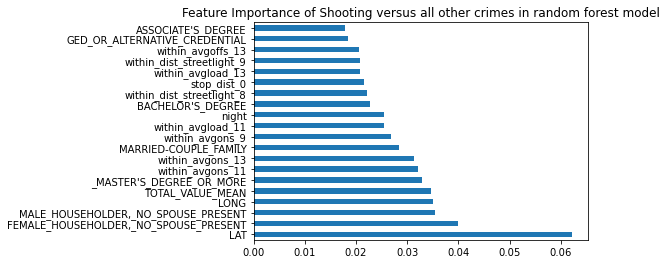

In [ ]:
importances = pd.Series(best_rf.feature_importances_, index = X_violent.columns)
importances.nlargest(20).plot(kind = 'barh')
plt.title("Feature Importance of Shooting versus all other crimes in random forest model")

### Predict Violence

In [ ]:
remove_cols = ['CRIME_TYPE_OTHER', 'CRIME_TYPE_PROPERTY', 'CRIME_TYPE_VIOLENT', 'SHOOTING']
X = crime.columns.tolist()
X = [c for c in X if c not in remove_cols]

X = crime[X]
y_2 = crime['CRIME_TYPE_VIOLENT'].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y_2, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

#### Hyperparameter Tuning

In [ ]:
param_grid = {
    'max_depth': [5, 10, 15],
    'min_samples_leaf': [3, 4],
    'min_samples_split': [8, 10],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier(n_jobs=-1,max_features = 'sqrt',random_state=2021, class_weight = "balanced")
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, scoring='roc_auc',
                          cv = 3, n_jobs = -1)

results = grid_search.fit(X_train, y_train)
print(results.best_estimator_.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 4, 'min_samples_split': 8, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 200, 'n_jobs': -1, 'oob_score': False, 'random_state': 2021, 'verbose': 0, 'warm_start': False}


In [ ]:
best_rf = results.best_estimator_
y_proba = best_rf.predict_proba(X_test)[:, 1]
y_pred = best_rf.predict(X_test)
auc = np.round(roc_auc_score(y_test, y_proba),2)
print(f'GridSearchCV RF AUC on test set:{auc}')
print('F1 Weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 Raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

GridSearchCV RF AUC on test set:0.6
F1 Weighted Score: 0.801
F1 Raw Score: 0.187
Accuracy: 0.764
Confusion Matrix: [[9841 2331]
 [ 829  364]]
Recall Score: 0.30511316010058676


### Predict Property

In [ ]:
remove_cols = ['CRIME_TYPE_OTHER', 'CRIME_TYPE_PROPERTY', 'CRIME_TYPE_VIOLENT', 'SHOOTING']
X = crime.columns.tolist()
X = [c for c in X if c not in remove_cols]

X = crime[X]
y_3 = crime['CRIME_TYPE_PROPERTY'].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y_3, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

#### Hyperparameter Tuning

In [ ]:
param_grid = {
    'max_depth': [5, 10, 15],
    'min_samples_leaf': [3, 4],
    'min_samples_split': [6, 8],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier(n_jobs=-1,max_features = 'sqrt',random_state=2021, class_weight = "balanced")
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, scoring='roc_auc', 
                          cv = 3, n_jobs = -1)

results = grid_search.fit(X_train, y_train)
print(results.best_estimator_.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 15, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 4, 'min_samples_split': 6, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 200, 'n_jobs': -1, 'oob_score': False, 'random_state': 2021, 'verbose': 0, 'warm_start': False}


In [ ]:
best_rf = results.best_estimator_
y_proba = best_rf.predict_proba(X_test)[:, 1]
y_pred = best_rf.predict(X_test)
auc = np.round(roc_auc_score(y_test, y_proba),2)
print(f'GridSearchCV RF AUC on test set:{auc}')
print('F1 Weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 Raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

GridSearchCV RF AUC on test set:0.66
F1 Weighted Score: 0.669
F1 Raw Score: 0.474
Accuracy: 0.669
Confusion Matrix: [[6945 2204]
 [2222 1994]]
Recall Score: 0.47296015180265655


### Predict Other

In [ ]:
remove_cols = ['CRIME_TYPE_OTHER', 'CRIME_TYPE_PROPERTY', 'CRIME_TYPE_VIOLENT', 'SHOOTING']
X = crime.columns.tolist()
X = [c for c in X if c not in remove_cols]

X = crime[X]
y_4 = crime['CRIME_TYPE_OTHER'].values

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(X, y_4, test_size = 0.20, random_state = 2021)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

#### Hyperparameter Tuning

In [ ]:
param_grid = {
    
    'min_samples_split': [6, 8],
    'min_samples_leaf': [40, 50, 60],
    'n_estimators': [50,100, 200,500,1000]
}
# Create a based model
rf = RandomForestClassifier(n_jobs=-1,max_features = 'sqrt',random_state=2021, class_weight = "balanced")
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, scoring='roc_auc', verbose=10,
                          cv = 3, n_jobs = -1)

results = grid_search.fit(X_train, y_train)
print(results.best_estimator_.get_params())

Fitting 3 folds for each of 30 candidates, totalling 90 fits
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 40, 'min_samples_split': 6, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 1000, 'n_jobs': -1, 'oob_score': False, 'random_state': 2021, 'verbose': 0, 'warm_start': False}


In [ ]:
best_rf = results.best_estimator_
y_proba = best_rf.predict_proba(X_test)[:, 1]
y_pred = best_rf.predict(X_test)
auc = np.round(roc_auc_score(y_test, y_proba),2)
print(f'GridSearchCV RF AUC on test set:{auc}')
print('F1 Weighted Score: %.3f' % f1_score(y_test, y_pred, average='weighted'))
print('F1 Raw Score: %.3f' % f1_score(y_test, y_pred))
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
print('Recall Score:', recall_score(y_test, y_pred))

GridSearchCV RF AUC on test set:0.63
F1 Weighted Score: 0.608
F1 Raw Score: 0.685
Accuracy: 0.612
Confusion Matrix: [[2545 2864]
 [2321 5635]]
Recall Score: 0.7082704876822524


In [ ]:
res

{'mean_fit_time': array([  5.55780451,  10.5693841 ,  21.6178054 ,  53.98133246,
        107.5707713 ,   5.60407726,  11.38783932,  21.65637946,
         54.12294515, 107.19330112,   5.38136077,  10.57998578,
         20.43104911,  51.61792644, 104.86078437,   5.44297997,
         10.60879072,  20.66514198,  52.30876184, 104.70912115,
          5.33910863,  10.60725005,  19.99356349,  50.78256996,
        102.07420603,   5.28077666,  10.55578232,  20.42540661,
         51.41439041,  92.20478439]),
 'mean_score_time': array([0.37271063, 0.66561524, 1.15307291, 2.74888428, 4.60048707,
        0.42659815, 0.62161597, 1.09059644, 2.566468  , 4.87641112,
        0.35581803, 0.6216929 , 1.02649689, 2.44663914, 5.36447477,
        0.35660871, 0.55377563, 1.13194776, 2.36284717, 4.90375185,
        0.35166701, 0.61719823, 1.05910118, 2.50492422, 5.14345749,
        0.35586023, 0.62184827, 1.19724449, 2.70309528, 4.2426854 ]),
 'mean_test_score': array([0.63413735, 0.63556377, 0.63642297, 0.637

In [ ]:
import pickle
with open('res.pickle', 'wb') as handle:
    pickle.dump(res, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('res.pickle', 'rb') as handle:
    b = pickle.load(handle)

b

{'mean_fit_time': array([  5.55780451,  10.5693841 ,  21.6178054 ,  53.98133246,
        107.5707713 ,   5.60407726,  11.38783932,  21.65637946,
         54.12294515, 107.19330112,   5.38136077,  10.57998578,
         20.43104911,  51.61792644, 104.86078437,   5.44297997,
         10.60879072,  20.66514198,  52.30876184, 104.70912115,
          5.33910863,  10.60725005,  19.99356349,  50.78256996,
        102.07420603,   5.28077666,  10.55578232,  20.42540661,
         51.41439041,  92.20478439]),
 'mean_score_time': array([0.37271063, 0.66561524, 1.15307291, 2.74888428, 4.60048707,
        0.42659815, 0.62161597, 1.09059644, 2.566468  , 4.87641112,
        0.35581803, 0.6216929 , 1.02649689, 2.44663914, 5.36447477,
        0.35660871, 0.55377563, 1.13194776, 2.36284717, 4.90375185,
        0.35166701, 0.61719823, 1.05910118, 2.50492422, 5.14345749,
        0.35586023, 0.62184827, 1.19724449, 2.70309528, 4.2426854 ]),
 'mean_test_score': array([0.63413735, 0.63556377, 0.63642297, 0.637

## XGBoost

In [ ]:
df = pd.read_csv("cleaned_data.csv")
df.head()

,SHOOTING,LAT,LONG,totalSnow_cm,FeelsLikeC,humidity,precipMM,windspeedKmph,CRIME_TYPE_OTHER,CRIME_TYPE_PROPERTY,CRIME_TYPE_VIOLENT,TOTAL_POPULATION_x,MEDIAN_AGE,MARRIED-COUPLE_FAMILY,"MALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT","FEMALE_HOUSEHOLDER,_NO_SPOUSE_PRESENT",HOUSEHOLDER_LIVING_ALONE,POPULATION_IN_GROUP_QUARTERS,LESS_THAN_HIGH_SCHOOL_,HIGH_SCHOOL_GRADUATE,GED_OR_ALTERNATIVE_CREDENTIAL,SOME_COLLEGE_,ASSOCIATE'S_DEGREE,BACHELOR'S_DEGREE,_MASTER'S_DEGREE_OR_MORE,OWNER_OCCUPIED,RENTER_OCCUPIED,POVERTY_RATE,night,MONTH_2,MONTH_3,MONTH_4,MONTH_5,MONTH_6,MONTH_7,MONTH_8,MONTH_9,MONTH_10,MONTH_11,MONTH_12,...,within_dist_stops_7,within_dist_stops_9,within_dist_stops_11,within_dist_stops_13,within_dist_streetlight_4,within_dist_streetlight_5,within_dist_streetlight_6,within_dist_streetlight_7,within_dist_streetlight_8,within_dist_streetlight_9,within_avgload_7,within_avgload_9,within_avgload_11,within_avgload_13,within_avgons_7,within_avgons_9,within_avgons_11,within_avgons_13,within_avgoffs_7,within_avgoffs_9,within_avgoffs_11,within_avgoffs_13,labor,manufacture_wage,trade_transportation_utilities_wage,info_wage,finance_wage,edu_health_wage,leisure_hospitality_wage,govern_wage,cpiu,OLDER_THAN_1800,1800-1850,1850-1900,1900-1950,1950-2000,NEWER_THAN_2000,TOTAL_VALUE_MEAN,TOTAL_VALUE_SUM,TOTAL_VALUE_STD
0,1,42.292673,-71.123293,0.0,12,69,0.0,11,0,1,0,33526,42.8,6436,525,1566,4433,539,1650,4187,700,3344,1669,6592,7134,8905,5028,0.063143,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,4,13,0,0,0,0,0,0,0.0,0.000,21.245632,23.094517,0.0,0.00000,0.19205,0.337823,0.0,0.00000,0.219231,0.473464,2734632,175.7,392.9,77.1,179.5,551.8,191.3,301.6,284.0065,0.000240,0.000120,0.036006,0.313490,0.269563,0.380581,6.016591e+05,5105679078,1642721.262
1,1,42.281486,-71.077565,0.0,-7,32,0.0,25,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,18,0,0,1,1,2,4,0.0,0.000,0.000000,13.954083,0.0,0.00000,0.00000,0.253542,0.0,0.00000,0.000000,1.183583,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000205,0.000307,0.065554,0.327154,0.257913,0.348868,7.090155e+05,7516272884,4565481.536
2,1,42.337508,-71.054976,0.0,3,73,0.0,18,0,1,0,36772,31.9,4131,475,1882,5837,369,2350,3681,558,2499,1102,12856,6685,6911,9819,0.140839,1,0,0,0,0,0,0,0,0,0,0,1,...,0,2,8,23,0,1,1,2,5,16,0.0,18.665,18.665000,22.117552,0.0,0.23875,0.23875,0.546328,0.0,0.50125,0.501250,0.803646,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000538,0.071774,0.072850,0.242834,0.612003,1.072293e+06,14251842484,5320726.672
3,1,42.297466,-71.082743,0.0,-3,52,0.0,12,0,0,1,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,11,0,0,1,1,2,4,0.0,0.000,0.000000,15.773931,0.0,0.00000,0.00000,0.611889,0.0,0.00000,0.000000,0.589639,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.000000,0.055129,0.346405,0.217960,0.380506,6.305542e+05,2613646962,1592332.950
4,1,42.286120,-71.095740,0.5,-5,50,0.0,20,0,1,0,26659,36.7,2730,692,2873,2614,373,2632,5323,897,4147,1392,2109,1595,3522,5651,0.201043,1,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,12,0,0,0,0,0,3,0.0,0.000,0.000000,19.854688,0.0,0.00000,0.00000,0.542448,0.0,0.00000,0.000000,1.608021,2745196,177.1,408.6,76.8,179.9,548.0,175.3,299.8,285.6185,0.000000,0.001718,0.014973,0.377025,0.350761,0.255523,5.616257e+05,2667722106,1450250.365


### Train test split
Split the data with random state 2021 and test size 20%. We have four target values: shooting, crime_type_violent, crime_type_property, and crime_type_other.
1. Shooting is a type of violence crime. This target value is to predict  shooting vs other violence crime.

2. predict violent vs non violent crime (property crime or other crime)

3. predict property vs non property crime (violent crime or other crime)

4. predict other vs non other crime (violent crime or property crime)

In [ ]:
target_values = ['SHOOTING','CRIME_TYPE_VIOLENT','CRIME_TYPE_PROPERTY','CRIME_TYPE_OTHER']

In [ ]:
# Because shooting is a type of violence crime, we want to first filter out violence crime to 
shoot_x_tr, shoot_x_test, shoot_y_tr, shoot_y_test = train_test_split(df[df.CRIME_TYPE_VIOLENT==1].drop(columns = target_values),
                                                                      df[df.CRIME_TYPE_VIOLENT==1].SHOOTING,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
vio_x_tr, vio_x_test, vio_y_tr, vio_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_VIOLENT,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
pro_x_tr, pro_x_test, pro_y_tr, pro_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_PROPERTY,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
other_x_tr, other_x_test, other_y_tr, other_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_OTHER,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
shooting_scale_pos_weight = np.sum(shoot_y_tr==0)/np.sum(shoot_y_tr==1)
print(shooting_scale_pos_weight)

18.0197628458498


In [ ]:
vio_scale_pos_weight = np.sum(vio_y_tr==0)/np.sum(vio_y_tr==1)
print(vio_scale_pos_weight)

10.083765291312462


In [ ]:
pro_scale_pos_weight = np.sum(pro_y_tr==0)/np.sum(pro_y_tr==1)
print(pro_scale_pos_weight)

2.167446821117497


In [ ]:
other_scale_pos_weight = np.sum(other_y_tr==0)/np.sum(other_y_tr==1)
print(other_scale_pos_weight)

0.6833139150423528


### Predict Shooting

In [ ]:
shooting_scaler = StandardScaler()
shooting_scaler.fit(shoot_x_tr)
shooting_x_tr_scaled = shooting_scaler.transform(shoot_x_tr)
shooting_x_test_scaled = shooting_scaler.transform(shoot_x_test)

#### Hyperparamter Tuning

In [ ]:
shooting_m1 = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = shooting_scale_pos_weight,
                                    
                                    random_state = 2021)
parameters = {
    'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01]
}
shooting_clf1 = GridSearchCV(shooting_m1, parameters,scoring = 'roc_auc',
                             return_train_score = True)
shooting_clf1.fit(shooting_x_tr_scaled,shoot_y_tr)

GridSearchCV(estimator=XGBClassifier(max_depth=1, random_state=2021,
                                     scale_pos_weight=17.436781609195403),
             param_grid={'learning_rate': [0.5, 0.1, 0.05, 0.01],
                         'n_estimators': [40, 60, 80, 100, 120, 140, 200, 220,
                                          240, 260, 280, 300, 320, 340]},
             return_train_score=True, scoring='roc_auc')

In [ ]:
shoot_y_pred = shooting_clf1.predict(shooting_x_test_scaled)
print("roc_auc_score:",roc_auc_score(shoot_y_test,shooting_clf1.predict_proba(shooting_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(shoot_y_test,shoot_y_pred))
print("f1_score weighted:",f1_score(shoot_y_test,shoot_y_pred,average='weighted'))
print("f1_score raw:",f1_score(shoot_y_test,shoot_y_pred))
print("recall_score:",recall_score(shoot_y_test,shoot_y_pred))
print("confusion_matrix:",confusion_matrix(shoot_y_test,shoot_y_pred))
print("best_parameters:",shooting_clf1.best_params_)

roc_auc_score: 0.7668242872807017
accuracy_score: 0.7093023255813954
f1_score weighted: 0.7892784020018255
f1_score raw: 0.19724770642201833
recall_score: 0.671875
confusion_matrix: [[811 329]
 [ 21  43]]


#### Chosen Best Final Model

In [ ]:
shooting_final = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = shooting_scale_pos_weight,
                                    learning_rate = 0.05,
                                    n_estimators = 200,
                                    random_state = 2021)

shooting_final.fit(shooting_x_tr_scaled,shoot_y_tr)

XGBClassifier(learning_rate=0.05, max_depth=1, n_estimators=200,
              random_state=2021, scale_pos_weight=18.0197628458498)

In [ ]:
shoot_y_pred = shooting_final.predict(shooting_x_test_scaled)
print("roc_auc_score:",roc_auc_score(shoot_y_test,shooting_final.predict_proba(shooting_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(shoot_y_test,shoot_y_pred))
print("f1_score weighted:",f1_score(shoot_y_test,shoot_y_pred,average='weighted'))
print("f1_score raw:",f1_score(shoot_y_test,shoot_y_pred))
print("recall_score:",recall_score(shoot_y_test,shoot_y_pred))
print("confusion_matrix:",confusion_matrix(shoot_y_test,shoot_y_pred))

roc_auc_score: 0.7985558990969769
accuracy_score: 0.7242524916943521
f1_score weighted: 0.7960733676767949
f1_score raw: 0.2314814814814815
recall_score: 0.6944444444444444
confusion_matrix: [[822 310]
 [ 22  50]]


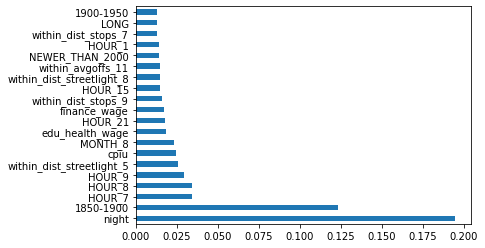

In [ ]:
shoot_feat_importances = pd.Series(shooting_final.feature_importances_, index=pro_x_tr.columns)
shoot_feat_importances.nlargest(20).plot(kind='barh')

### Predict Violence

In [ ]:
vio_scaler = StandardScaler()
vio_scaler.fit(vio_x_tr)
vio_x_tr_scaled = vio_scaler.transform(vio_x_tr)
vio_x_test_scaled = vio_scaler.transform(vio_x_test)

#### Hyperparameter Tuning

In [ ]:
violence_m3 = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = vio_scale_pos_weight,
                                    learning_rate=1,
                                    random_state = 2021)
parameters = {
    'n_estimators':[300,500]
}
violence_clf2 = GridSearchCV(violence_m3, parameters,scoring = 'roc_auc',
                             return_train_score = True)
violence_clf2.fit(vio_x_tr_scaled,vio_y_tr)

GridSearchCV(estimator=XGBClassifier(learning_rate=1, max_depth=1,
                                     random_state=2021,
                                     scale_pos_weight=10.141100458524384),
             param_grid={'n_estimators': [300, 500]}, return_train_score=True,
             scoring='roc_auc')

In [ ]:
vio_y_pred = violence_clf2.predict(vio_x_test_scaled)
print("roc_auc_score:",roc_auc_score(vio_y_test,violence_clf2.predict_proba(vio_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(vio_y_test,vio_y_pred))
print("f1_score weighted:",f1_score(vio_y_test,vio_y_pred,average='weighted'))
print("f1_score raw:",f1_score(vio_y_test,vio_y_pred))
print("recall_score:",recall_score(vio_y_test,vio_y_pred))
print("confusion_matrix:",confusion_matrix(vio_y_test,vio_y_pred))
print("best_parameters:",violence_clf2.best_params_)

roc_auc_score: 0.5986042058794606
accuracy_score: 0.5999251777029555
f1_score weighted: 0.6857470797193429
f1_score raw: 0.19241806373659565
recall_score: 0.5339480301760269
confusion_matrix: [[7381 4791]
 [ 556  637]]
best_parameters: {'n_estimators': 300}


In [ ]:
violence_m2 = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = vio_scale_pos_weight,
                                    
                                    random_state = 2021)
parameters = {
    'n_estimators':[500,900,1500,2000],
    'learning_rate':[0.5]
}
violence_clf1 = GridSearchCV(violence_m2, parameters,scoring = 'roc_auc',
                             return_train_score = True)
violence_clf1.fit(vio_x_tr_scaled,vio_y_tr)

GridSearchCV(estimator=XGBClassifier(max_depth=1, random_state=2021,
                                     scale_pos_weight=10.141100458524384),
             param_grid={'learning_rate': [0.5],
                         'n_estimators': [500, 900, 1500, 2000]},
             return_train_score=True, scoring='roc_auc')

In [ ]:
vio_y_pred = violence_clf1.predict(vio_x_test_scaled)
print("roc_auc_score:",roc_auc_score(vio_y_test,violence_clf1.predict_proba(vio_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(vio_y_test,vio_y_pred))
print("f1_score weighted:",f1_score(vio_y_test,vio_y_pred,average='weighted'))
print("f1_score raw:",f1_score(vio_y_test,vio_y_pred))
print("recall_score:",recall_score(vio_y_test,vio_y_pred))
print("confusion_matrix:",confusion_matrix(vio_y_test,vio_y_pred))
print("best_parameters:",violence_clf1.best_params_)

roc_auc_score: 0.5987009265627983
accuracy_score: 0.6047138047138048
f1_score weighted: 0.6895806969952246
f1_score raw: 0.19306552619520392
recall_score: 0.5297569153394803
confusion_matrix: [[7450 4722]
 [ 561  632]]
best_parameters: {'learning_rate': 0.5, 'n_estimators': 900}


#### Final Model

In [ ]:
violence_final = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = vio_scale_pos_weight,
                                    n_estimators = 900,
                                    learning_rate = 0.5,
                                    random_state = 2021)

violence_final.fit(vio_x_tr_scaled,vio_y_tr)
vio_y_pred = violence_final.predict(vio_x_test_scaled)
print("roc_auc_score:",roc_auc_score(vio_y_test,violence_final.predict_proba(vio_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(vio_y_test,vio_y_pred))
print("f1_score weighted:",f1_score(vio_y_test,vio_y_pred,average='weighted'))
print("f1_score raw:",f1_score(vio_y_test,vio_y_pred))
print("recall_score:",recall_score(vio_y_test,vio_y_pred))
print("confusion_matrix:",confusion_matrix(vio_y_test,vio_y_pred))

roc_auc_score: 0.5984562153144961
accuracy_score: 0.6074074074074074
f1_score weighted: 0.6917293731975813
f1_score raw: 0.19264502231112476
recall_score: 0.5247275775356245
confusion_matrix: [[7492 4680]
 [ 567  626]]


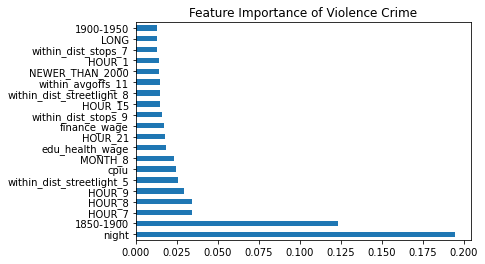

In [ ]:
vio_feat_importances = pd.Series(violence_final.feature_importances_, index=pro_x_tr.columns)
vio_feat_importances.nlargest(20).plot(kind='barh')
plt.title("Feature Importance of Violence Crime")
plt.show()

### Predict Property

In [ ]:
pro_scaler = StandardScaler()
pro_scaler.fit(pro_x_tr)
pro_x_tr_scaled = pro_scaler.transform(pro_x_tr)
pro_x_test_scaled = pro_scaler.transform(pro_x_test)

#### Hyperparameter Tuning

In [ ]:
pro_m1 = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = pro_scale_pos_weight,
                                    
                                    random_state = 2021)
parameters = {
    'n_estimators':[100,300,500,900,1500,2000],
    'learning_rate':[1, 0.5]
}
pro_clf1 = GridSearchCV(pro_m1, parameters,scoring = 'roc_auc',
                             return_train_score = True)
pro_clf1.fit(pro_x_tr_scaled,pro_y_tr)

GridSearchCV(estimator=XGBClassifier(max_depth=1, random_state=2021,
                                     scale_pos_weight=2.167446821117497),
             param_grid={'learning_rate': [1, 0.5],
                         'n_estimators': [100, 300, 500, 900, 1500, 2000]},
             return_train_score=True, scoring='roc_auc')

In [ ]:
pro_y_pred = pro_clf1.predict(pro_x_test_scaled)
print("roc_auc_score:",roc_auc_score(pro_y_test,pro_clf1.predict_proba(pro_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(pro_y_test,pro_y_pred))
print("f1_score weighted:",f1_score(pro_y_test,pro_y_pred,average='weighted'))
print("f1_score raw:",f1_score(pro_y_test,pro_y_pred))
print("recall_score:",recall_score(pro_y_test,pro_y_pred))
print("confusion_matrix:",confusion_matrix(pro_y_test,pro_y_pred))
print("best_parameters:",pro_clf1.best_params_)

roc_auc_score: 0.6439741913499116
accuracy_score: 0.6182566404788628
f1_score weighted: 0.6301170807290848
f1_score raw: 0.48733922829581994
recall_score: 0.5751897533206831
confusion_matrix: [[5838 3311]
 [1791 2425]]
best_parameters: {'learning_rate': 1, 'n_estimators': 2000}


In [ ]:
pro_m2 = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = pro_scale_pos_weight,
                                    
                                    random_state = 2021)
parameters = {
    'n_estimators':[2000,2500,3000,3500,4000],
    'learning_rate':[1]
}
pro_clf2 = GridSearchCV(pro_m2, parameters,scoring = 'roc_auc',
                             return_train_score = True)
pro_clf2.fit(pro_x_tr_scaled,pro_y_tr)

GridSearchCV(estimator=XGBClassifier(max_depth=1, random_state=2021,
                                     scale_pos_weight=2.167446821117497),
             param_grid={'learning_rate': [1],
                         'n_estimators': [2000, 2500, 3000, 3500, 4000]},
             return_train_score=True, scoring='roc_auc')

In [ ]:
pro_y_pred = pro_clf2.predict(pro_x_test_scaled)
print("roc_auc_score:",roc_auc_score(pro_y_test,pro_clf2.predict_proba(pro_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(pro_y_test,pro_y_pred))
print("f1_score weighted:",f1_score(pro_y_test,pro_y_pred,average='weighted'))
print("f1_score raw:",f1_score(pro_y_test,pro_y_pred))
print("recall_score:",recall_score(pro_y_test,pro_y_pred))
print("confusion_matrix:",confusion_matrix(pro_y_test,pro_y_pred))
print("best_parameters:",pro_clf2.best_params_)

roc_auc_score: 0.6439741913499116
accuracy_score: 0.6182566404788628
f1_score weighted: 0.6301170807290848
f1_score raw: 0.48733922829581994
recall_score: 0.5751897533206831
confusion_matrix: [[5838 3311]
 [1791 2425]]
best_parameters: {'learning_rate': 1, 'n_estimators': 2000}


#### Final Model
Based on the gridsearch result, we found the best model and we compute the feature importance plot

In [ ]:
pro_final = xgboost.XGBClassifier( max_depth = 1, 
                                  scale_pos_weight = pro_scale_pos_weight,
                                  n_estimators = 2000, 
                                  learning_rate = 1,
                                  random_state = 2021)
pro_final.fit(pd.DataFrame(pro_x_tr_scaled,columns = pro_x_tr.columns),pro_y_tr)

XGBClassifier(learning_rate=1, max_depth=1, n_estimators=2000,
              random_state=2021, scale_pos_weight=2.167446821117497)

In [ ]:
pro_y_pred = pro_final.predict(pd.DataFrame(pro_x_test_scaled,columns = pro_x_tr.columns))
print("roc_auc_score:",roc_auc_score(pro_y_test,pro_final.predict_proba(pd.DataFrame(pro_x_test_scaled,columns = pro_x_tr.columns))[:,1]))
print("accuracy_score:",accuracy_score(pro_y_test,pro_y_pred))
print("f1_score weighted:",f1_score(pro_y_test,pro_y_pred,average='weighted'))
print("f1_score raw:",f1_score(pro_y_test,pro_y_pred))
print("recall_score:",recall_score(pro_y_test,pro_y_pred))
print("confusion_matrix:",confusion_matrix(pro_y_test,pro_y_pred))

roc_auc_score: 0.6439741913499116
accuracy_score: 0.6182566404788628
f1_score weighted: 0.6301170807290848
f1_score raw: 0.48733922829581994
recall_score: 0.5751897533206831
confusion_matrix: [[5838 3311]
 [1791 2425]]


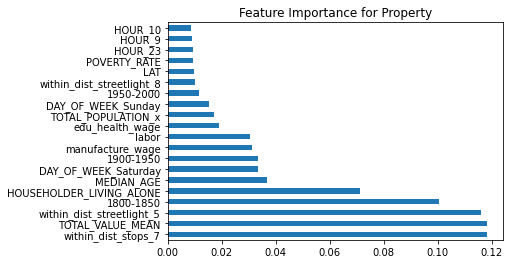

In [ ]:
pro_feat_importances = pd.Series(pro_final.feature_importances_, index=pro_x_tr.columns)
pro_feat_importances.nlargest(20).plot(kind='barh')
plt.title("Feature Importance for Property")
plt.show()

### Predict Other

In [ ]:
# Standard scale the data
other_scaler = StandardScaler()
other_scaler.fit(pro_x_tr)
other_x_tr_scaled = other_scaler.transform(pro_x_tr)
other_x_test_scaled = other_scaler.transform(pro_x_test)

#### Hyperparameter Tuning

##### Intial Try
Fit the model with larger learning rate and smaller n_estimators to have an overall idea of the performance. We do this to reduce the time of computation with Gridsearch. Currently, to finish runing this search takes at least an hour to finish.

In [ ]:
other_m1 = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = other_scale_pos_weight,
                                    
                                    random_state = 2021)
parameters = {
    'n_estimators':[100,300,500,900,1500,2000],
    'learning_rate':[1, 0.5]
}
other_clf1 = GridSearchCV(other_m1, parameters,scoring = 'roc_auc',
                             return_train_score = True)
other_clf1.fit(other_x_tr_scaled,other_y_tr)

In [ ]:
other_y_pred = other_clf1.predict(other_x_test_scaled)
print("roc_auc_score:",roc_auc_score(other_y_test,other_clf1.predict_proba(other_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(other_y_test,other_y_pred))
print("f1_score weighted:",f1_score(other_y_test,other_y_pred,average='weighted'))
print("f1_score raw:",f1_score(other_y_test,other_y_pred))
print("recall_score:",recall_score(other_y_test,other_y_pred))
print("confusion_matrix:",confusion_matrix(other_y_test,other_y_pred))
print("best_parameters:",other_clf1.best_params_)

roc_auc_score: 0.6240749175930735
accuracy_score: 0.593939393939394
f1_score weighted: 0.5969016092031872
f1_score raw: 0.6435467980295566
recall_score: 0.6157616892911011
confusion_matrix: [[3039 2370]
 [3057 4899]]
best_parameters: {'learning_rate': 1, 'n_estimators': 2000}


##### Second Trial
Based on the result from initial try, we learned that the learning rate = 1 and n_estimators = 2000 have the best model in that search. It means the best score of learning rate = 1 is not even reached yet with the chosen parameters. We decided to stick with learning rate = 1 because if we choose learning rate = 0.5, the time to serach for the best parameter would take too much time as the n_estimators would be much larger than 2000. 

According to the result, the model with n_estimators = 3000 is the best with the lowest roc-auc score.

In [ ]:
other_m2 = xgboost.XGBClassifier( max_depth = 1, 
                                    scale_pos_weight = other_scale_pos_weight,
                                    
                                    random_state = 2021)
parameters = {
    'n_estimators':[2000,3000,4000,5000],
    'learning_rate':[1]
}
other_clf2 = GridSearchCV(other_m2, parameters,scoring = 'roc_auc',
                             return_train_score = True)
other_clf2.fit(other_x_tr_scaled,other_y_tr)

GridSearchCV(estimator=XGBClassifier(max_depth=1, random_state=2021,
                                     scale_pos_weight=0.6833139150423528),
             param_grid={'learning_rate': [1],
                         'n_estimators': [2000, 3000, 4000, 5000]},
             return_train_score=True, scoring='roc_auc')

In [ ]:
other_y_pred = other_clf2.predict(other_x_test_scaled)
print("roc_auc_score:",roc_auc_score(other_y_test,other_clf2.predict_proba(other_x_test_scaled)[:,1]))
print("accuracy_score:",accuracy_score(other_y_test,other_y_pred))
print("f1_score weighted:",f1_score(other_y_test,other_y_pred,average='weighted'))
print("f1_score raw:",f1_score(other_y_test,other_y_pred))
print("recall_score:",recall_score(other_y_test,other_y_pred))
print("confusion_matrix:",confusion_matrix(other_y_test,other_y_pred))
print("best_parameters:",other_clf2.best_params_)

roc_auc_score: 0.6244177976095369
accuracy_score: 0.592368125701459
f1_score weighted: 0.595323021231875
f1_score raw: 0.6423319327731093
recall_score: 0.6148818501759679
confusion_matrix: [[3025 2384]
 [3064 4892]]
best_parameters: {'learning_rate': 1, 'n_estimators': 3000}


## AdaBoost

### Pre-requisites - load data and required modules

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_validate
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, confusion_matrix,f1_score,accuracy_score, recall_score

from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
# source: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html

In [ ]:
# from google.colab import drive
# drive.mount("/content/drive")

In [ ]:
%cd /content/drive/Shareddrives/AC209a
df = pd.read_csv("cleaned_data.csv")

[Errno 2] No such file or directory: '/content/drive/Shareddrives/AC209a'
/home/cwu/Downloads


### Pre-processing

#### Scaler

In [ ]:
cat_cols=['night', 'MONTH_2', 'MONTH_3', 'MONTH_4',
       'MONTH_5', 'MONTH_6', 'MONTH_7', 'MONTH_8', 'MONTH_9', 'MONTH_10',
       'MONTH_11', 'MONTH_12', 'DAY_OF_WEEK_Monday',
       'DAY_OF_WEEK_Saturday', 'DAY_OF_WEEK_Sunday',
       'DAY_OF_WEEK_Thursday', 'DAY_OF_WEEK_Tuesday',
       'DAY_OF_WEEK_Wednesday', 'HOUR_1', 'HOUR_2', 'HOUR_3', 'HOUR_4',
       'HOUR_5', 'HOUR_6', 'HOUR_7', 'HOUR_8', 'HOUR_9', 'HOUR_10',
       'HOUR_11', 'HOUR_12', 'HOUR_13', 'HOUR_14', 'HOUR_15', 'HOUR_16',
       'HOUR_17', 'HOUR_18', 'HOUR_19', 'HOUR_20', 'HOUR_21', 'HOUR_22',
       'HOUR_23', 'YEAR_y','SHOOTING','CRIME_TYPE_VIOLENT','CRIME_TYPE_PROPERTY','CRIME_TYPE_OTHER']
scaler=StandardScaler()
df_cat=df[cat_cols].copy()

df_num=pd.DataFrame(scaler.fit_transform(df[[col for col in df.columns if col not in cat_cols]].copy()), columns=[col for col in df.columns if col not in cat_cols])
df=pd.concat([df_cat,df_num],axis=1)

#### Train test split

In [ ]:
target_values = ['SHOOTING','CRIME_TYPE_VIOLENT','CRIME_TYPE_PROPERTY','CRIME_TYPE_OTHER']

In [ ]:
shoot_x_tr, shoot_x_test, shoot_y_tr, shoot_y_test = train_test_split(df[df.CRIME_TYPE_VIOLENT==1].drop(columns = target_values),
                                                                      df[df.CRIME_TYPE_VIOLENT==1].SHOOTING,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
vio_x_tr, vio_x_test, vio_y_tr, vio_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_VIOLENT,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
pro_x_tr, pro_x_test, pro_y_tr, pro_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_PROPERTY,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
other_x_tr, other_x_test, other_y_tr, other_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_OTHER,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
shooting_scale_pos_weight = np.sum(shoot_y_tr==0)/np.sum(shoot_y_tr==1)
print(shooting_scale_pos_weight)

18.0197628458498


### Predict Shooting

#### Hyperparameter Tuning

In [ ]:
boost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(), 
                           random_state=2021)
# boost.get_params().keys()

parameters = {
              'base_estimator__max_depth':[1,2,3,4,5],
#               'base_estimator__class_weight':[{0: w} for w in [1, 2, 4]],
              'n_estimators':[100,120,140,160],
              'learning_rate':[0.3,0.1,0.05]
              }
shooting_clf1 = GridSearchCV(boost, 
                             parameters,
                             scoring = 'recall',
                             return_train_score=True,n_jobs=-1)
shooting_clf1.fit(shoot_x_tr,shoot_y_tr)

GridSearchCV(estimator=AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                          random_state=2021),
             n_jobs=-1,
             param_grid={'base_estimator__max_depth': [1, 2, 3, 4, 5],
                         'learning_rate': [0.3, 0.1, 0.05],
                         'n_estimators': [100, 120, 140, 160]},
             return_train_score=True, scoring='recall')

In [ ]:
shoot_y_pred = shooting_clf1.predict(shoot_x_test)
print("roc_auc_score:",roc_auc_score(shoot_y_test,shooting_clf1.predict_proba(shoot_x_test)[:,1]))
print("accuracy_score:",accuracy_score(shoot_y_test,shoot_y_pred))
print("f1_score:",f1_score(shoot_y_test,shoot_y_pred,average='weighted'))
print("f1_score unweighted:",f1_score(shoot_y_test,shoot_y_pred))
print("recall_score:",recall_score(shoot_y_test,shoot_y_pred))
print("confusion_matrix:",confusion_matrix(shoot_y_test,shoot_y_pred))

roc_auc_score: 0.7462455830388693
accuracy_score: 0.936046511627907
f1_score: 0.9158815279894497
f1_score unweighted: 0.11494252873563217
recall_score: 0.06944444444444445
confusion_matrix: [[1122   10]
 [  67    5]]


In [ ]:
shooting_clf1.best_params_

{'base_estimator__max_depth': 2, 'learning_rate': 0.3, 'n_estimators': 160}

In [ ]:
shooting_clf1.best_score_

0.12250980392156863

#### Final Model

In [ ]:
max_depth=2
n_estimators = 160
learning_rate = 0.3

shooting_ada = AdaBoostClassifier(DecisionTreeClassifier(max_depth=max_depth), 
                                  n_estimators=n_estimators, 
                                  learning_rate=learning_rate,
                                  random_state=2021)
shooting_ada.fit(shoot_x_tr, shoot_y_tr)

shooting_ada_train_scores = list(shooting_ada.staged_score(shoot_x_tr, shoot_y_tr))
shooting_ada_test_scores = list(shooting_ada.staged_score(shoot_x_test, shoot_y_test))

/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


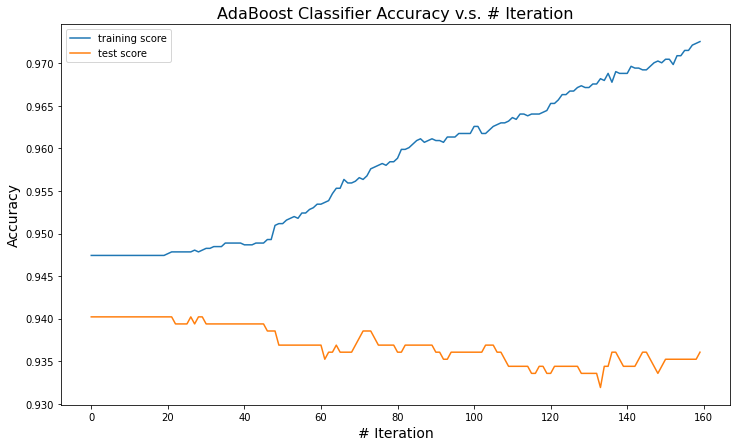

In [ ]:
plt.figure(figsize=(12,7))
plt.plot(shooting_ada_train_scores, label='training score')
plt.plot(shooting_ada_test_scores, label='test score')

plt.xlabel('# Iteration', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('AdaBoost Classifier Accuracy v.s. # Iteration', fontsize=16)
plt.legend()

plt.show()

<AxesSubplot:>

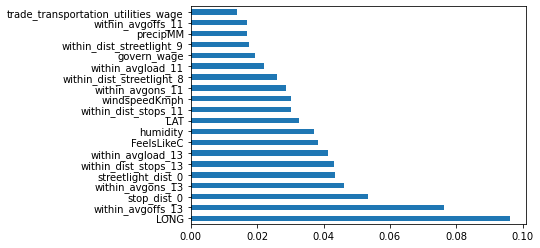

In [ ]:
shoot_feat_importances = pd.Series(shooting_ada.feature_importances_, index=shoot_x_tr.columns)
shoot_feat_importances.nlargest(20).plot(kind='barh')

### Predict Violence

#### Hyperparameter Tuning

In [ ]:
boost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(), 
                           random_state=2021)
# boost.get_params().keys()

parameters = {
              'base_estimator__max_depth':[1,2,3],
#               'base_estimator__class_weight':[{0: w} for w in [1, 2, 4]],
              'n_estimators':[140,160,180],
              'learning_rate':[0.1,0.05,0.01]
              }
violence_clf1 = GridSearchCV(boost, 
                             parameters,
                             scoring = 'recall',
                             return_train_score=True,n_jobs=-1)
violence_clf1.fit(vio_x_tr, vio_y_tr)

GridSearchCV(estimator=AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                          random_state=2021),
             n_jobs=-1,
             param_grid={'base_estimator__max_depth': [1, 2, 3],
                         'learning_rate': [0.1, 0.05, 0.01],
                         'n_estimators': [140, 160, 180]},
             return_train_score=True, scoring='recall')

In [ ]:
violence_clf1.best_params_

{'base_estimator__max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 160}

In [ ]:
violence_clf1.best_score_

0.0024876916130974138

In [ ]:
violence_y_pred = violence_clf1.predict(vio_x_test)
print("roc_auc_score:",roc_auc_score(vio_y_test,violence_clf1.predict_proba(vio_x_test)[:,1]))
print("accuracy_score:",accuracy_score(vio_y_test,violence_y_pred))
print("f1_score:",f1_score(vio_y_test,violence_y_pred,average='weighted'))
print("f1_score unweighted:",f1_score(vio_y_test,violence_y_pred))
print("recall_score:",recall_score(vio_y_test,violence_y_pred))
print("confusion_matrix:",confusion_matrix(vio_y_test,violence_y_pred))

roc_auc_score: 0.5878099503649699
accuracy_score: 0.9098391320613542
f1_score: 0.8677423636004549
f1_score unweighted: 0.0
recall_score: 0.0
confusion_matrix: [[12160    12]
 [ 1193     0]]


#### Final Model

In [ ]:
max_depth=3
n_estimators = 160
learning_rate = 0.1

violence_ada = AdaBoostClassifier(DecisionTreeClassifier(max_depth=max_depth), 
                         n_estimators=n_estimators, 
                         learning_rate=learning_rate,
                         random_state=2021)
violence_ada.fit(vio_x_tr, vio_y_tr)

violence_ada_train_scores = list(violence_ada.staged_score(vio_x_tr, vio_y_tr))
violence_ada_test_scores = list(violence_ada.staged_score(vio_x_test, vio_y_test))

/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


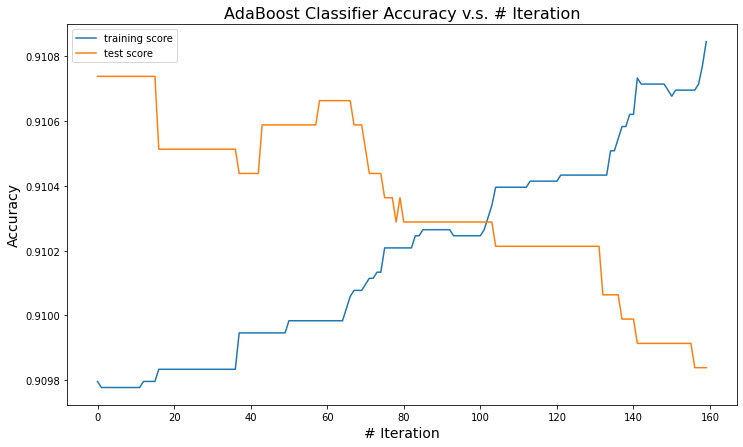

In [ ]:
plt.figure(figsize=(12,7))
plt.plot(violence_ada_train_scores, label='training score')
plt.plot(violence_ada_test_scores, label='test score')

plt.xlabel('# Iteration', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('AdaBoost Classifier Accuracy v.s. # Iteration', fontsize=16)
plt.legend()

plt.show()

<AxesSubplot:>

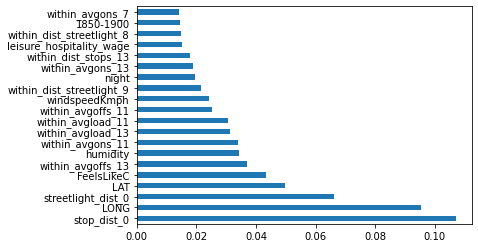

In [ ]:
violence_feat_importances = pd.Series(violence_ada.feature_importances_, index=vio_x_tr.columns)
violence_feat_importances.nlargest(20).plot(kind='barh')

### Predict Property

#### Hyperparameter Tuning

In [ ]:
boost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(), 
                           random_state=2021)
# boost.get_params().keys()

parameters = {
              'base_estimator__max_depth':[1,2,3],
              # 'base_estimator__class_weight':[{0: w} for w in [1, 2, 4]],
              'n_estimators':[140,160,180],
              'learning_rate':[0.1,0.05,0.01]
              }
property_clf1 = GridSearchCV(boost, 
                             parameters,
                             scoring = 'recall',
                             return_train_score=True,
                             n_jobs=-1)
property_clf1.fit(pro_x_tr, pro_y_tr)

GridSearchCV(estimator=AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                          random_state=2021),
             n_jobs=-1,
             param_grid={'base_estimator__max_depth': [1, 2, 3],
                         'learning_rate': [0.1, 0.05, 0.01],
                         'n_estimators': [140, 160, 180]},
             return_train_score=True, scoring='recall')

In [ ]:
property_clf1.best_params_

{'base_estimator__max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 180}

In [ ]:
property_clf1.best_score_

0.15583347375811832

In [ ]:
property_y_pred = property_clf1.predict(pro_x_test)
print("roc_auc_score:",roc_auc_score(pro_y_test,property_clf1.predict_proba(pro_x_test)[:,1]))
print("accuracy_score:",accuracy_score(pro_y_test,property_y_pred))
print("f1_score:",f1_score(pro_y_test,property_y_pred,average='weighted'))
print("f1_score unweighted:",f1_score(pro_y_test,property_y_pred))
print("recall_score:",recall_score(pro_y_test,property_y_pred))
print("confusion_matrix:",confusion_matrix(pro_y_test,property_y_pred))

roc_auc_score: 0.6470302148304592
accuracy_score: 0.7058735503179948
f1_score: 0.6401924155099668
f1_score unweighted: 0.257320989986775
recall_score: 0.16152751423149905
confusion_matrix: [[8753  396]
 [3535  681]]


#### Final Model

In [ ]:
max_depth=3
n_estimators = 180
learning_rate = 0.1

property_ada = AdaBoostClassifier(DecisionTreeClassifier(max_depth=max_depth), 
                               n_estimators=n_estimators, 
                               learning_rate=learning_rate,
                               random_state=2021)
property_ada.fit(pro_x_tr, pro_y_tr)

property_ada_train_scores = list(property_ada.staged_score(pro_x_tr, pro_y_tr))
property_ada_test_scores = list(property_ada.staged_score(pro_x_test, pro_y_test))

/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


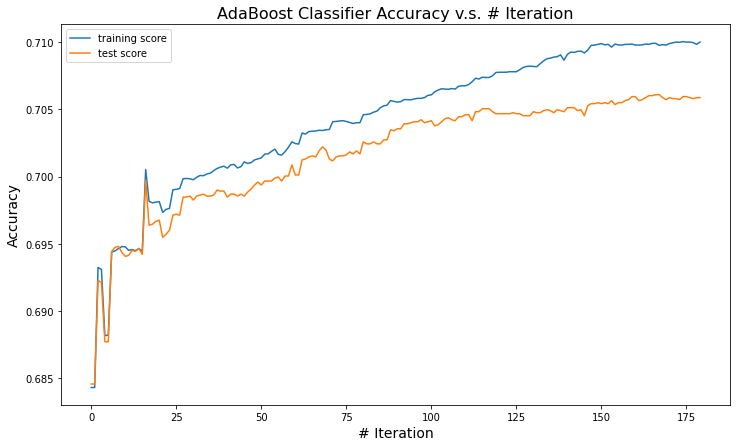

In [ ]:
plt.figure(figsize=(12,7))
plt.plot(property_ada_train_scores, label='training score')
plt.plot(property_ada_test_scores, label='test score')

plt.xlabel('# Iteration', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('AdaBoost Classifier Accuracy v.s. # Iteration', fontsize=16)
plt.legend()

plt.show()

<AxesSubplot:>

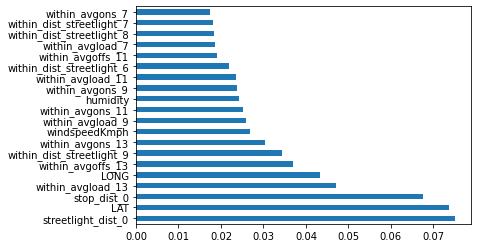

In [ ]:
other_feat_importances = pd.Series(other_ada.feature_importances_, index=pro_x_tr.columns)
other_feat_importances.nlargest(20).plot(kind='barh')

### Predict Other

#### Hyperparameter Tuning

In [ ]:
boost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(), 
                           random_state=2021)
# boost.get_params().keys()

parameters = {
              'base_estimator__max_depth':[1,2,3],
#               'base_estimator__class_weight':[{1: w} for w in [1, 2, 4]],
              'n_estimators':[140,160,180],
              'learning_rate':[0.2,0.1,0.05]
              }
other_clf1 = GridSearchCV(boost, 
                             parameters,
                             scoring = 'recall',
                             return_train_score=True,
                             n_jobs=-1)
other_clf1.fit(other_x_tr, other_y_tr)

GridSearchCV(estimator=AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                          random_state=2021),
             n_jobs=-1,
             param_grid={'base_estimator__max_depth': [1, 2, 3],
                         'learning_rate': [0.2, 0.1, 0.05],
                         'n_estimators': [140, 160, 180]},
             return_train_score=True, scoring='recall')

In [ ]:
other_y_pred = other_clf1.predict(other_x_test)
print("roc_auc_score:",roc_auc_score(other_y_test,other_clf1.predict_proba(other_x_test)[:,1]))
print("accuracy_score:",accuracy_score(other_y_test,other_y_pred))
print("f1_score:",f1_score(other_y_test,other_y_pred,average='weighted'))
print("f1_score unweighted:",f1_score(other_y_test,other_y_pred))
print("recall_score:",recall_score(other_y_test,other_y_pred,average='weighted'))
print("confusion_matrix:",confusion_matrix(other_y_test,other_y_pred))

roc_auc_score: 0.5875846807097012
accuracy_score: 0.6189300411522634
f1_score: 0.5477066013548398
f1_score unweighted: 0.7434127663862159
recall_score: 0.6189300411522634
confusion_matrix: [[ 894 4515]
 [ 578 7378]]


In [ ]:
other_clf1.best_score_

0.9255910679886584

In [ ]:
other_clf1.best_params_

{'base_estimator__max_depth': 1, 'learning_rate': 0.05, 'n_estimators': 140}

#### Final Model

In [ ]:
max_depth=1
n_estimators = 140
learning_rate = 0.05

other_ada = AdaBoostClassifier(DecisionTreeClassifier(max_depth=max_depth), 
                               n_estimators=n_estimators, 
                               learning_rate=learning_rate,
                               random_state=2021)
other_ada.fit(pro_x_tr, pro_y_tr)

other_ada_train_scores = list(other_ada.staged_score(pro_x_tr, pro_y_tr))
other_ada_test_scores = list(other_ada.staged_score(pro_x_test, pro_y_test))

/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
/home/cwu/miniconda3/lib/python3.9/site-packages/sklearn/base.py:445: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


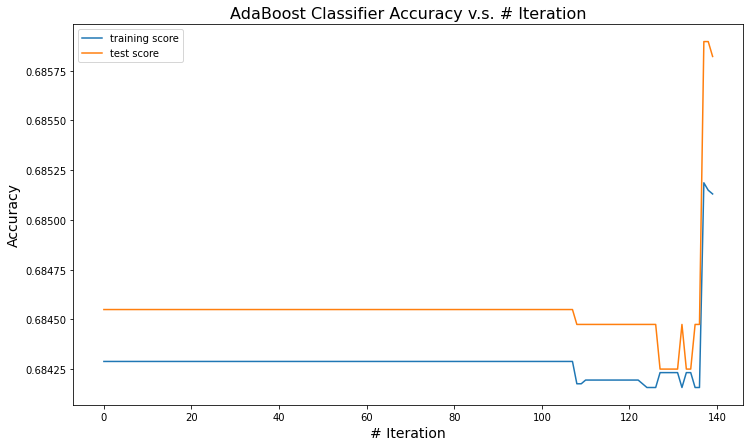

In [ ]:
plt.figure(figsize=(12,7))
plt.plot(other_ada_train_scores, label='training score')
plt.plot(other_ada_test_scores, label='test score')

plt.xlabel('# Iteration', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('AdaBoost Classifier Accuracy v.s. # Iteration', fontsize=16)
plt.legend()

plt.show()

<AxesSubplot:>

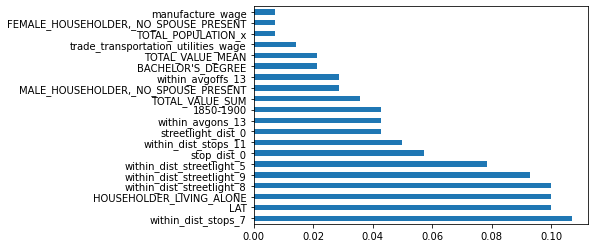

In [ ]:
other_feat_importances = pd.Series(other_ada.feature_importances_, index=pro_x_tr.columns)
other_feat_importances.nlargest(20).plot(kind='barh')

## LightGBM

### Pre-requisites - load data and required modules

In [ ]:
!pip install lightgbm

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_validate
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, confusion_matrix,f1_score,accuracy_score
from sklearn.model_selection import GridSearchCV
import lightgbm
from sklearn.metrics import recall_score
# import tensorflow as tf

In [ ]:
# from google.colab import drive
# drive.mount("/content/drive")
# %cd /content/drive/Shareddrives/AC209a

In [ ]:
df = pd.read_csv("cleaned_data.csv")

In [ ]:
import re
df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

### Pre-processing

#### Scaler

In [ ]:
cat_cols=['night', 'MONTH_2', 'MONTH_3', 'MONTH_4',
       'MONTH_5', 'MONTH_6', 'MONTH_7', 'MONTH_8', 'MONTH_9', 'MONTH_10',
       'MONTH_11', 'MONTH_12', 'DAY_OF_WEEK_Monday',
       'DAY_OF_WEEK_Saturday', 'DAY_OF_WEEK_Sunday',
       'DAY_OF_WEEK_Thursday', 'DAY_OF_WEEK_Tuesday',
       'DAY_OF_WEEK_Wednesday', 'HOUR_1', 'HOUR_2', 'HOUR_3', 'HOUR_4',
       'HOUR_5', 'HOUR_6', 'HOUR_7', 'HOUR_8', 'HOUR_9', 'HOUR_10',
       'HOUR_11', 'HOUR_12', 'HOUR_13', 'HOUR_14', 'HOUR_15', 'HOUR_16',
       'HOUR_17', 'HOUR_18', 'HOUR_19', 'HOUR_20', 'HOUR_21', 'HOUR_22',
       'HOUR_23', 'YEAR_y','SHOOTING','CRIME_TYPE_VIOLENT','CRIME_TYPE_PROPERTY','CRIME_TYPE_OTHER']
scaler=StandardScaler()
df_cat=df[cat_cols].copy()

df_num=pd.DataFrame(scaler.fit_transform(df[[col for col in df.columns if col not in cat_cols]].copy()), columns=[col for col in df.columns if col not in cat_cols])
df_scaled=pd.concat([df_cat,df_num],axis=1)

#### Train test split

In [ ]:
target_values = ['SHOOTING','CRIME_TYPE_VIOLENT','CRIME_TYPE_PROPERTY','CRIME_TYPE_OTHER']
shoot_x_tr, shoot_x_test, shoot_y_tr, shoot_y_test = train_test_split(df_scaled[df_scaled.CRIME_TYPE_VIOLENT==1].drop(columns = target_values),
                                                                      df_scaled[df_scaled.CRIME_TYPE_VIOLENT==1].SHOOTING,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
vio_x_tr, vio_x_test, vio_y_tr, vio_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_VIOLENT,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
pro_x_tr, pro_x_test, pro_y_tr, pro_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_PROPERTY,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
other_x_tr, other_x_test, other_y_tr, other_y_test = train_test_split(df.drop(columns = target_values),
                                                                      df.CRIME_TYPE_OTHER,
                                                                      random_state = 2021,
                                                                      test_size = 0.2)

In [ ]:
shooting_scale_pos_weight = np.sum(shoot_y_tr==0)/np.sum(shoot_y_tr==1)
print(shooting_scale_pos_weight)

18.0197628458498


### Predict Shooting

#### Hyperparameter Tuning

##### scoring='recall'

In [ ]:
import time
start = time.time()
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
lgb=lgb.LGBMClassifier(is_unbalance=True)
#Define the parameters
parameters = { 'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01],'max_depth':[-1,1,5,10,20],'num_leaves' :['default',2,10,40,60,80,100]
             }
#Define the scoring
shooting_clf1=GridSearchCV(lgb,parameters,scoring='recall', return_train_score=True,n_jobs=-1,verbose=20)
shooting_clf1.fit(X=shoot_x_tr, y=shoot_y_tr)
end = time.time()
print('Execution time is:')
print(shooting_clf1.best_params_)
shoot_y_pred = shooting_clf1.predict(shoot_x_test)
print("roc_auc_score:",roc_auc_score(shoot_y_test,shooting_clf1.predict_proba(shoot_x_test)[:,1]))
print("accuracy_score:",accuracy_score(shoot_y_test,shoot_y_pred))
print("f1_score:",f1_score(shoot_y_test,shoot_y_pred))
print("confusion_matrix:",confusion_matrix(shoot_y_test,shoot_y_pred))

Fitting 5 folds for each of 1960 candidates, totalling 9800 fits
Execution time is:
{'learning_rate': 0.1, 'max_depth': -1, 'n_estimators': 60, 'num_leaves': 2}
roc_auc_score: 0.7936849725166863
accuracy_score: 0.7159468438538206
f1_score: 0.22272727272727275
confusion_matrix: [[813 319]
 [ 23  49]]


C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.71090196 0.37945098 ... 0.19356863 0.19372549 0.17788235]
  warnings.warn(
C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the train scores are non-finite: [       nan 0.84288641 0.96933132 ... 1.         1.         1.        ]
  warnings.warn(


In [ ]:
print("recall",recall_score(shoot_y_test,shoot_y_pred))

0.6805555555555556


In [ ]:

print("f1_score weighted:",f1_score(shoot_y_test,shoot_y_pred,average='weighted'))

f1_score weighted: 0.7901302752834234


##### scoring='f1'

In [ ]:
import time
start = time.time()
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
lgb1=lgb.LGBMClassifier(is_unbalance=True)
#Define the parameters
parameters = { 'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01],'max_depth':[-1,1,5,10,20],'num_leaves' :['default',2,10,40,60,80,100]
             }
#Define the scoring
shooting_clf2=GridSearchCV(lgb1,parameters,scoring='f1', return_train_score=True,n_jobs=-1,verbose=20)
shooting_clf2.fit(X=shoot_x_tr, y=shoot_y_tr)
end = time.time()
print('Execution time is:')
print(shooting_clf2.best_params_)
shoot_y_pred2 = shooting_clf2.predict(shoot_x_test)
print("roc_auc_score:",roc_auc_score(shoot_y_test,shooting_clf2.predict_proba(shoot_x_test)[:,1]))
print("accuracy_score:",accuracy_score(shoot_y_test,shoot_y_pred2))
print("f1_score:",f1_score(shoot_y_test,shoot_y_pred2))
print("confusion_matrix:",confusion_matrix(shoot_y_test,shoot_y_pred2))

Fitting 5 folds for each of 1960 candidates, totalling 9800 fits


C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.2205618  0.20009038 ... 0.23654384 0.25512028 0.23289904]
  warnings.warn(
C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the train scores are non-finite: [       nan 0.25735399 0.54270018 ... 0.96251355 0.98396737 0.98880696]
  warnings.warn(


Execution time is:
{'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'num_leaves': 40}
roc_auc_score: 0.8088805457400863
accuracy_score: 0.920265780730897
f1_score: 0.25
confusion_matrix: [[1092   40]
 [  56   16]]


In [ ]:

print("f1_score weighted:",f1_score(shoot_y_test,shoot_y_pred2,average='weighted'))

f1_score weighted: 0.9155621612169959


##### scoring='roc_auc'

In [ ]:
import time
start = time.time()
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
lgb3=lgb.LGBMClassifier(is_unbalance=True)
#Define the parameters
parameters = { 'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01],'max_depth':[-1,1,5,10,20],'num_leaves' :['default',2,10,40,60,80,100]
             }
#Define the scoring
shooting_clf3=GridSearchCV(lgb3,parameters,scoring='roc_auc', return_train_score=True,n_jobs=-1,verbose=20)
shooting_clf3.fit(X=shoot_x_tr, y=shoot_y_tr)
end = time.time()
print('Execution time is:')
print(shooting_clf3.best_params_)
shoot_y_pred3 = shooting_clf3.predict(shoot_x_test)
print("roc_auc_score:",roc_auc_score(shoot_y_test,shooting_clf3.predict_proba(shoot_x_test)[:,1]))
print("accuracy_score:",accuracy_score(shoot_y_test,shoot_y_pred3))
print("f1_score:",f1_score(shoot_y_test,shoot_y_pred3))
print("confusion_matrix:",confusion_matrix(shoot_y_test,shoot_y_pred3))

Fitting 5 folds for each of 1960 candidates, totalling 9800 fits


C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.78691674 0.66512175 ... 0.78068673 0.78147186 0.78234666]
  warnings.warn(
C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the train scores are non-finite: [       nan 0.86325577 0.9428364  ... 1.         1.         1.        ]
  warnings.warn(


Execution time is:
{'learning_rate': 0.01, 'max_depth': -1, 'n_estimators': 260, 'num_leaves': 10}
roc_auc_score: 0.8168617491166078
accuracy_score: 0.7931893687707641
f1_score: 0.2697947214076246
confusion_matrix: [[909 223]
 [ 26  46]]


In [ ]:
print("recall",recall_score(shoot_y_test,shoot_y_pred3))

recall 0.6388888888888888


In [ ]:

print("f1_score weighted:",f1_score(shoot_y_test,shoot_y_pred3,average='weighted'))

f1_score weighted: 0.84307265156251


### Predict Violence

#### Hyperparameter Tuning

##### scoring='recall'

In [ ]:
import time
start = time.time()
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
vio_lgb=lgb.LGBMClassifier(is_unbalance=True)
#Define the parameters
parameters = { 'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01],'max_depth':[-1,1,5,10,20],'num_leaves' :['default',2,10,40,60,80,100]
             }
#Define the scoring
vio_clf1=GridSearchCV(vio_lgb,parameters,scoring='recall', return_train_score=True,n_jobs=-1,verbose=20)
vio_clf1.fit(X=vio_x_tr, y=vio_y_tr)
end = time.time()
print(vio_clf1.best_params_)
vio_y_pred = vio_clf1.predict(vio_x_test)
print("roc_auc_score:",roc_auc_score(vio_y_test,vio_clf1.predict_proba(vio_x_test)[:,1]))
print("accuracy_score:",accuracy_score(vio_y_test,vio_y_pred))
print("f1_score:",f1_score(vio_y_test,vio_y_pred))
print("confusion_matrix:",confusion_matrix(vio_y_test,vio_y_pred))

Fitting 5 folds for each of 1960 candidates, totalling 9800 fits


C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.54302088 0.48620407 ... 0.36450175 0.3356825  0.31266657]
  warnings.warn(
C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the train scores are non-finite: [       nan 0.56318714 0.6891471  ... 0.79504544 0.84527323 0.88357884]
  warnings.warn(


{'learning_rate': 0.1, 'max_depth': -1, 'n_estimators': 340, 'num_leaves': 2}
roc_auc_score: 0.5857320567809979
accuracy_score: 0.569173213617658
f1_score: 0.18924246691072938
confusion_matrix: [[6935 5237]
 [ 521  672]]


In [ ]:
print("recall",recall_score(vio_y_test,vio_y_pred))

recall 0.5632858340318525


In [ ]:

print("f1_score weighted:",f1_score(vio_y_test,vio_y_pred,average='weighted'))

f1_score weighted: 0.6604587955144318


##### scoring='roc_auc'

In [ ]:
import time
start = time.time()
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
vio_lgb2=lgb.LGBMClassifier(is_unbalance=True)
#Define the parameters
parameters = { 'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01],'max_depth':[-1,1,5,10,20],'num_leaves' :['default',2,10,40,60,80,100]
             }
#Define the scoring
vio_clf2=GridSearchCV(vio_lgb2,parameters,scoring='roc_auc', return_train_score=True,n_jobs=-1,verbose=20)
vio_clf2.fit(X=vio_x_tr, y=vio_y_tr)
end = time.time()
print(vio_clf2.best_params_)
vio_y_pred2 = vio_clf2.predict(vio_x_test)
print("roc_auc_score:",roc_auc_score(vio_y_test,vio_clf2.predict_proba(vio_x_test)[:,1]))
print("accuracy_score:",accuracy_score(vio_y_test,vio_y_pred2))
print("f1_score:",f1_score(vio_y_test,vio_y_pred2))
print("confusion_matrix:",confusion_matrix(vio_y_test,vio_y_pred2))

Fitting 5 folds for each of 1960 candidates, totalling 9800 fits


C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.580709   0.57590423 ... 0.59735907 0.59532375 0.5943197 ]
  warnings.warn(
C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the train scores are non-finite: [       nan 0.60297912 0.73855582 ... 0.88325347 0.9206108  0.94449677]
  warnings.warn(


{'learning_rate': 0.01, 'max_depth': 20, 'n_estimators': 220, 'num_leaves': 40}
roc_auc_score: 0.6002048316130434
accuracy_score: 0.7824915824915825
f1_score: 0.17578678763821945
confusion_matrix: [[10148  2024]
 [  883   310]]


In [ ]:

print("f1_score weighted:",f1_score(vio_y_test,vio_y_pred2,average='weighted'))

f1_score weighted: 0.8123260940171475


### Predict Property

#### Hyperparameter Tuning

##### scoring='recall'

In [ ]:
import time
start = time.time()
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
pro_lgb=lgb.LGBMClassifier(is_unbalance=True)
#Define the parameters
parameters = { 'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01],'max_depth':[-1,1,5,10,20],'num_leaves' :['default',2,10,40,60,80,100]
             }
#Define the scoring
pro_clf1=GridSearchCV(pro_lgb,parameters,scoring='recall', return_train_score=True,n_jobs=-1,verbose=20)
pro_clf1.fit(X=pro_x_tr, y=pro_y_tr)
end = time.time()
print(pro_clf1.best_params_)
pro_y_pred = pro_clf1.predict(pro_x_test)
print("roc_auc_score:",roc_auc_score(pro_y_test,pro_clf1.predict_proba(pro_x_test)[:,1]))
print("accuracy_score:",accuracy_score(pro_y_test,pro_y_pred))
print("f1_score:",f1_score(pro_y_test,pro_y_pred))
print("confusion_matrix:",confusion_matrix(pro_y_test,pro_y_pred))

Fitting 5 folds for each of 1960 candidates, totalling 9800 fits


C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.53072208 0.55430435 ... 0.53599598 0.53884032 0.53569961]
  warnings.warn(
C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the train scores are non-finite: [       nan 0.53463303 0.6118089  ... 0.61774906 0.64536055 0.66977246]
  warnings.warn(


{'learning_rate': 0.5, 'max_depth': -1, 'n_estimators': 80, 'num_leaves': 10}
roc_auc_score: 0.6455146926603896
accuracy_score: 0.6213991769547325
f1_score: 0.48514448514448516
confusion_matrix: [[5921 3228]
 [1832 2384]]


In [ ]:
print("recall",recall_score(pro_y_test,pro_y_pred))

recall 0.5654648956356736


In [ ]:

print("f1_score weighted:",f1_score(pro_y_test,pro_y_pred,average='weighted'))

f1_score weighted: 0.6326529664333211


##### scoring='roc_auc'

In [ ]:
import time
start = time.time()
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
pro_lgb2=lgb.LGBMClassifier(is_unbalance=True)
#Define the parameters
parameters = { 'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01],'max_depth':[-1,1,5,10,20],'num_leaves' :['default',2,10,40,60,80,100]
             }
#Define the scoring
pro_clf2=GridSearchCV(pro_lgb2,parameters,scoring='roc_auc', return_train_score=True,n_jobs=-1,verbose=20)
pro_clf2.fit(X=pro_x_tr, y=pro_y_tr)
end = time.time()
print(pro_clf2.best_params_)
pro_y_pred2 = pro_clf2.predict(pro_x_test)
print("roc_auc_score:",roc_auc_score(pro_y_test,pro_clf2.predict_proba(pro_x_test)[:,1]))
print("accuracy_score:",accuracy_score(pro_y_test,pro_y_pred2))
print("f1_score:",f1_score(pro_y_test,pro_y_pred2))
print("confusion_matrix:",confusion_matrix(pro_y_test,pro_y_pred2))

Fitting 5 folds for each of 1960 candidates, totalling 9800 fits


C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.62356794 0.64343358 ... 0.66057544 0.66262371 0.66394202]
  warnings.warn(
C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the train scores are non-finite: [       nan 0.63009863 0.70688797 ... 0.75628536 0.78126923 0.80195882]
  warnings.warn(


{'learning_rate': 0.01, 'max_depth': 20, 'n_estimators': 340, 'num_leaves': 100}
roc_auc_score: 0.6646460957460952
accuracy_score: 0.6498316498316499
f1_score: 0.48751642575558474
confusion_matrix: [[6459 2690]
 [1990 2226]]


In [ ]:
print("recall",recall_score(pro_y_test,pro_y_pred2))

recall 0.527988614800759


In [ ]:

print("f1_score weighted:",f1_score(pro_y_test,pro_y_pred2,average='weighted'))

f1_score weighted: 0.65628810265886


### Predict Other

#### Hyperparameter Tuning

##### scoring='f1'

In [ ]:
import time
start = time.time()
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
other_lgb=lgb.LGBMClassifier()
#Define the parameters
parameters = { 'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01],'max_depth':[-1,1,5,10,20],'num_leaves' :['default',2,10,40,60,80,100]
             }
#Define the scoring
other_clf1=GridSearchCV(other_lgb,parameters,scoring='f1', return_train_score=True,n_jobs=-1,verbose=20)
other_clf1.fit(X=other_x_tr, y=other_y_tr)
end = time.time()
print(other_clf1.best_params_)
other_y_pred = other_clf1.predict(other_x_test)
print("roc_auc_score:",roc_auc_score(other_y_test,other_clf1.predict_proba(other_x_test)[:,1]))
print("accuracy_score:",accuracy_score(other_y_test,other_y_pred))
print("f1_score:",f1_score(other_y_test,other_y_pred))
print("confusion_matrix:",confusion_matrix(other_y_test,other_y_pred))

Fitting 5 folds for each of 1960 candidates, totalling 9800 fits


C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.73727912 0.73482282 ... 0.74631946 0.74530537 0.74457947]
  warnings.warn(
C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the train scores are non-finite: [       nan 0.73899059 0.7535717  ... 0.76522954 0.77087752 0.77654312]
  warnings.warn(


{'learning_rate': 0.01, 'max_depth': 20, 'n_estimators': 60, 'num_leaves': 100}
roc_auc_score: 0.6250854556782585
accuracy_score: 0.6225963337074448
f1_score: 0.7559039876113047
confusion_matrix: [[ 511 4898]
 [ 146 7810]]


In [ ]:
print("recall",recall_score(other_y_test,other_y_pred))

recall 0.981649069884364


In [ ]:
import time
start = time.time()
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
other_lgb2=lgb.LGBMClassifier(is_unbalance=True)
#Define the parameters
parameters = { 'n_estimators':[40,60, 80,100,120,140,200,220,240,260,280,300,320,340],
    'learning_rate':[0.5,0.1,0.05,0.01],'max_depth':[-1,1,5,10,20],'num_leaves' :['default',2,10,40,60,80,100]
             }
#Define the scoring
other_clf2=GridSearchCV(other_lgb2,parameters,scoring='roc_auc', return_train_score=True,n_jobs=-1,verbose=20)
other_clf2.fit(X=other_x_tr, y=other_y_tr)
end = time.time()
print(other_clf2.best_params_)
other_y_pred2 = other_clf2.predict(other_x_test)
print("roc_auc_score:",roc_auc_score(other_y_test,other_clf2.predict_proba(other_x_test)[:,1]))
print("accuracy_score:",accuracy_score(other_y_test,other_y_pred2))
print("f1_score:",f1_score(other_y_test,other_y_pred2))
print("confusion_matrix:",confusion_matrix(other_y_test,other_y_pred2))

Fitting 5 folds for each of 1960 candidates, totalling 9800 fits


C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.60440054 0.61831602 ... 0.63491084 0.63630657 0.63738068]
  warnings.warn(
C:\Users\chenw\.conda\envs\cs109a\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the train scores are non-finite: [       nan 0.6110854  0.68489023 ... 0.7394755  0.7664566  0.78938094]
  warnings.warn(


{'learning_rate': 0.05, 'max_depth': 20, 'n_estimators': 100, 'num_leaves': 100}
roc_auc_score: 0.6323412527451548
accuracy_score: 0.6104751215862327
f1_score: 0.6748282323547784
confusion_matrix: [[2757 2652]
 [2554 5402]]


In [ ]:

print("f1_score weighted:",f1_score(other_y_test,other_y_pred2,average='weighted'))

f1_score weighted: 0.6098868188945055


In [ ]:
print("recall",recall_score(other_y_test,other_y_pred2))

recall 0.678984414278532


# 5.Visualize Grid Search 3D using plotly (Reference Code only) 
Because of the software limitation, we cannot save the output 3D Map in jupyter notebook. It is the code that we used to generate the 3d plot of the Gridsearch result for random forest in the paper

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import sys
!pip install chart-studio
!pip install cufflinks
!pip install data_processing

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns
sns.set()

%matplotlib inline

import cufflinks as cf

import chart_studio.plotly as py

# Import modules to work with data visualizations offline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Connect to the plotly.js CDN with the init_notebook_mode() method
# so that the js code is fetched from a cdn, not saved into the notebook
init_notebook_mode(connected=True)

# Use cufflinks offline, don't push plots to the cloud
cf.go_offline()

import plotly.graph_objs as go

pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)

from data_processing import *

In [ ]:
df_gridsearch = pd.DataFrame(pd.read_pickle('res.pickle'))
text_list = list(
    zip(
        'max_features: ' + df_gridsearch['param_min_samples_leaf'].apply(str),
        'n_estimators: ' + df_gridsearch['param_n_estimators'].apply(str),
        'min_samples_split: ' + df_gridsearch['param_min_samples_split'].apply(str),
        'Test score: ' + df_gridsearch.mean_test_score.round(4).apply(str),
        'Training time: ' + (df_gridsearch.mean_fit_time // 60).astype('int').apply(str) + ' mins ' + \
            (df_gridsearch.mean_fit_time % 60).astype('int').apply(str) + ' s',
#         'Training time: ' + df_gridsearch.mean_fit_time.round(2).apply(str) + 's',
    )
)

text = ['<br>'.join(t) for t in text_list]
df_gridsearch['Text'] = text

##  Scatter3d all data 

In [ ]:
# Linear scale

trace = go.Scatter3d(
    x=df_gridsearch['param_min_samples_leaf'],
    y=df_gridsearch['param_n_estimators'],
    z=df_gridsearch['param_min_samples_split'],
    mode='markers', 
    marker=dict(
        size=df_gridsearch.mean_fit_time ** (1 / 3),
        color=df_gridsearch.mean_test_score,
        opacity=0.99,
        colorscale='Viridis',
        colorbar=dict(title = 'Test score'),
        line=dict(color='rgb(140, 140, 170)')
    ),
    text=df_gridsearch.Text,
    hoverinfo='text'
)

data = [trace]
layout = go.Layout(
    title='3D visualization of the grid search results',
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30
    ),
#     height=600,
#     width=960,
    scene = dict(
        xaxis = dict(
            title='min_samples_leaf',
            nticks=10
        ),
        yaxis = dict(
            title='n_estimators',
        ),
        zaxis = dict(
            title='min_samples_split',

        ),
    ),
 
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [ ]:
# Log scale

trace = go.Scatter3d(
    x=df_gridsearch['param_min_samples_leaf'],
    y=df_gridsearch['param_n_estimators'],
    z=df_gridsearch['param_min_samples_split'],
    mode='markers', 
    marker=dict(
        size=df_gridsearch.mean_fit_time ** (1 / 3),
        color=df_gridsearch.mean_test_score,
        opacity=0.99,
        colorscale='Viridis',
        colorbar=dict(title = 'Test score'),
        line=dict(color='rgb(140, 140, 170)')
    ),
    text=df_gridsearch.Text,
    hoverinfo='text'
)

data = [trace]
layout = go.Layout(
    title='3D visualization of the grid search results',
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30
    ),
#     height=600,
#     width=960,
    scene = dict(
        xaxis = dict(
            title='min_samples_leaf',
            nticks=10
        ),
        yaxis = dict(
            title='n_estimators',
            type='log'
        ),
        zaxis = dict(
            title='min_samples_split',
            type='log'
        ),
    ),
 
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Size by relative test score

In [ ]:
df = pd.DataFrame(data=df_gridsearch.mean_test_score.sort_values().reset_index(drop=True))
df['size'] = (df.mean_test_score / df.mean_test_score.max()) ** 100 * 20 + 1

df.iplot(kind='scatter', 
         mode='lines',
         x='mean_test_score',
         size=5,
         xTitle='Mean test score',
         yTitle='Size',
         title='Size of the points as a function of the mean test score')

In [ ]:
# Log scale

trace = go.Scatter3d(
    x=df_gridsearch['param_min_samples_leaf'],
    y=df_gridsearch['param_n_estimators'],
    z=df_gridsearch['param_min_samples_split'],
    mode='markers', 
    marker=dict(
        size=(df_gridsearch.mean_test_score / df_gridsearch.mean_test_score.max()) ** 100 * 30 + 1,
#         size=df_gridsearch.mean_fit_time ** (1 / 3),
        color=df_gridsearch.mean_fit_time / 60,
        opacity=0.99,
        colorscale='Viridis',
        colorbar=dict(title = 'Training time',
                      ticksuffix = ' mins'),
        line=dict(color='rgb(140, 140, 170)')
    ),
    text=df_gridsearch.Text,
    hoverinfo='text'
)

data = [trace]
layout = go.Layout(
    title='',
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30
    ),
#     height=600,
#     width=960,
    scene = dict(
        xaxis = dict(
            title='min_samples_leaf',
            nticks=10
        ),
        yaxis = dict(
            title='n_estimators',
        ),
        zaxis = dict(
            title='min_samples_split',
        ),
    ),
 
)

fig = go.FigureWidget(data=data, layout=layout)
# fig
iplot(fig)
# py.iplot(fig)